In [1]:
import os
import sys
sys.path.append("../")

import math
import random
from scipy import special
import numpy as np
import torch
# import tensorflow as tf
import matplotlib.pyplot as plt
import time
import logging
from pynverse import inversefunc
from utilities.compare_performance import compare_performance
import scipy.io
from scipy.interpolate import griddata
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.gridspec as gridspec
from functools import partial

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [2]:
import numpy as np
from sympy import *
import sympy as sp
#import scipy.integrate as integrate
import scipy.special as special
from scipy.integrate import quad

mu = 0.05
dim = 1 

def u0(x):
    return sin(np.pi*x)

# x = sp.Symbol("x").float()
# x=x.float()

def v0(x):
    z = sp.Symbol("z")
    return integrate(u0(z), (z, 0, x))

def w(x,mu):
    return exp(-v0(x)/2/mu)

c=[quad(w,0,1,args=(mu))[0]]

def w0(x,k,mu):
    return exp(-v0(x)/2/mu)*cos(k*np.pi*x)

nb_sums=14;    

for k in range(1,nb_sums):
    c.append(2*quad(w0,0,1,args=(k,mu))[0])
    
def exact_example(t, x, T):
    xi = (1+sum(x))/2
    if t==T: 
        return np.sin(np.pi*xi)
    else:
        sum1 = 0  
        for n in range(1,nb_sums):
            sum1 += c[n]*n*np.exp(-n**2*np.pi**2*mu*dim*(T-t))*np.sin(n*np.pi*xi)
        sum2 = 0
        for n in range(1,nb_sums):
            sum2 += c[n]*np.exp(-n**2*np.pi**2*mu*dim*(T-t))*np.cos(n*np.pi*xi)
        return 2*np.pi*mu*sum1/(c[0]+sum2)


In [3]:
exact_example(0, [0.3], 0.05)

0.9229944625713782

In [4]:
nu=mu*4

def f_example(y, coordinate=0):
    """
    idx 0 -> no deriv
    idx 1 -> first deriv
    """
    return -2*y[0]*y[1:(dim+1)].sum(dim=0) 
  
def dgm_f_example(y, coordinate=0):
    """
    idx 0 -> no deriv
    idx 1 -> first deriv
    idx 2 -> second deriv
    """
    return -2*y[0]*y[1:(dim+1)].sum(dim=0) + nu*y[(dim+1):(2*dim+1)].sum(dim=0)

def phi_example(x, coordinate=0):
    return torch.sin(torch.pi*(1+x.sum(axis=0))/2)

# def exact_example(t, x, T):
#    xi = T-t + x.sum(axis=0)
#    return np.sin(np.pi*(1+xi)/2)

def boundary_fun(x, coordinate=0):
    return torch.tensor(np.zeros(x.size()[1]), device=device).to(torch.float32)

t_lo, x_lo, x_hi = 0., -1, 1
    
x_mid = (x_lo + x_hi) / 2
grid = np.linspace(x_lo, x_hi, 100)

In [5]:
# Conditional probability to survive
# Set boundary of DB and BSDE methods
def conditional_probability_to_survive(
    t,
    x,
    y,
    k_arr=range(-5, 5),
    lower_bound=-1,
    upper_bound=1,
):
    # in case lower_bound & upper_bound are not tensor
    if not torch.is_tensor(lower_bound):
        lower_bound = torch.tensor(lower_bound, device=device)
    if not torch.is_tensor(upper_bound):
        upper_bound = torch.tensor(upper_bound, device=device)

    # transpose (t, x, y)
    # so that the operation with lower_bound, upper_bound is correct
    t = t.unsqueeze(dim=0).transpose(0, -1)
    x, y = x.transpose(0, -1), y.transpose(0, -1)

    # calculate the probability using the formula by Borodin
    ans = 0
    for k in k_arr:
        ans += (
            torch.exp(
                ((y - x) ** 2 - (y - x + 2*k*(upper_bound-lower_bound)) ** 2) 
                / (2 * t)
            )
            - torch.exp(
                ((y - x) ** 2 - (y + x - 2*lower_bound + 2*k*(upper_bound-lower_bound)) ** 2) 
                / (2 * t)
            )
        )
    # print(ans.transpose(0, -1).prod(dim=0))
    return ans.transpose(0, -1).prod(dim=0)

def is_x_inside(x, lower_bound=x_lo, upper_bound=x_hi):
    # in case lower_bound & upper_bound are not tensor
    if not torch.is_tensor(lower_bound):
        lower_bound = torch.tensor(lower_bound, device=device)
    if not torch.is_tensor(upper_bound):
        upper_bound = torch.tensor(upper_bound, device=device)

    # transpose x so that the operation with lower_bound, upper_bound is correct
    x = x.transpose(0, -1)

    return (
        torch.logical_and(lower_bound <= x, x <= upper_bound)
        .transpose(0, -1).all(dim=0)
    )

## dim = 1

#### Starting deep branching method with seed 0 - 1 out of 1 times


Logs are saved in /home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/logs/tmp
Patch 0: generation of u samples take 11.442259788513184 seconds.
Patch  0: epoch    0 with loss 1.45E+00


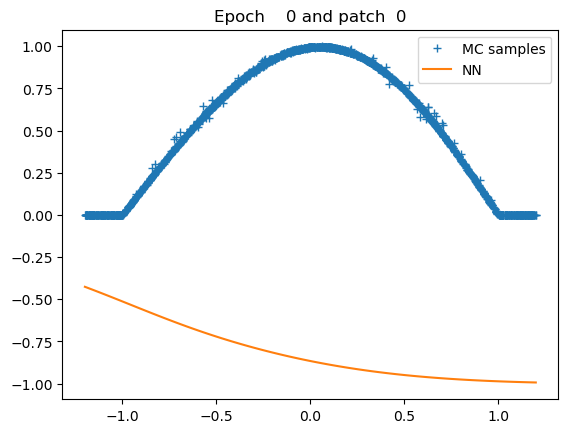

Patch  0: epoch  500 with loss 7.82E-05


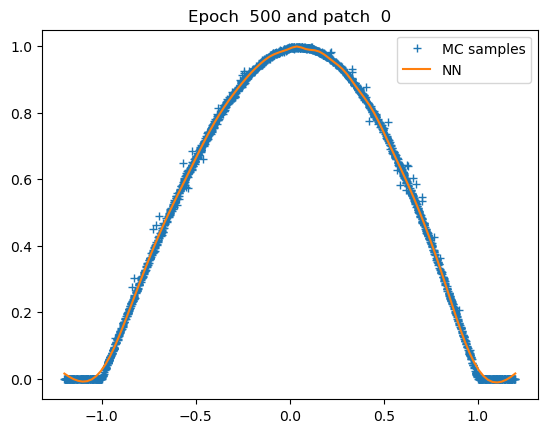

Patch  0: epoch 1000 with loss 7.35E-05


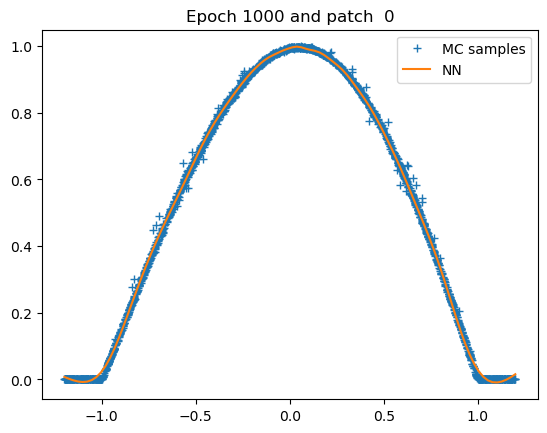

Patch  0: epoch 1500 with loss 7.10E-05


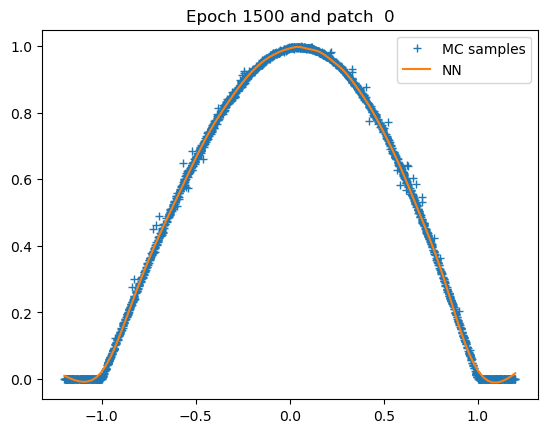

Patch  0: epoch 2000 with loss 6.94E-05


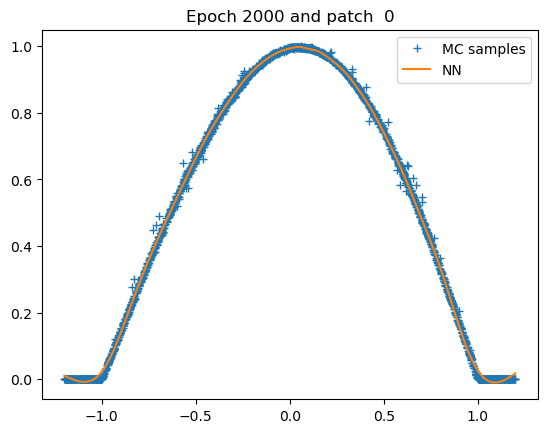

Patch  0: epoch 2500 with loss 6.93E-05


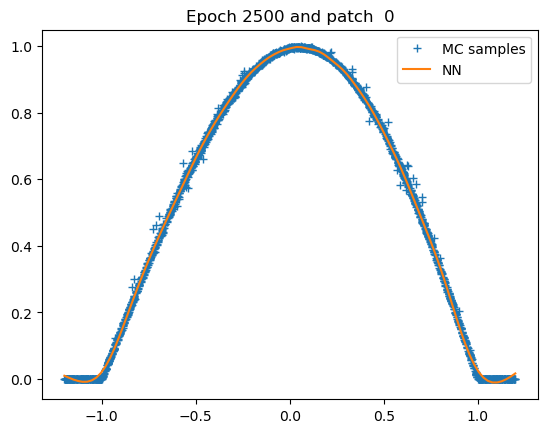

Patch  0: epoch 3000 with loss 6.91E-05


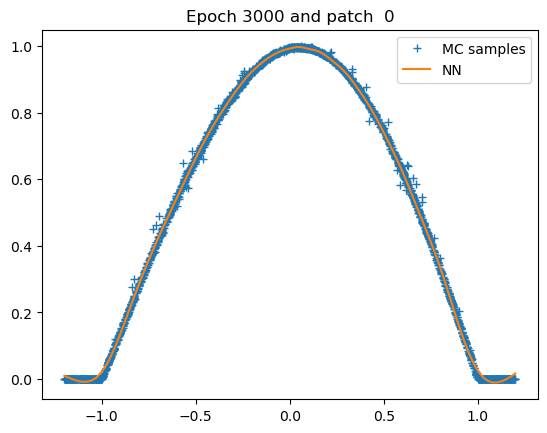

Patch  0: epoch 3500 with loss 6.88E-05


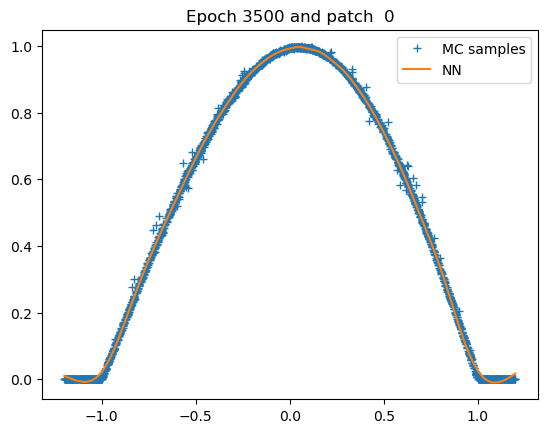

Patch  0: epoch 4000 with loss 6.84E-05


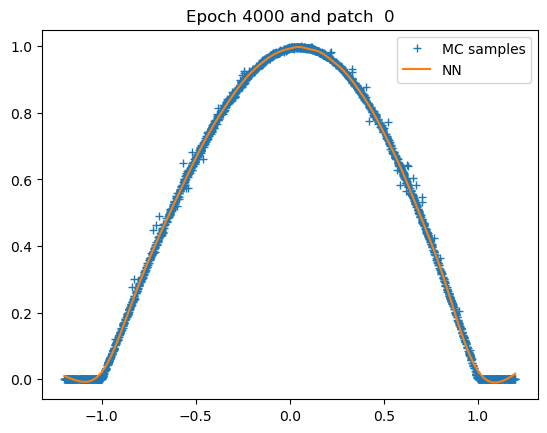

Patch  0: epoch 4500 with loss 6.80E-05


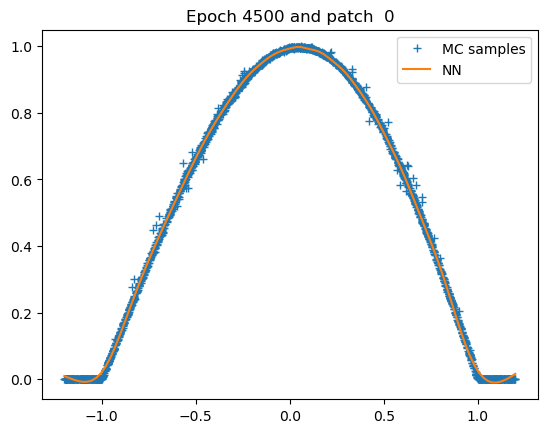

Patch  0: epoch 4999 with loss 6.74E-05


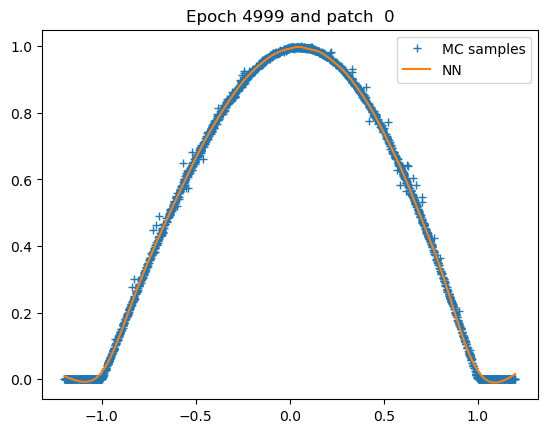

Patch 0: training of u with 5000 epochs take 42.324265003204346 seconds.
Patch 1: generation of u samples take 16.450519800186157 seconds.
Patch  1: epoch    0 with loss 2.19E+00


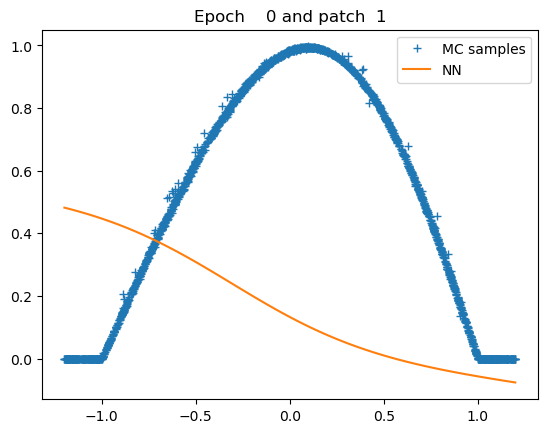

Patch  1: epoch  500 with loss 9.83E-05


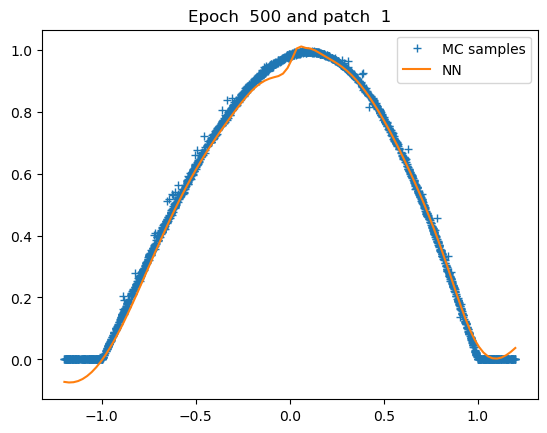

Patch  1: epoch 1000 with loss 5.30E-05


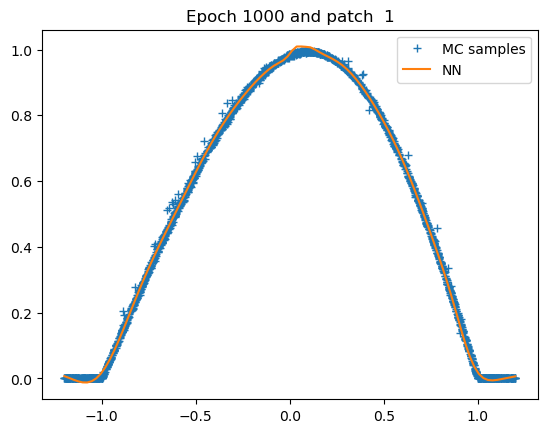

Patch  1: epoch 1500 with loss 5.07E-05


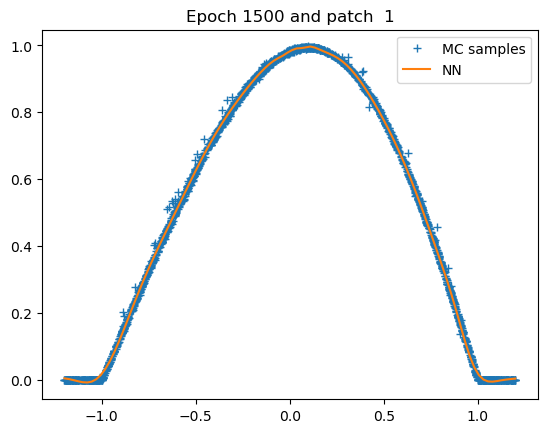

Patch  1: epoch 2000 with loss 4.89E-05


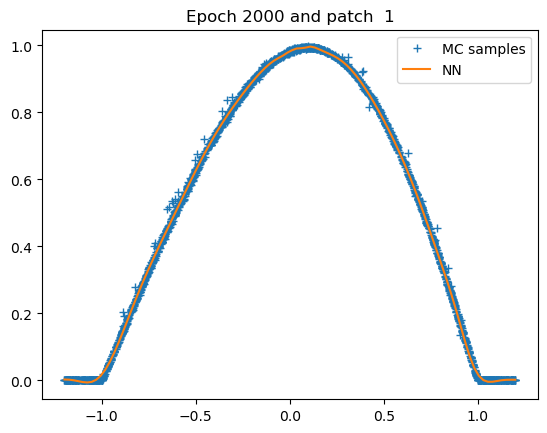

Patch  1: epoch 2500 with loss 4.87E-05


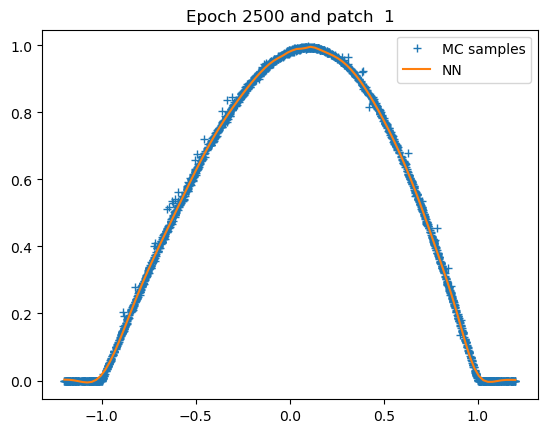

Patch  1: epoch 3000 with loss 4.85E-05


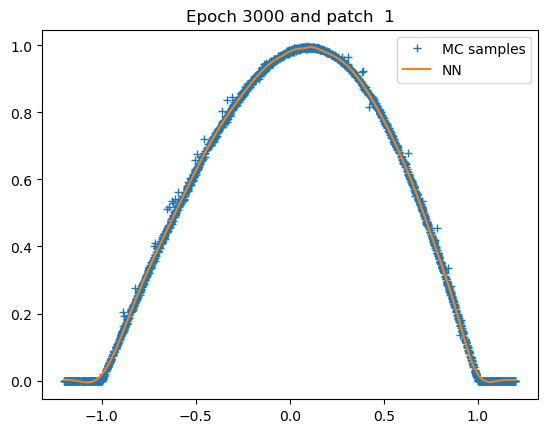

Patch  1: epoch 3500 with loss 4.82E-05


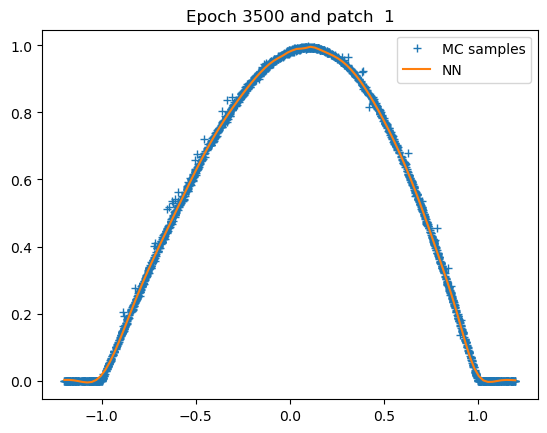

Patch  1: epoch 4000 with loss 4.79E-05


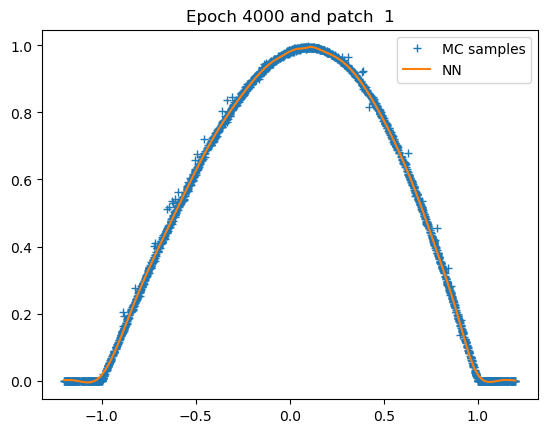

Patch  1: epoch 4500 with loss 4.74E-05


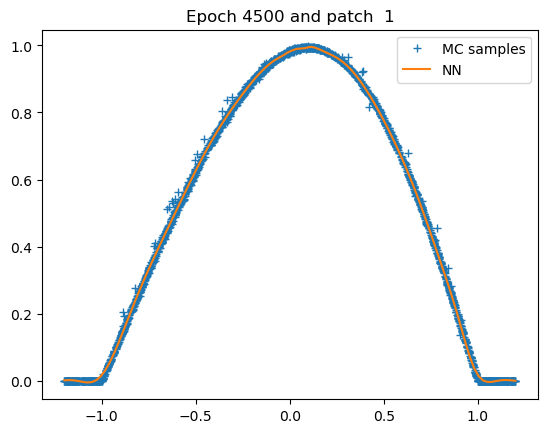

Patch  1: epoch 4999 with loss 4.70E-05


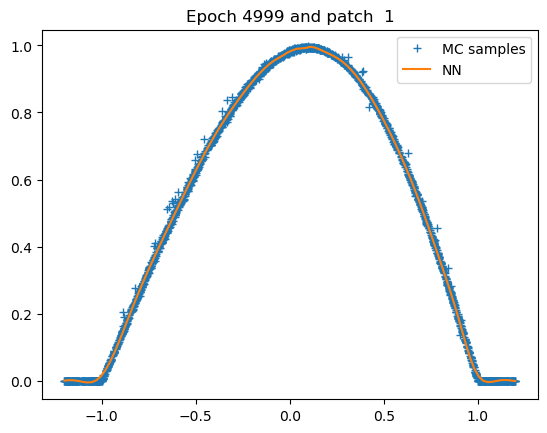

Patch 1: training of u with 5000 epochs take 37.818702697753906 seconds.
Patch 2: generation of u samples take 13.076688289642334 seconds.
Patch  2: epoch    0 with loss 1.49E+00


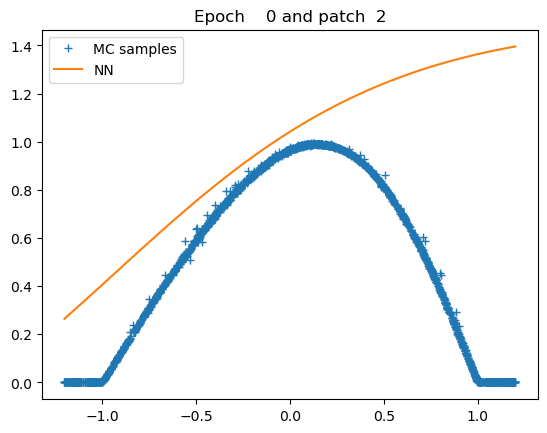

Patch  2: epoch  500 with loss 8.76E-05


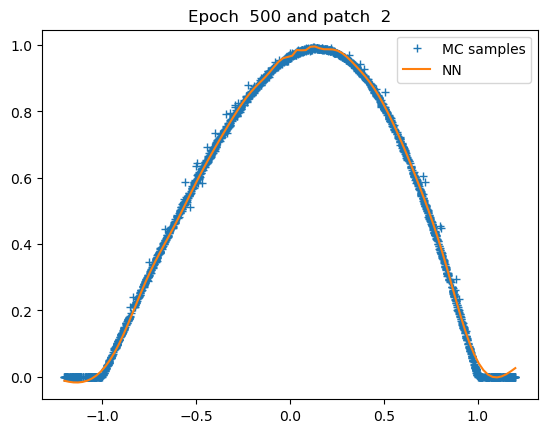

Patch  2: epoch 1000 with loss 5.68E-05


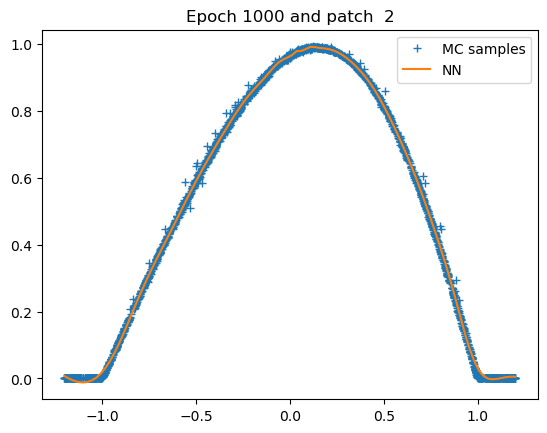

Patch  2: epoch 1500 with loss 5.57E-05


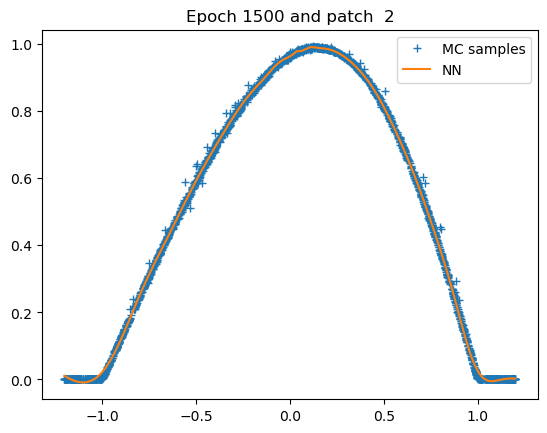

Patch  2: epoch 2000 with loss 5.46E-05


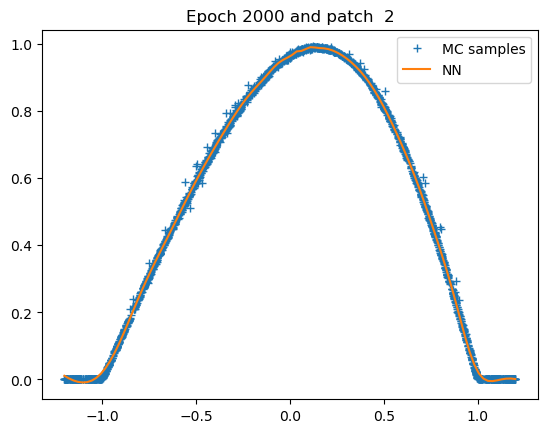

Patch  2: epoch 2500 with loss 5.44E-05


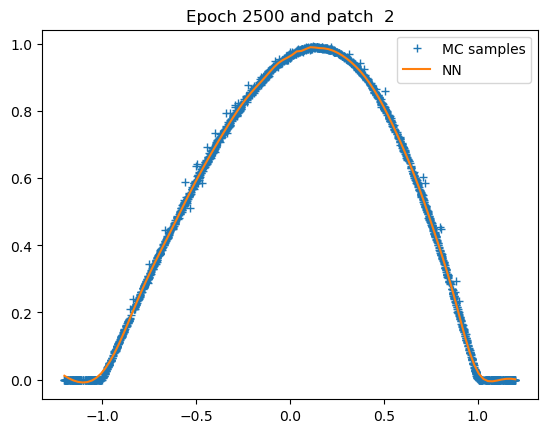

Patch  2: epoch 3000 with loss 5.43E-05


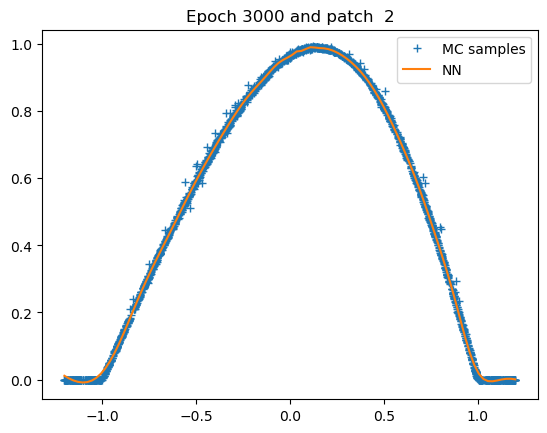

Patch  2: epoch 3500 with loss 5.41E-05


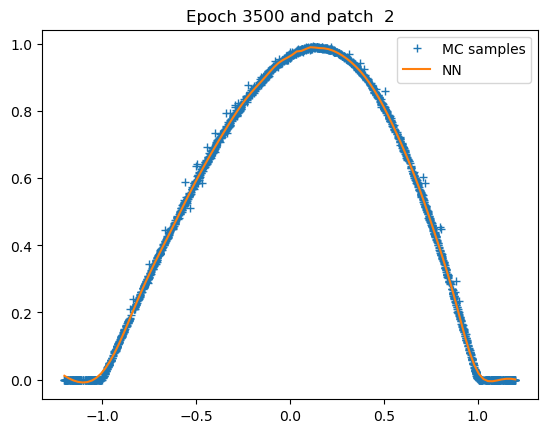

Patch  2: epoch 4000 with loss 5.38E-05


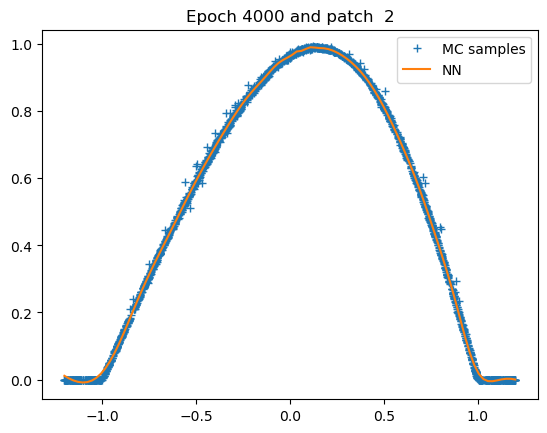

Patch  2: epoch 4500 with loss 5.35E-05


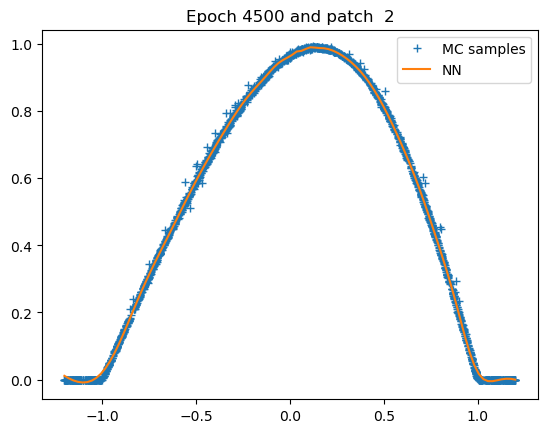

Patch  2: epoch 4999 with loss 5.31E-05


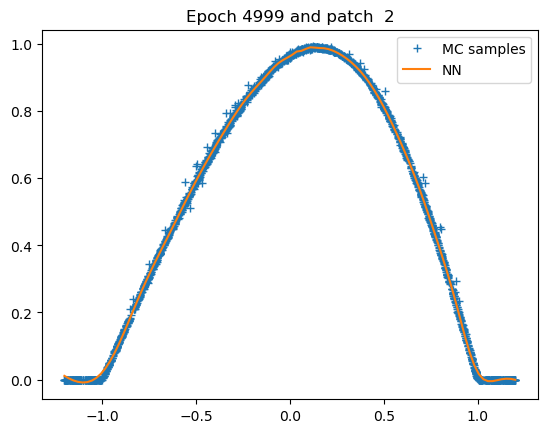

Patch 2: training of u with 5000 epochs take 39.24832320213318 seconds.
Patch 3: generation of u samples take 13.308046340942383 seconds.
Patch  3: epoch    0 with loss 3.70E+00


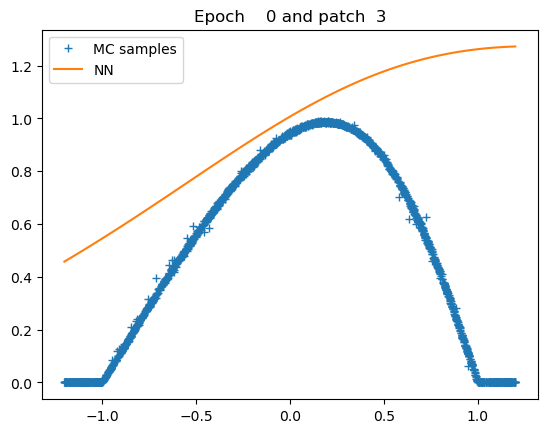

Patch  3: epoch  500 with loss 1.13E-04


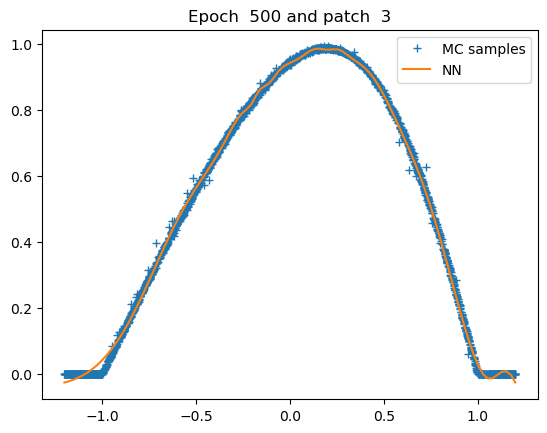

Patch  3: epoch 1000 with loss 6.16E-05


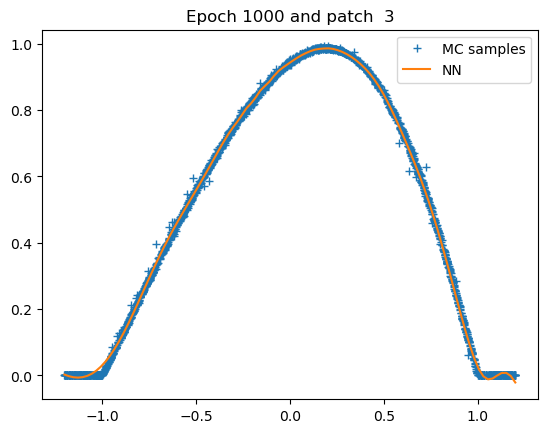

Patch  3: epoch 1500 with loss 5.91E-05


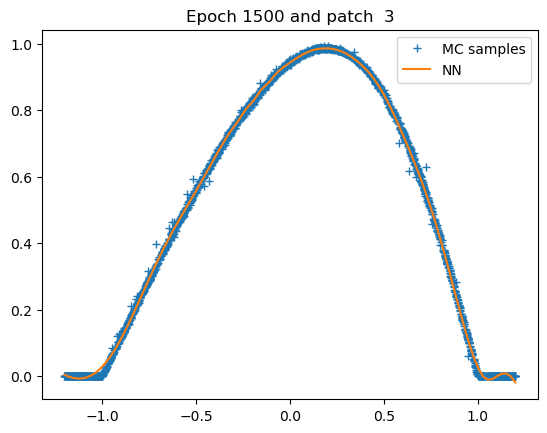

Patch  3: epoch 2000 with loss 5.65E-05


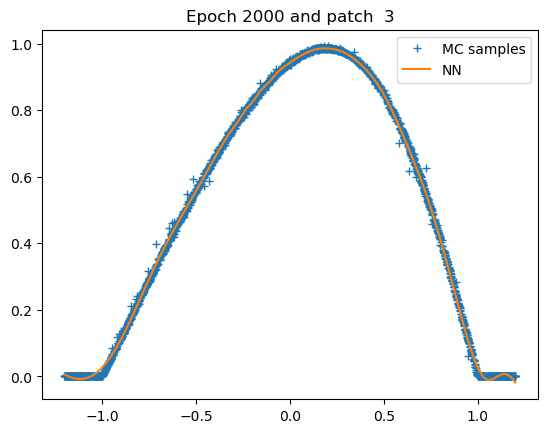

Patch  3: epoch 2500 with loss 5.62E-05


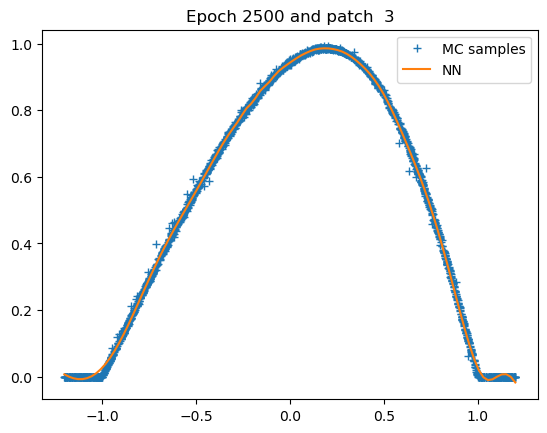

Patch  3: epoch 3000 with loss 5.58E-05


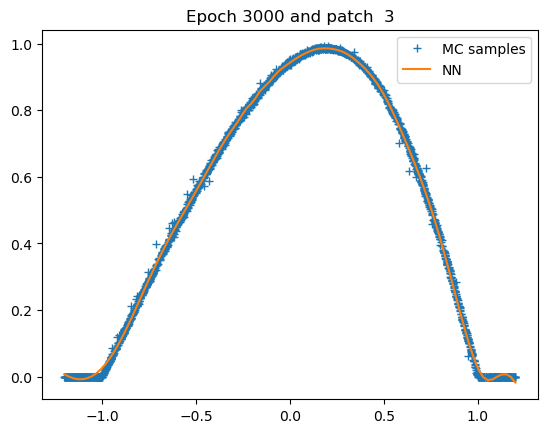

Patch  3: epoch 3500 with loss 5.54E-05


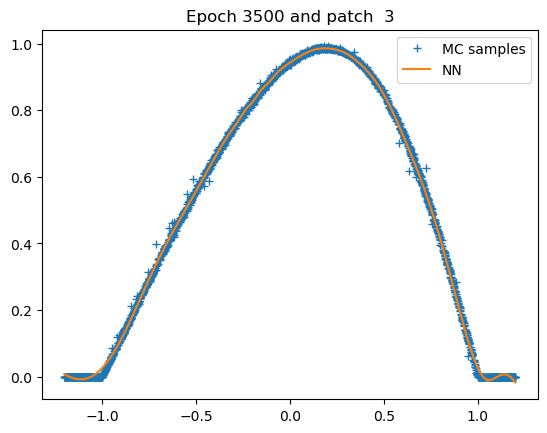

Patch  3: epoch 4000 with loss 5.48E-05


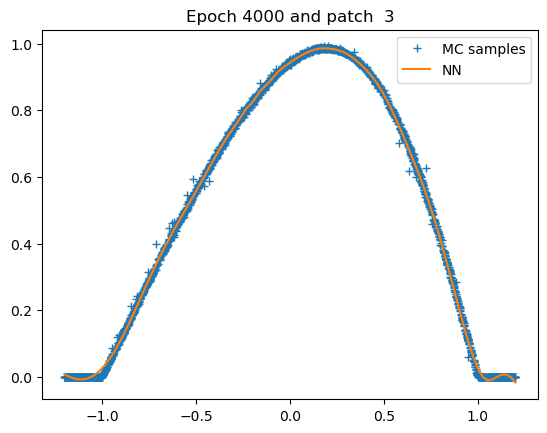

Patch  3: epoch 4500 with loss 5.42E-05


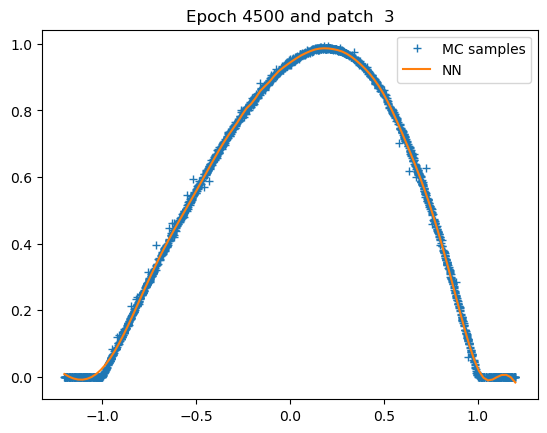

Patch  3: epoch 4999 with loss 5.35E-05


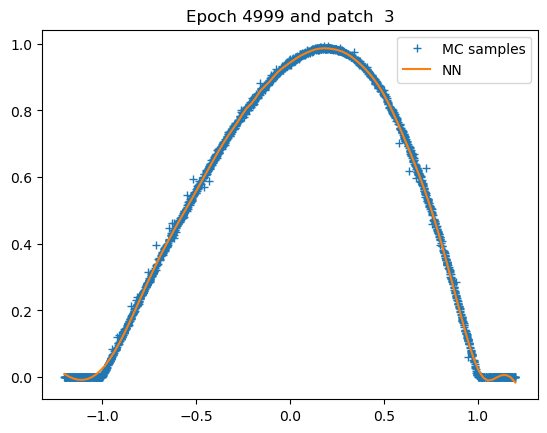

Patch 3: training of u with 5000 epochs take 39.33245825767517 seconds.
/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:74: RuntimeWarning: divide by zero encountered in divide
  branch_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())
Logs are saved in /home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/logs/tmp


Time taken: 214 seconds; L1 error: 1.82E-02; L2 error: 4.65E-04; rel error: INF.
fdb runtime: 0 seconds; total runtime: 214 seconds.
#### Starting deep galerkin method with seed 0 - 1 out of 1 times


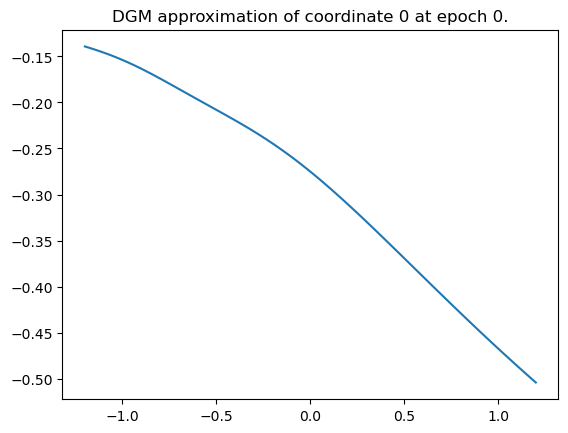

Epoch 0 with loss 1.5484681129455566


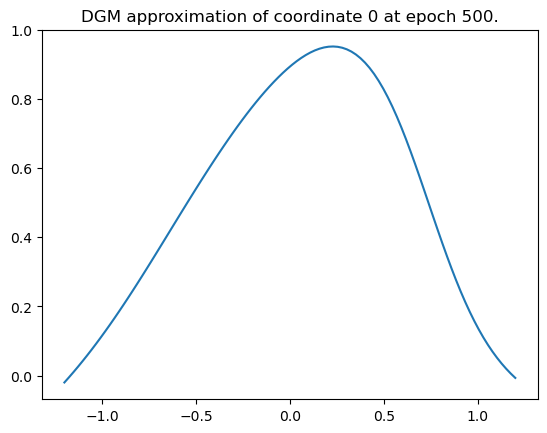

Epoch 500 with loss 0.00875838939100504


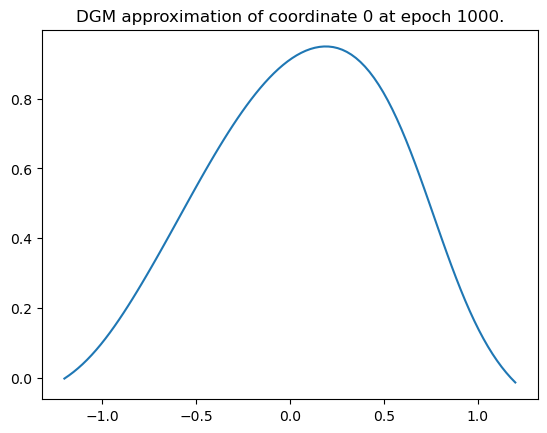

Epoch 1000 with loss 0.006329490803182125


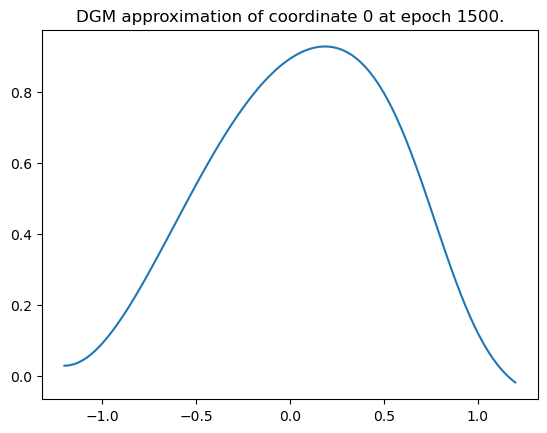

Epoch 1500 with loss 0.007209875155240297


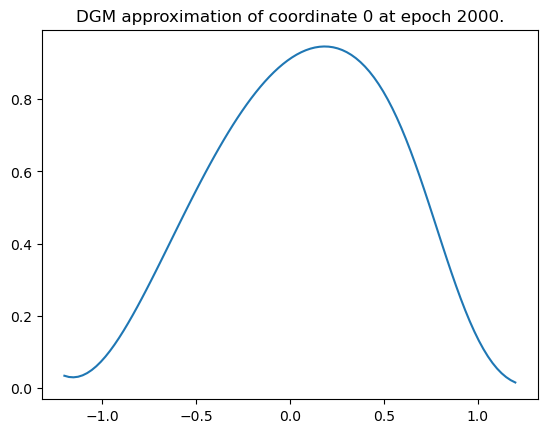

Epoch 2000 with loss 0.004572526551783085


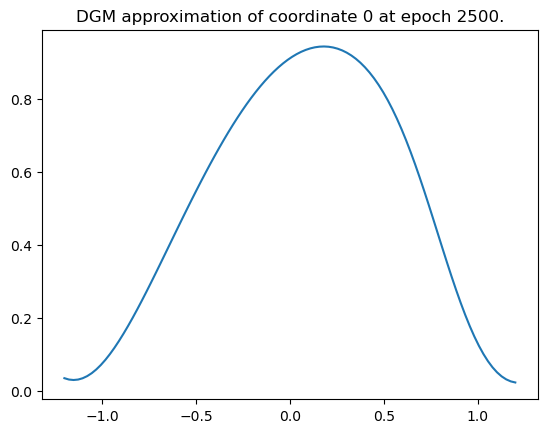

Epoch 2500 with loss 0.004201185889542103


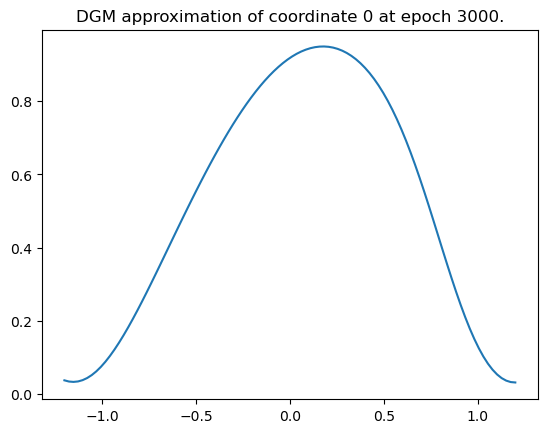

Epoch 3000 with loss 0.0038178772665560246


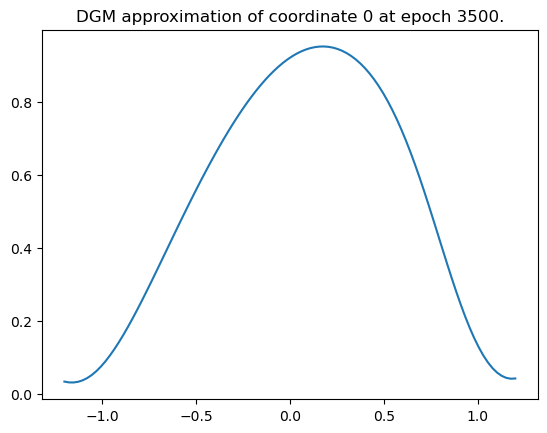

Epoch 3500 with loss 0.0042612263932824135


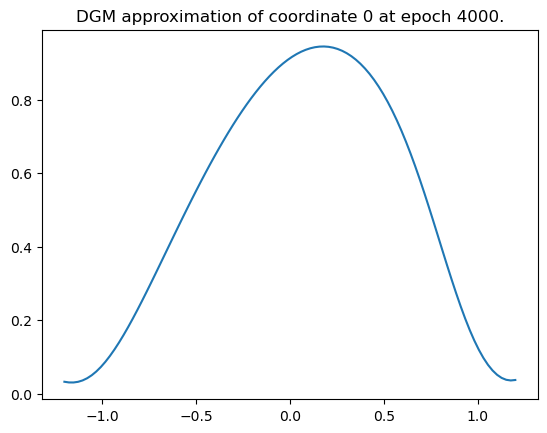

Epoch 4000 with loss 0.0035333489067852497


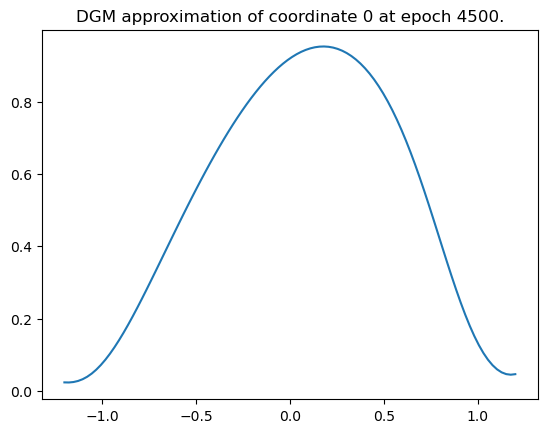

Epoch 4500 with loss 0.0037039131857454777


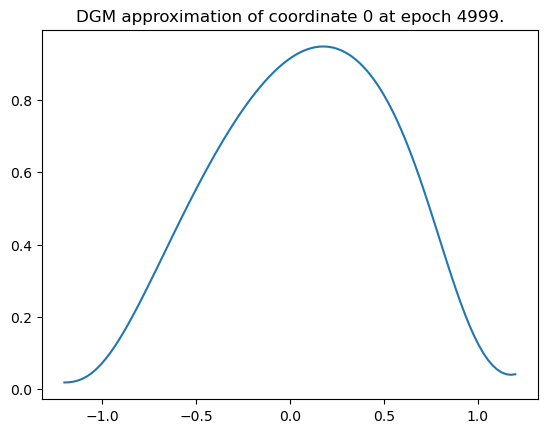

Epoch 4999 with loss 0.003272219095379114
Training of neural network with 5000 epochs take 186.8366937637329 seconds.


Time taken: 187 seconds; L1 error: 1.13E-02; L2 error: 6.61E-04; rel error: INF.
#### Starting deep BSDE method with seed 0 - 1 out of 1 times


/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:101: RuntimeWarning: divide by zero encountered in divide
  dgm_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())


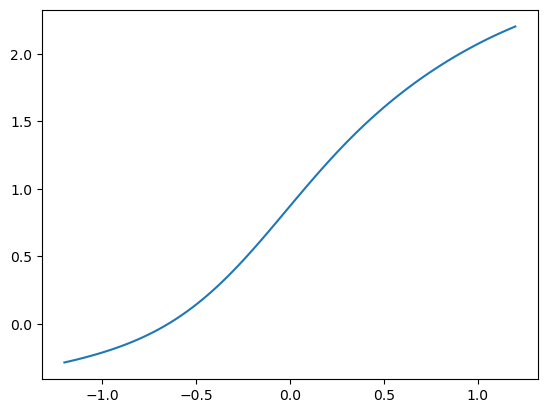

Epoch 0 with loss 1.0930672883987427


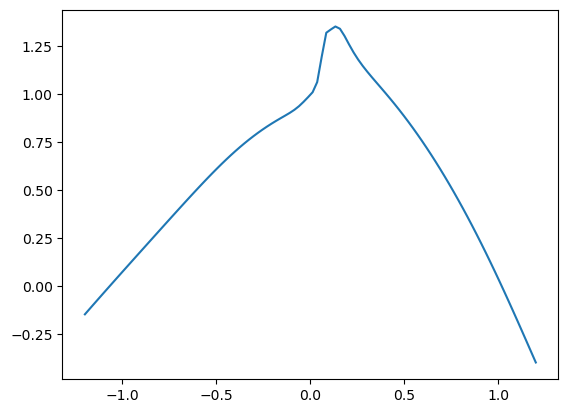

Epoch 500 with loss 0.0007650454645045102


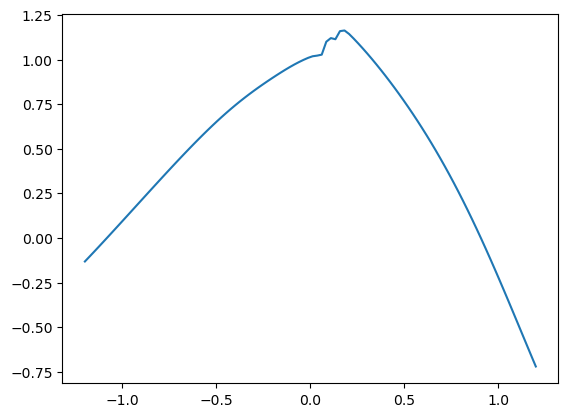

Epoch 1000 with loss 0.0007825843640603125


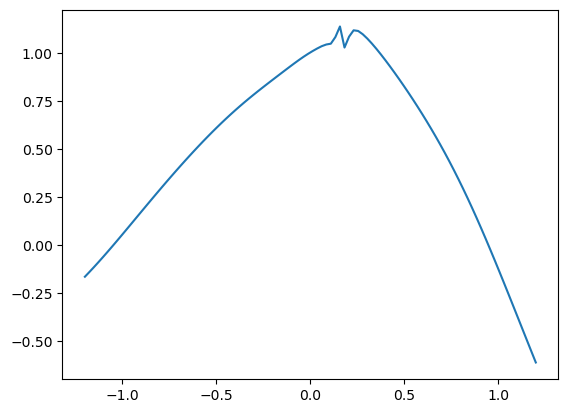

Epoch 1500 with loss 0.0014501952100545168


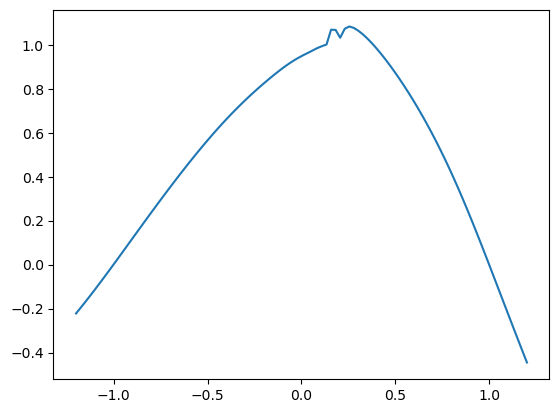

Epoch 2000 with loss 0.0006326891016215086


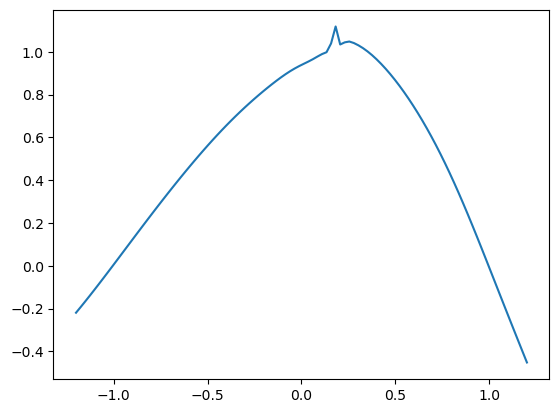

Epoch 2500 with loss 0.00048781081568449736


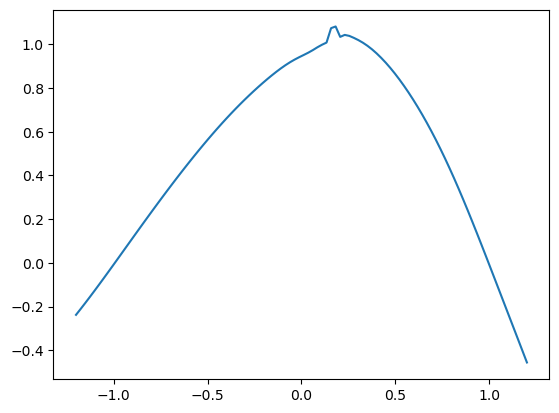

Epoch 3000 with loss 0.00026355343288742006


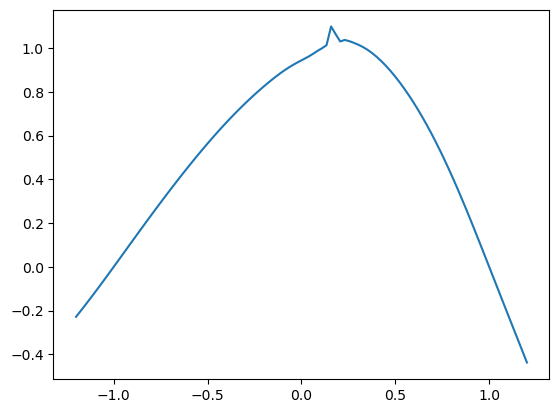

Epoch 3500 with loss 0.0010053612058982253


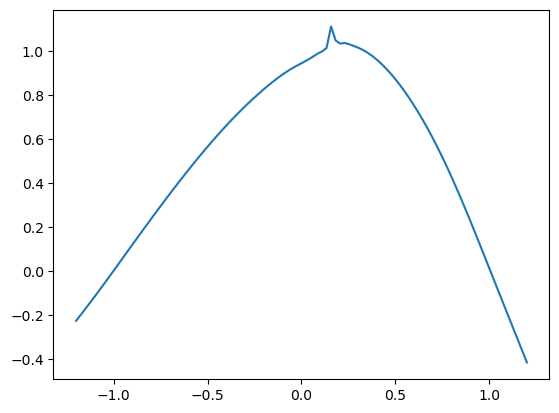

Epoch 4000 with loss 0.00014928595919627696


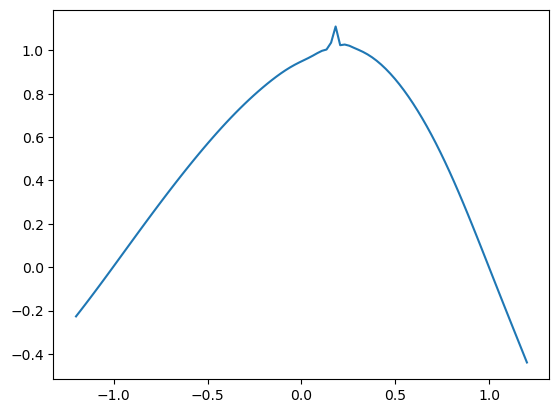

Epoch 4500 with loss 0.000317571684718132


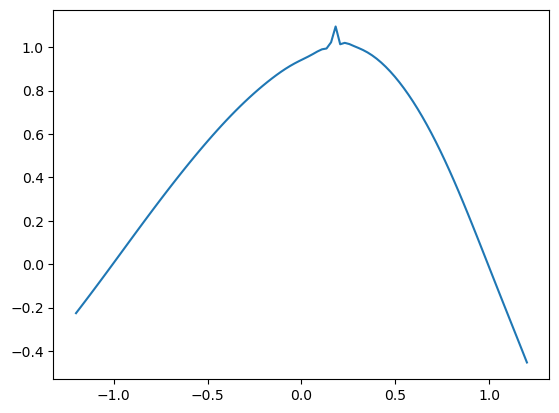

Epoch 4999 with loss 0.0004955344484187663
Training of neural network with 5000 epochs take 239.28343415260315 seconds.
Time taken: 239 seconds; L1 error: 2.67E-02; L2 error: 1.23E-03; rel error: INF.




######## Summary for deep branching method
runtime:        214
fdb runtime:    0
total runtime:  214
mean L1 error:  1.82E-02
std L1 error:   0.00E+00
mean L2 error:  4.65E-04
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


######## Summary for deep galerkin method
runtime:        187
mean L1 error:  1.13E-02
std L1 error:   0.00E+00
mean L2 error:  6.61E-04
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


######## Summary for deep BSDE method
runtime:        239
mean L1 error:  2.67E-02
std L1 error:   0.00E+00
mean L2 error:  1.23E-03
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:129: RuntimeWarning: divide by zero encountered in divide
  bsde_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)


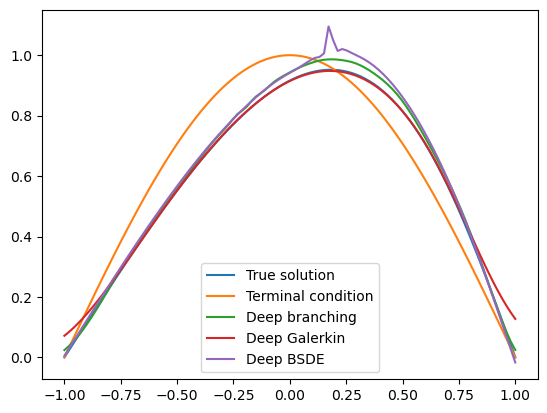

In [6]:
dim = 1
T=0.1/dim
grid_d_dim = np.concatenate((x_mid * np.ones((0, 100)), np.expand_dims(grid, axis=0), x_mid * np.ones((dim - 1, 100))), axis=0)
grid_d_dim_with_t = np.concatenate((t_lo * np.ones((1, 100)), grid_d_dim), axis=0)
true = exact_example(t_lo, grid_d_dim, T)
terminal = exact_example(T, grid_d_dim, T)
deriv_map = np.concatenate((np.array([[0] * dim]), 1 * np.identity(dim), 2 * np.identity(dim)), axis=0).astype(int)

# Performance comparison
compare_performance(grid, grid_d_dim, grid_d_dim_with_t, t_lo, true, terminal=terminal, seeds=[0],
                    # disable_branch=True,
                    # disable_bsde=True, 
                    # disable_galerkin=True, 
                    verbose=True, debug_mode=True, 
                    conditional_probability_to_survive=partial(conditional_probability_to_survive),
                    is_x_inside=partial(is_x_inside), 
                    y_lo=x_lo, y_hi=x_hi, nu=nu,
                    T=T, device=device, epochs=5000, fname="burgers",
                    branch_nb_states=2000, branch_nb_path_per_state=5000,
                    branch_patches=4, branch_exponential_lambda=-math.log(.95)/T,
                    branch_nb_states_per_batch=1000,
                    second_order=True, bsde_nb_states=1000, bsde_nb_time_intervals=4,
                    dgm_nb_states=10000, f_fun=f_example, dgm_f_fun=dgm_f_example,
                    deriv_map=deriv_map, dgm_deriv_map=deriv_map, phi_fun=phi_example,
                    boundary_fun=boundary_fun, dgm_overtrain_rate=0, outlier_percentile=5,
                    lr_gamma=0.1, branch_lr=1e-2, branch_activation="tanh", neurons=20, layers=8,
                    save_for_best_model=False, save_as_tmp=True)

## dim = 2

Logs are saved in /home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/logs/tmp


#### Starting deep branching method with seed 0 - 1 out of 1 times


Patch 0: generation of u samples take 307.6229884624481 seconds.
Patch  0: epoch    0 with loss 8.38E-01


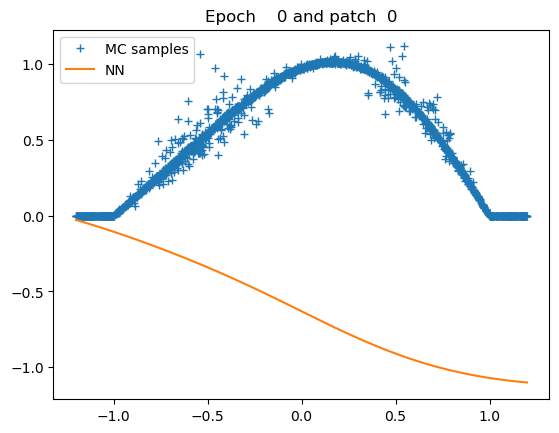

Patch  0: epoch  500 with loss 1.51E-03


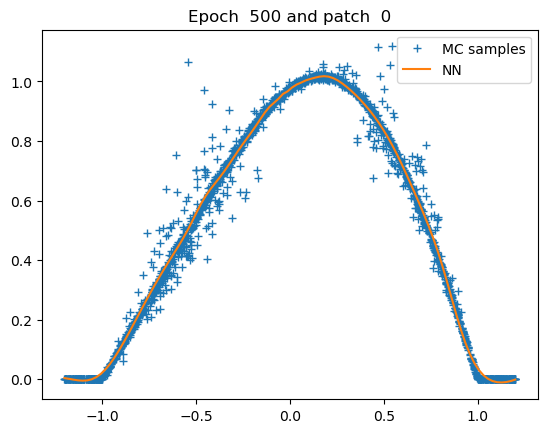

Patch  0: epoch 1000 with loss 1.65E-03


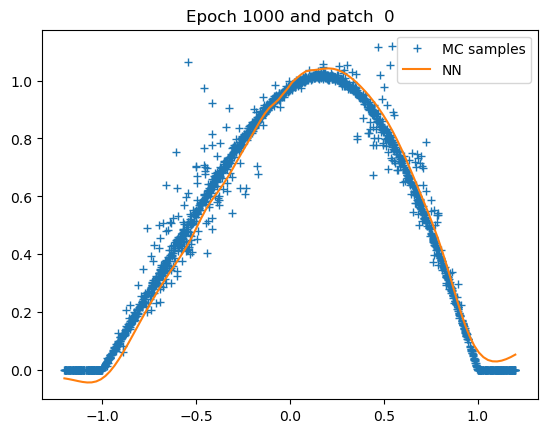

Patch  0: epoch 1500 with loss 1.50E-03


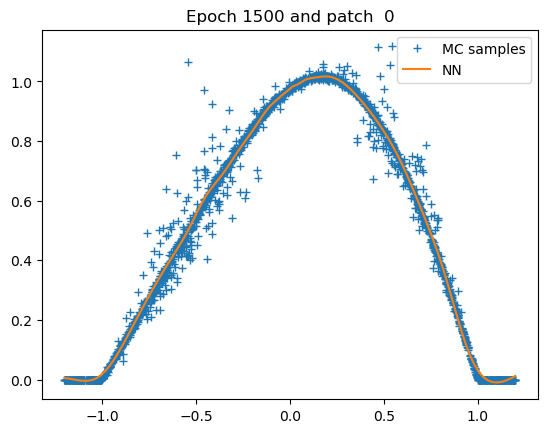

Patch  0: epoch 2000 with loss 1.50E-03


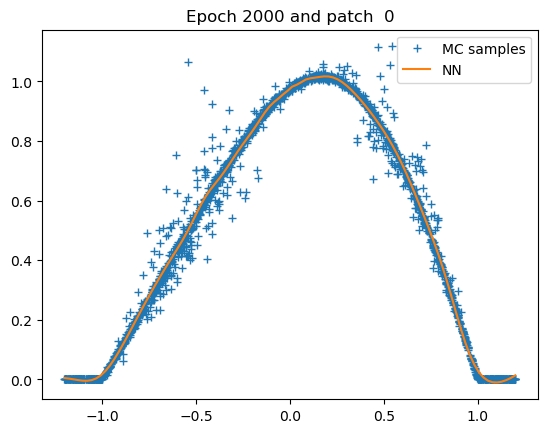

Patch  0: epoch 2500 with loss 1.50E-03


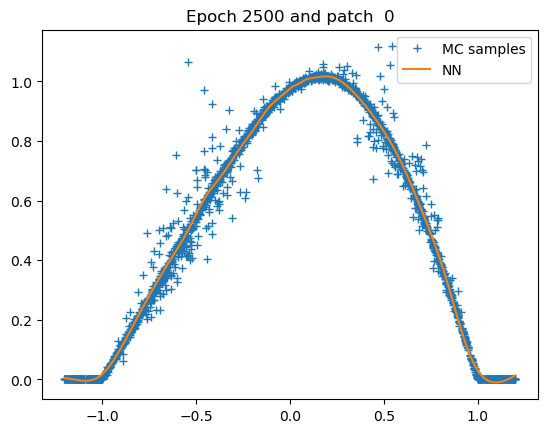

Patch  0: epoch 3000 with loss 1.50E-03


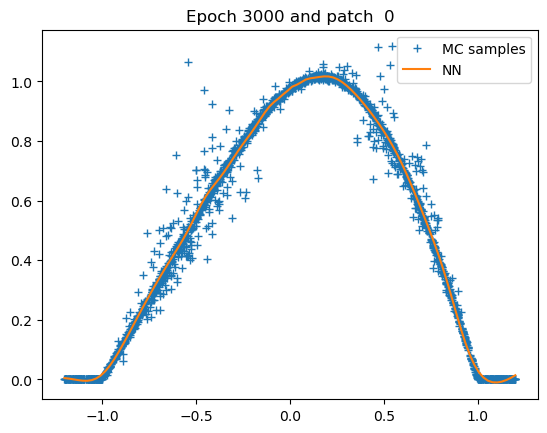

Patch  0: epoch 3500 with loss 1.50E-03


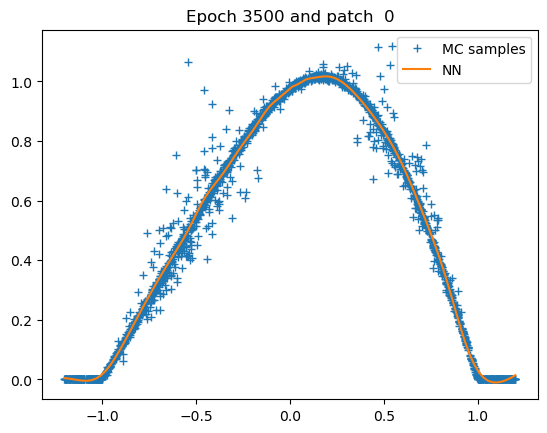

Patch  0: epoch 4000 with loss 1.50E-03


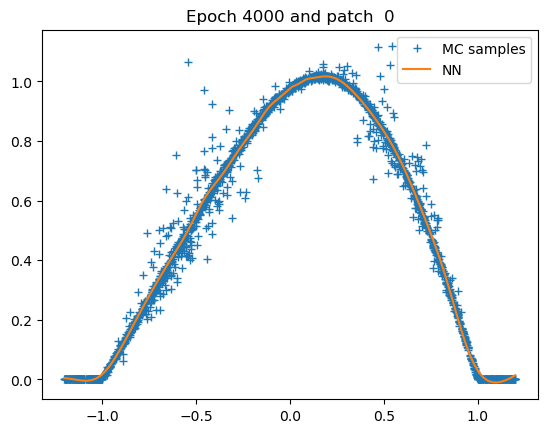

Patch  0: epoch 4500 with loss 1.50E-03


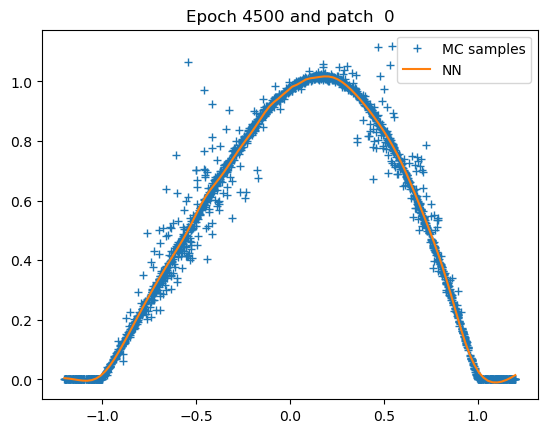

Patch  0: epoch 4999 with loss 1.50E-03


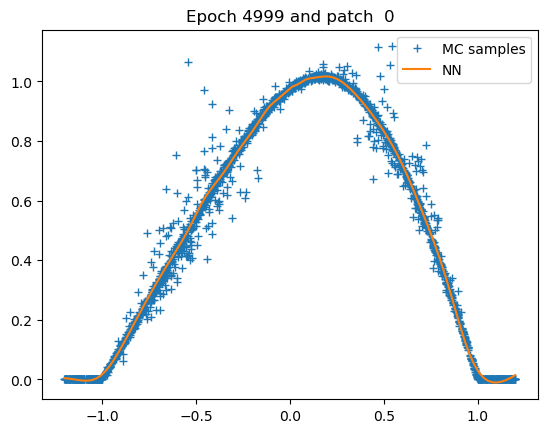

Patch 0: training of u with 5000 epochs take 42.398383140563965 seconds.
/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:74: RuntimeWarning: divide by zero encountered in divide
  branch_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())
Logs are saved in /home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/logs/tmp


Time taken: 350 seconds; L1 error: 2.34E-02; L2 error: 1.01E-03; rel error: INF.
fdb runtime: 0 seconds; total runtime: 350 seconds.
#### Starting deep galerkin method with seed 0 - 1 out of 1 times


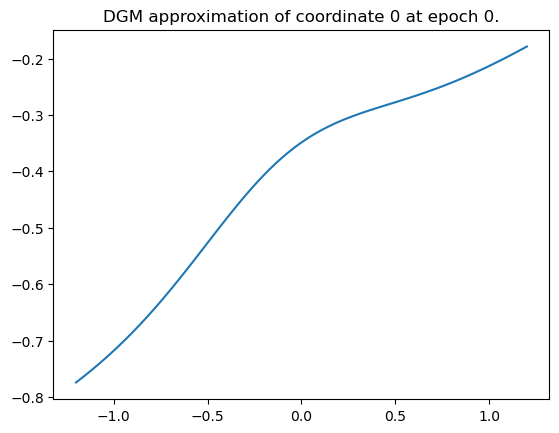

Epoch 0 with loss 3.5210304260253906


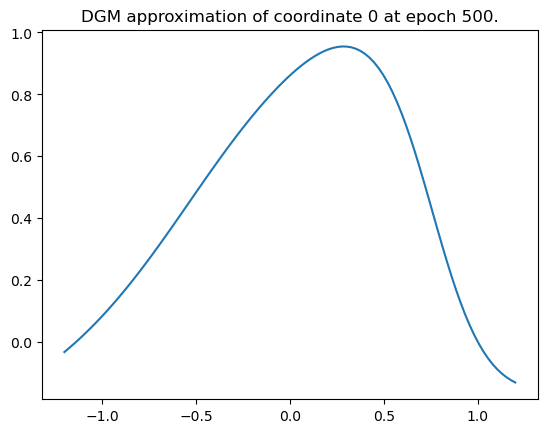

Epoch 500 with loss 0.17124298214912415


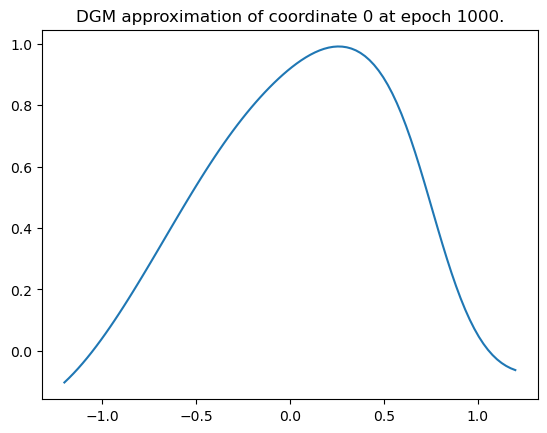

Epoch 1000 with loss 0.13584262132644653


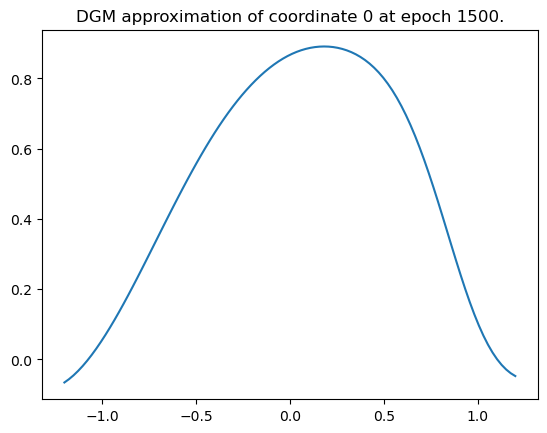

Epoch 1500 with loss 0.11615961790084839


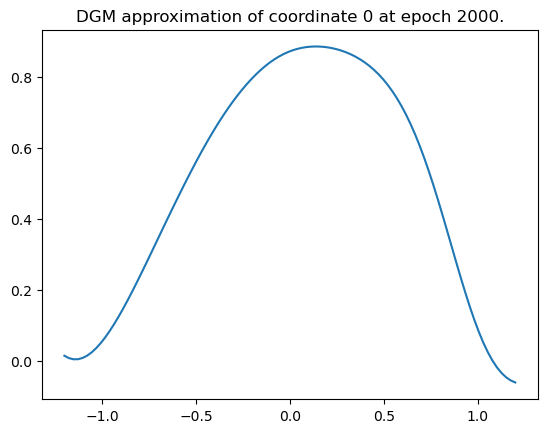

Epoch 2000 with loss 0.0870807021856308


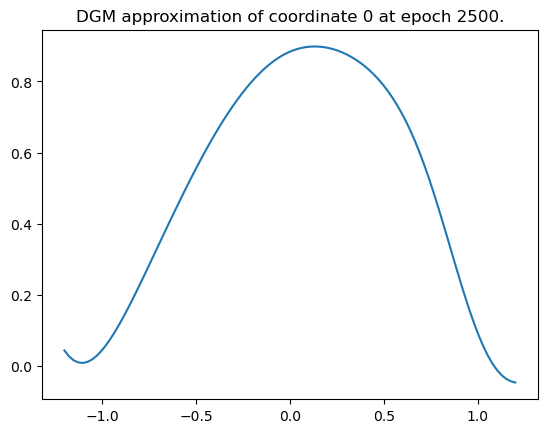

Epoch 2500 with loss 0.07340623438358307


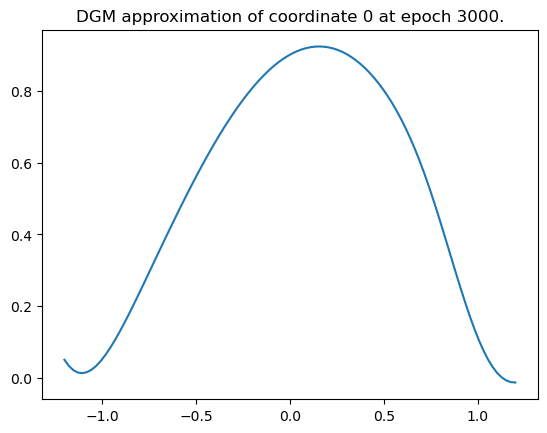

Epoch 3000 with loss 0.061634328216314316


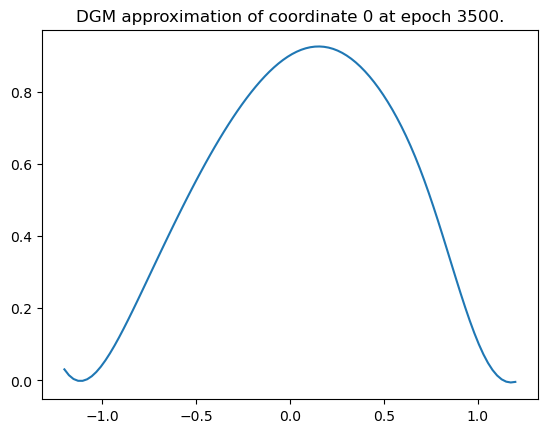

Epoch 3500 with loss 0.05621791630983353


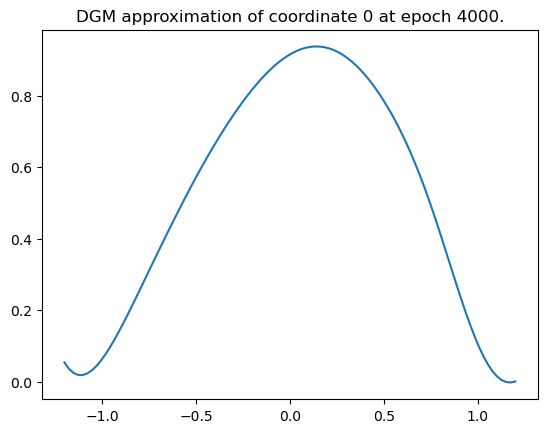

Epoch 4000 with loss 0.05408627167344093


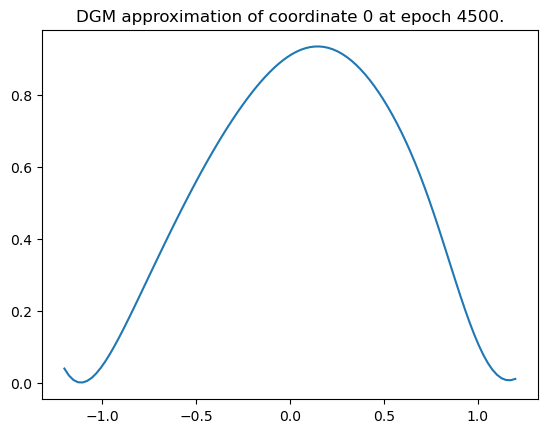

Epoch 4500 with loss 0.0493571013212204


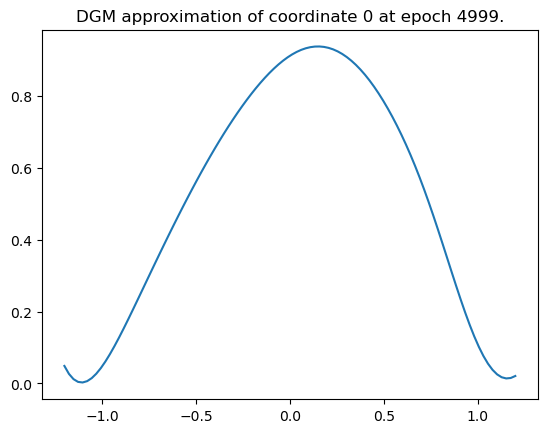

Epoch 4999 with loss 0.045006901025772095
Training of neural network with 5000 epochs take 246.9278380870819 seconds.


Time taken: 247 seconds; L1 error: 1.77E-02; L2 error: 6.42E-04; rel error: INF.
#### Starting deep BSDE method with seed 0 - 1 out of 1 times


/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:101: RuntimeWarning: divide by zero encountered in divide
  dgm_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())


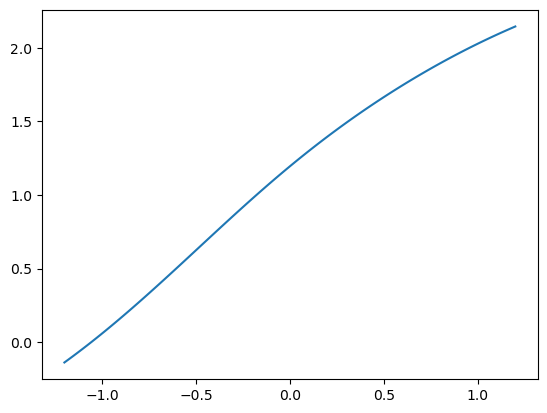

Epoch 0 with loss 1.70512056350708


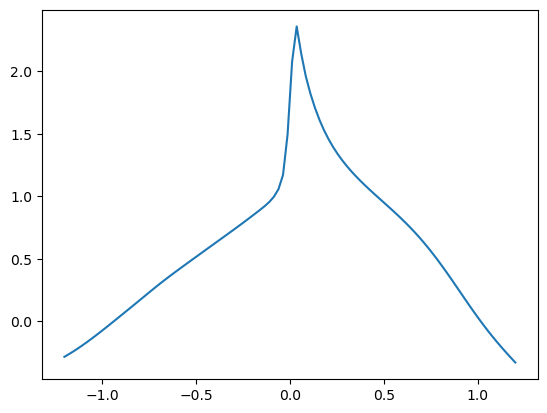

Epoch 500 with loss 0.002220827154815197


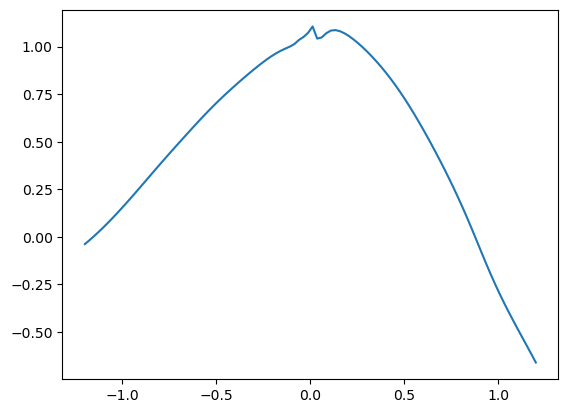

Epoch 1000 with loss 0.007022573612630367


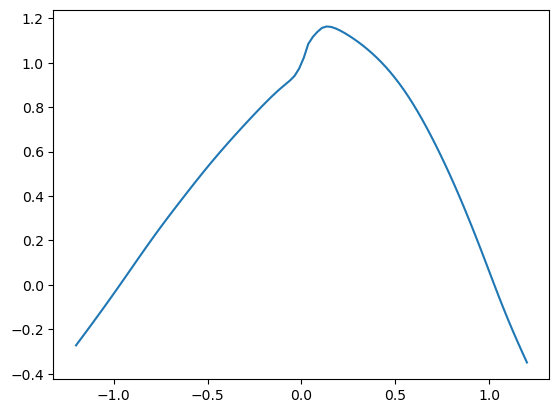

Epoch 1500 with loss 0.0005835946067236364


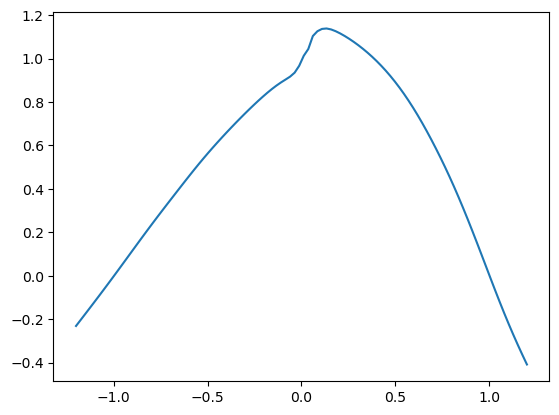

Epoch 2000 with loss 0.00038094428600743413


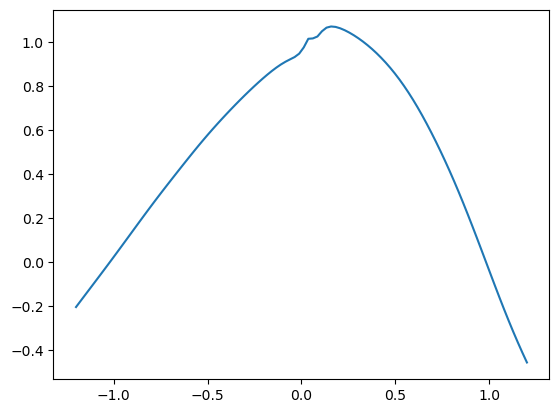

Epoch 2500 with loss 0.003327484242618084


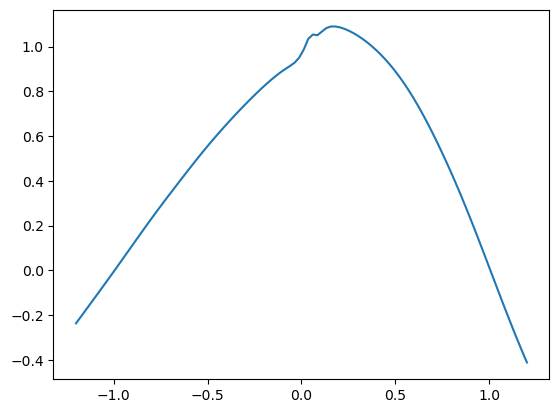

Epoch 3000 with loss 0.00028187132556922734


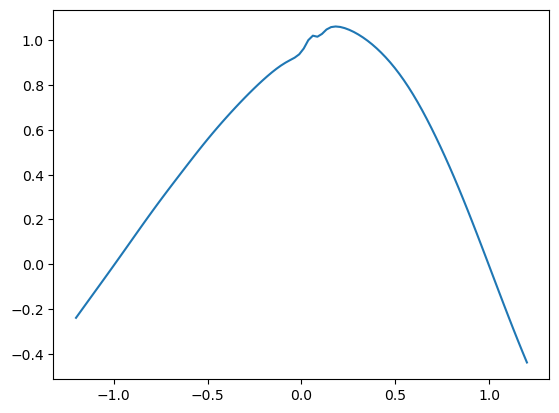

Epoch 3500 with loss 0.0010517517803236842


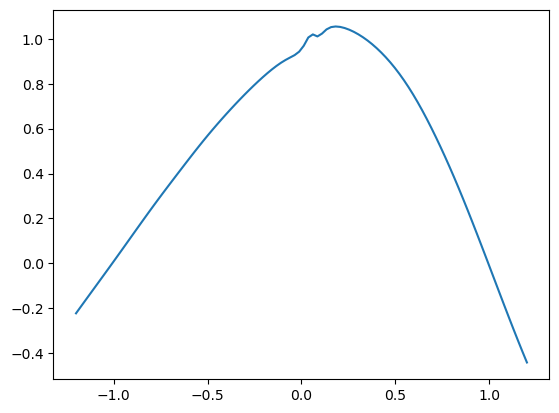

Epoch 4000 with loss 0.0017199499998241663


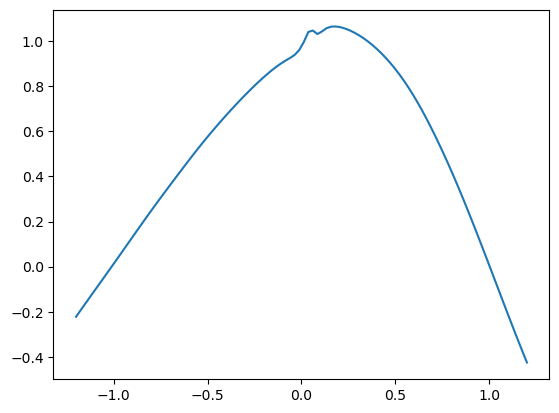

Epoch 4500 with loss 0.00030942383455112576


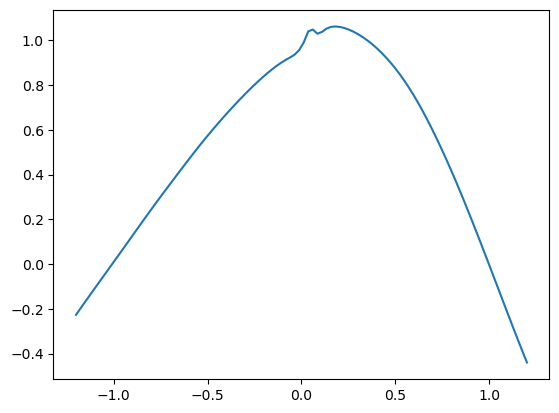

Epoch 4999 with loss 0.0004511747101787478
Training of neural network with 5000 epochs take 230.10412621498108 seconds.
Time taken: 230 seconds; L1 error: 3.88E-02; L2 error: 2.54E-03; rel error: INF.




######## Summary for deep branching method
runtime:        350
fdb runtime:    0
total runtime:  350
mean L1 error:  2.34E-02
std L1 error:   0.00E+00
mean L2 error:  1.01E-03
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


######## Summary for deep galerkin method
runtime:        247
mean L1 error:  1.77E-02
std L1 error:   0.00E+00
mean L2 error:  6.42E-04
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


######## Summary for deep BSDE method
runtime:        230
mean L1 error:  3.88E-02
std L1 error:   0.00E+00
mean L2 error:  2.54E-03
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:129: RuntimeWarning: divide by zero encountered in divide
  bsde_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)


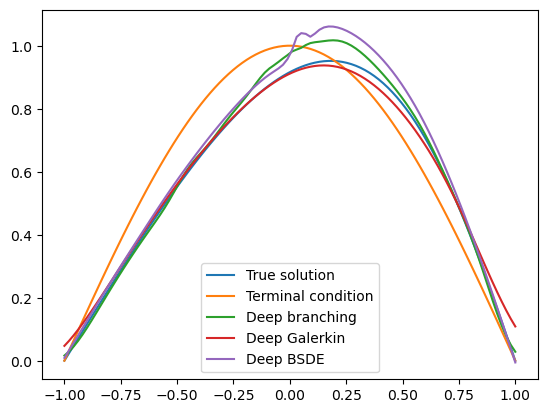

In [7]:
dim = 2
T=0.1/dim

grid_d_dim = np.concatenate((x_mid * np.ones((0, 100)), np.expand_dims(grid, axis=0), x_mid * np.ones((dim - 1, 100))), axis=0)
grid_d_dim_with_t = np.concatenate((t_lo * np.ones((1, 100)), grid_d_dim), axis=0)    
true = exact_example(t_lo, grid_d_dim, T)
terminal = exact_example(T, grid_d_dim, T)
deriv_map = np.concatenate((np.array([[0] * dim]), 1 * np.identity(dim), 2 * np.identity(dim)), axis=0).astype(int)

# Performance comparison
compare_performance(grid, grid_d_dim, grid_d_dim_with_t, t_lo, true, terminal=terminal, seeds=[0],
                    # disable_branch=True,
                    # disable_bsde=True, 
                    # disable_galerkin=True, 
                    verbose=True, debug_mode=True, 
                    conditional_probability_to_survive=partial(conditional_probability_to_survive),
                    is_x_inside=partial(is_x_inside), 
                    y_lo=x_lo, y_hi=x_hi, nu=nu,
                    T=T, device=device, epochs=5000, fname="burgers",
                    branch_nb_states=2000, branch_nb_path_per_state=5000,
                    branch_patches=1, branch_exponential_lambda=-math.log(.95)/T,
                    branch_nb_states_per_batch=1000,
                    second_order=True, bsde_nb_states=1000, bsde_nb_time_intervals=4,
                    dgm_nb_states=10000, f_fun=f_example, dgm_f_fun=dgm_f_example,
                    deriv_map=deriv_map, dgm_deriv_map=deriv_map, phi_fun=phi_example,
                    boundary_fun=boundary_fun, dgm_overtrain_rate=0, outlier_percentile=5,
                    lr_gamma=0.1, branch_lr=1e-2, branch_activation="tanh", neurons=20, layers=8,
                    save_for_best_model=False, save_as_tmp=True)

## dim = 3

Logs are saved in /home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/logs/tmp


#### Starting deep branching method with seed 0 - 1 out of 1 times


Patch 0: generation of u samples take 706.2330129146576 seconds.
Patch  0: epoch    0 with loss 2.83E+00


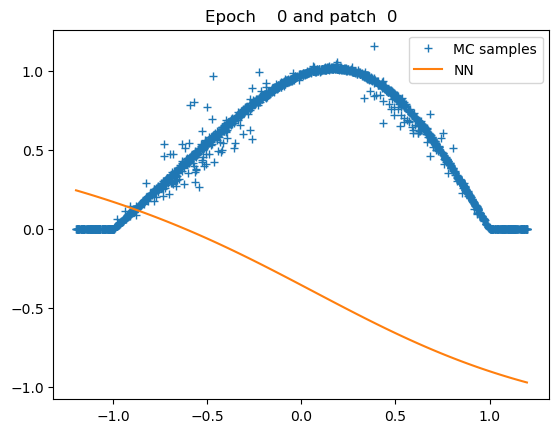

Patch  0: epoch  500 with loss 1.29E-03


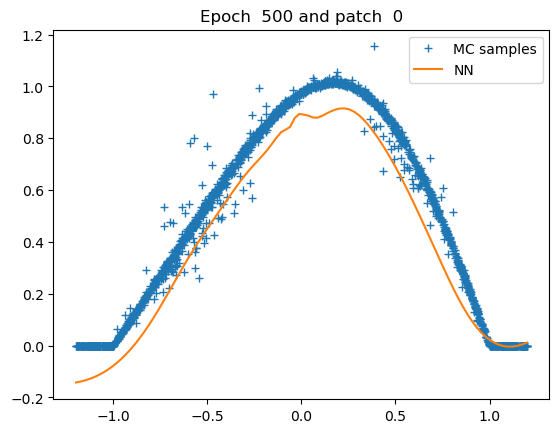

Patch  0: epoch 1000 with loss 9.12E-04


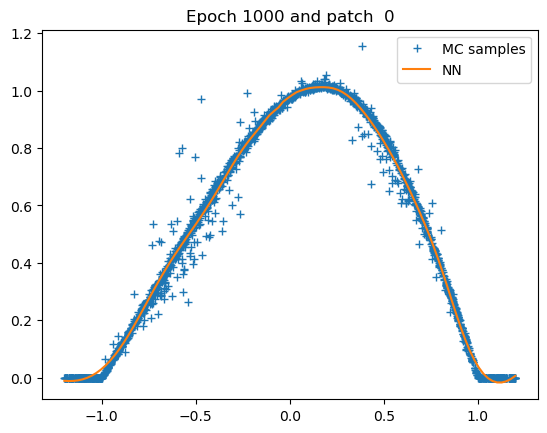

Patch  0: epoch 1500 with loss 9.07E-04


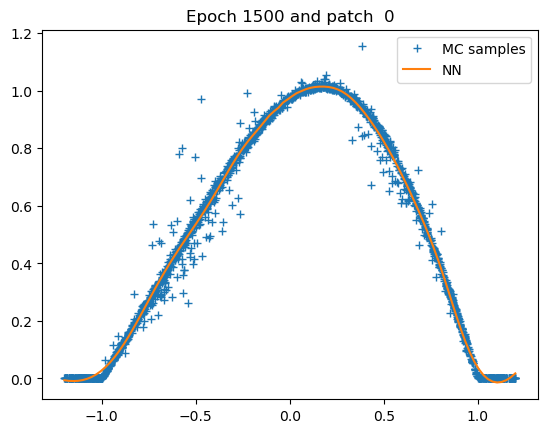

Patch  0: epoch 2000 with loss 9.03E-04


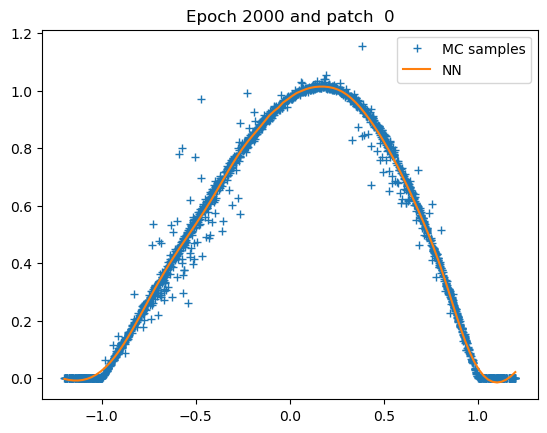

Patch  0: epoch 2500 with loss 9.03E-04


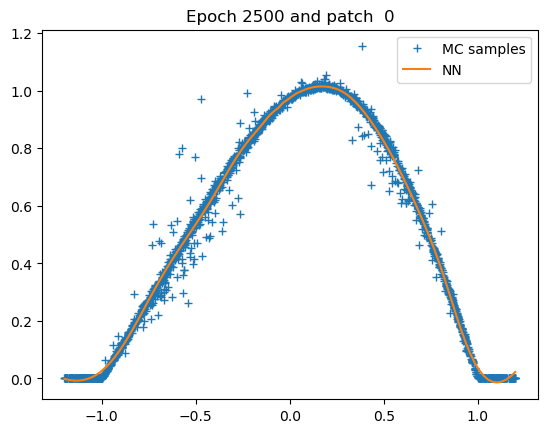

Patch  0: epoch 3000 with loss 9.02E-04


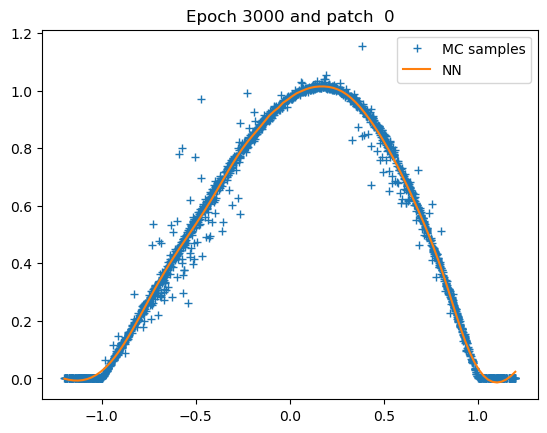

Patch  0: epoch 3500 with loss 9.02E-04


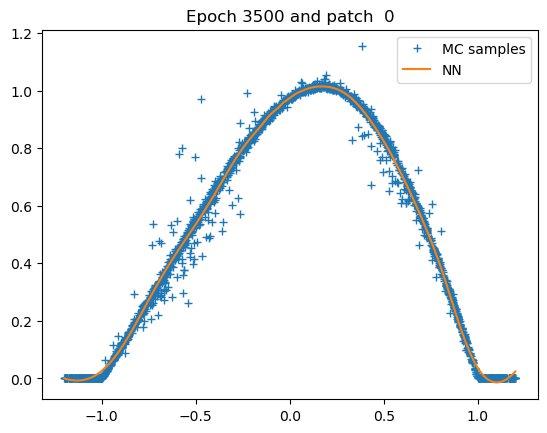

Patch  0: epoch 4000 with loss 9.01E-04


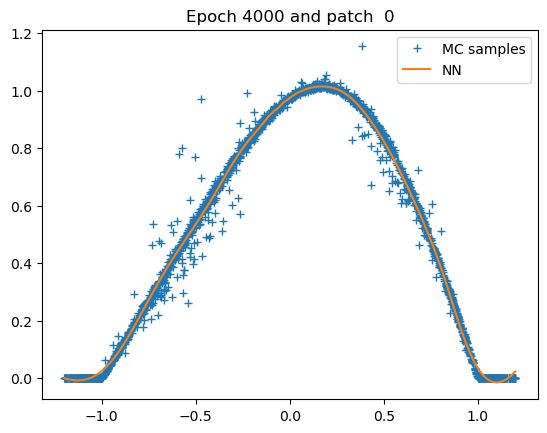

Patch  0: epoch 4500 with loss 9.00E-04


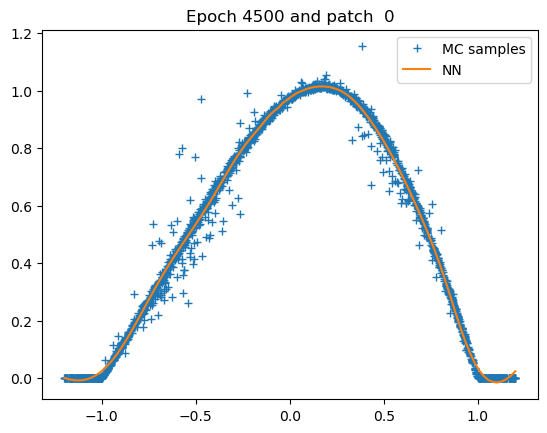

Patch  0: epoch 4999 with loss 8.99E-04


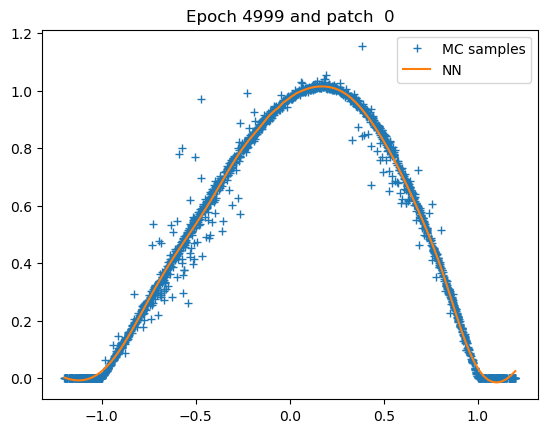

Patch 0: training of u with 5000 epochs take 36.44672107696533 seconds.
/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:74: RuntimeWarning: divide by zero encountered in divide
  branch_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())
Logs are saved in /home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/logs/tmp


Time taken: 741 seconds; L1 error: 2.53E-02; L2 error: 1.05E-03; rel error: INF.
fdb runtime: 2 seconds; total runtime: 743 seconds.
#### Starting deep galerkin method with seed 0 - 1 out of 1 times


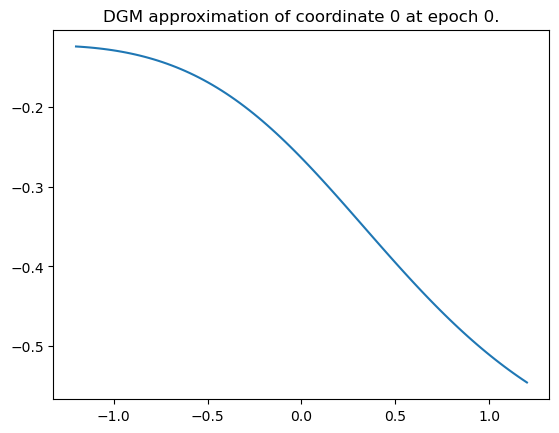

Epoch 0 with loss 1.4951527118682861


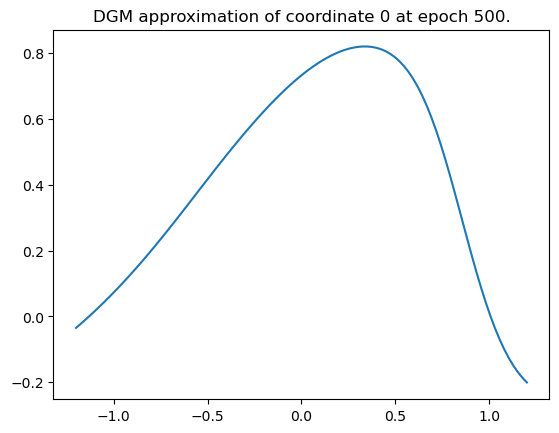

Epoch 500 with loss 0.21750490367412567


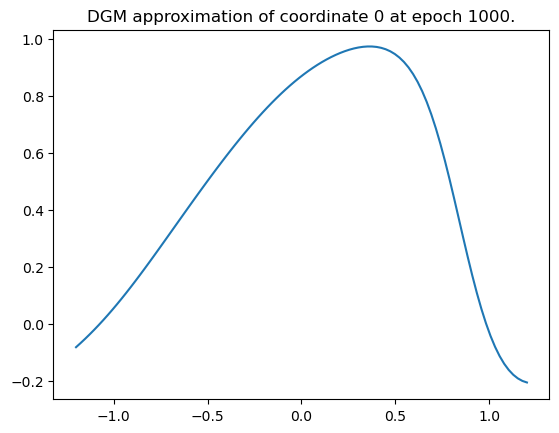

Epoch 1000 with loss 0.1790112406015396


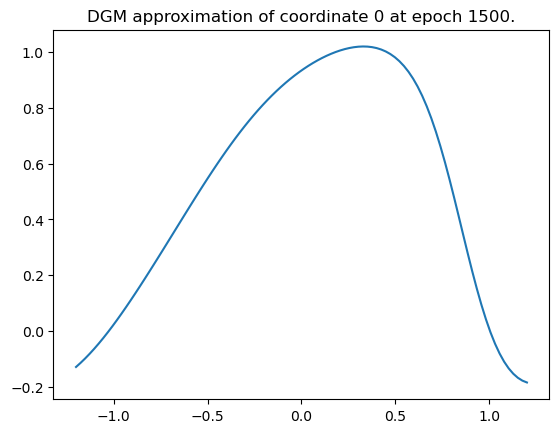

Epoch 1500 with loss 0.1582484245300293


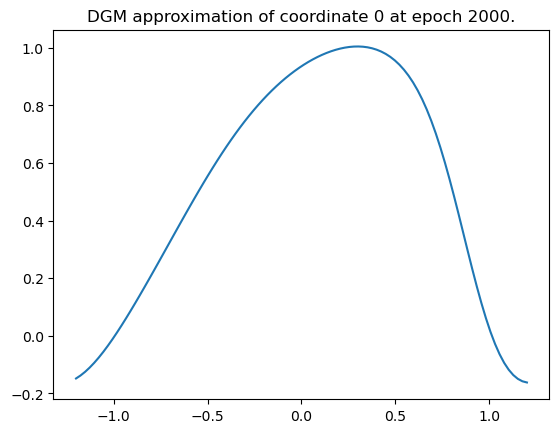

Epoch 2000 with loss 0.13909205794334412


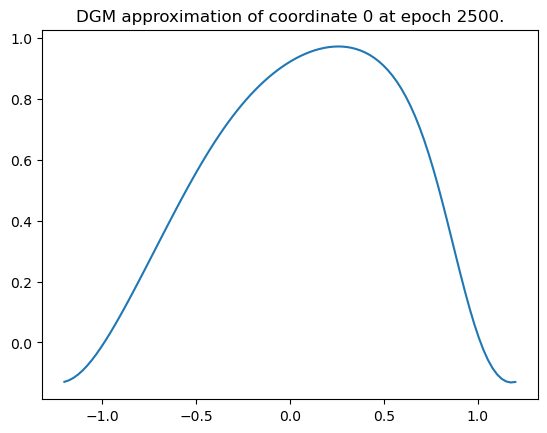

Epoch 2500 with loss 0.1320834755897522


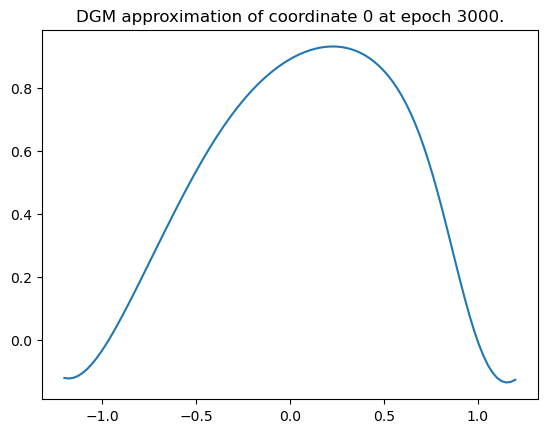

Epoch 3000 with loss 0.13344570994377136


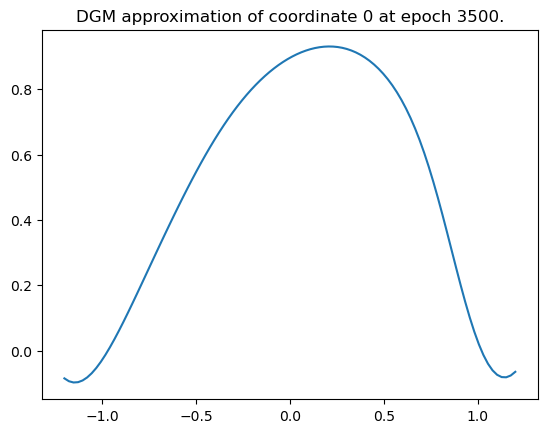

Epoch 3500 with loss 0.10952851176261902


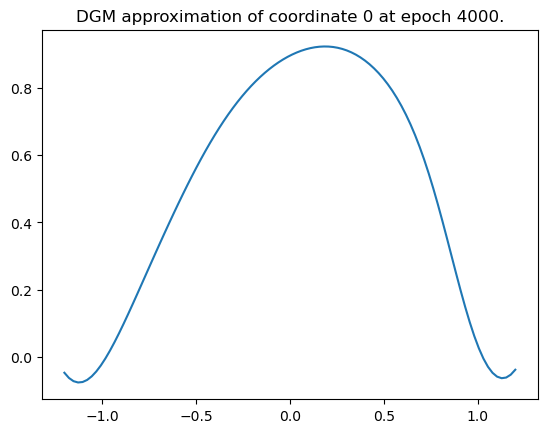

Epoch 4000 with loss 0.10683737695217133


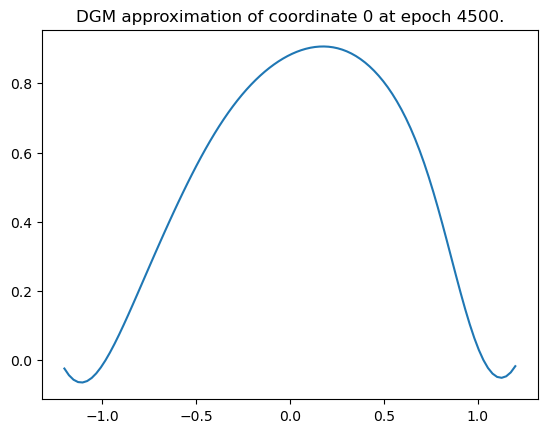

Epoch 4500 with loss 0.10858044028282166


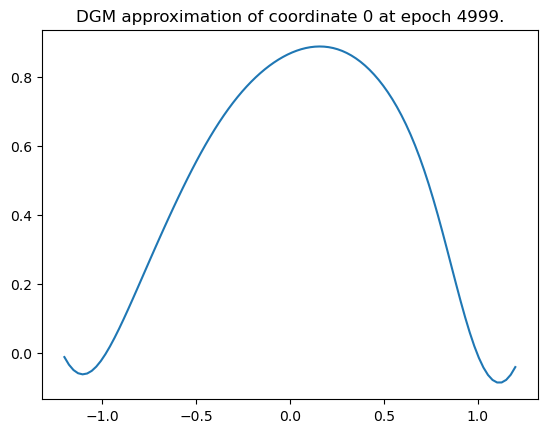

Epoch 4999 with loss 0.09402830898761749
Training of neural network with 5000 epochs take 319.390202999115 seconds.


Time taken: 319 seconds; L1 error: 3.03E-02; L2 error: 1.32E-03; rel error: INF.
#### Starting deep BSDE method with seed 0 - 1 out of 1 times


/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:101: RuntimeWarning: divide by zero encountered in divide
  dgm_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())


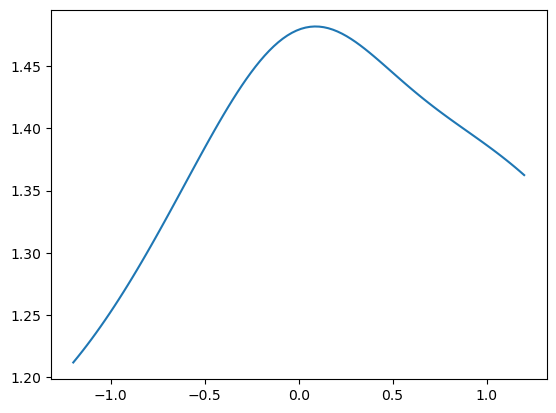

Epoch 0 with loss 1.3048616647720337


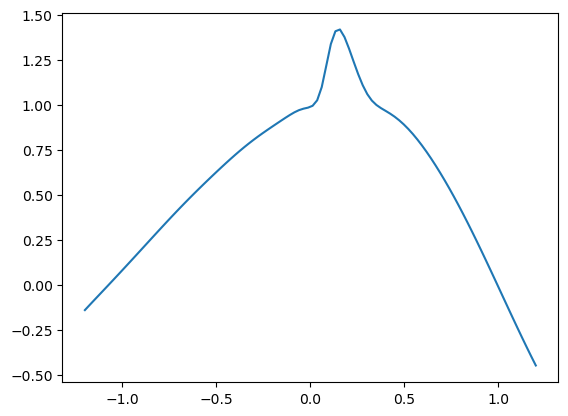

Epoch 500 with loss 0.002486168872565031


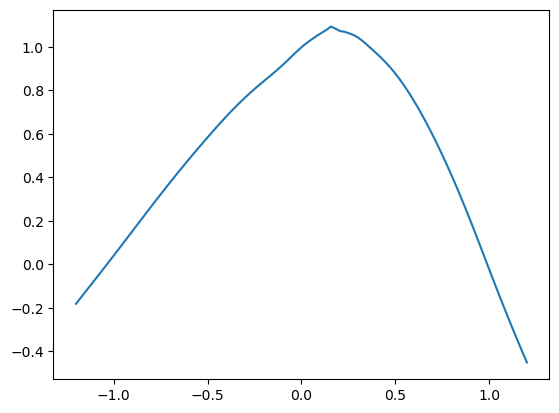

Epoch 1000 with loss 0.0011583216255530715


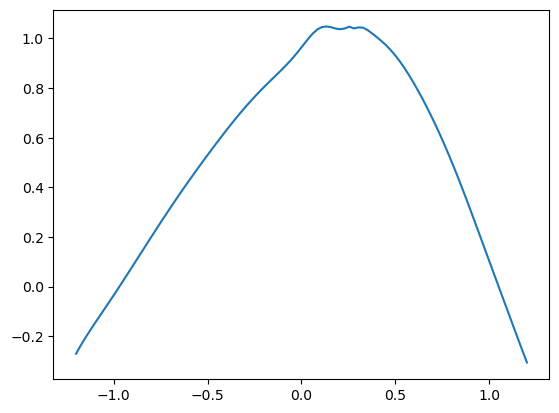

Epoch 1500 with loss 0.004173078574240208


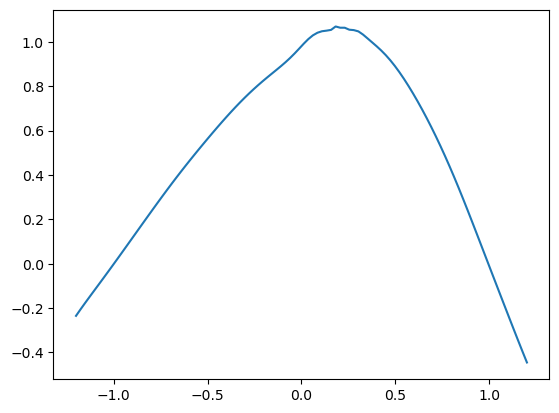

Epoch 2000 with loss 0.000359481229679659


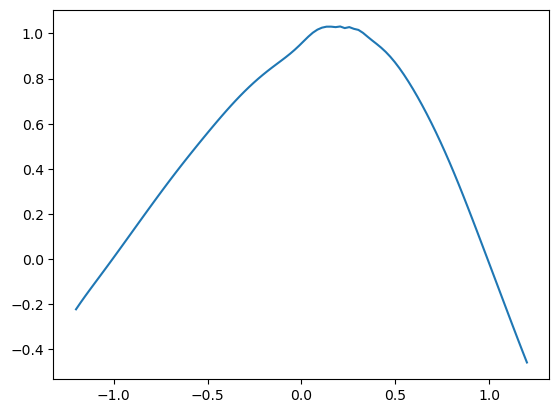

Epoch 2500 with loss 0.0006563265924341977


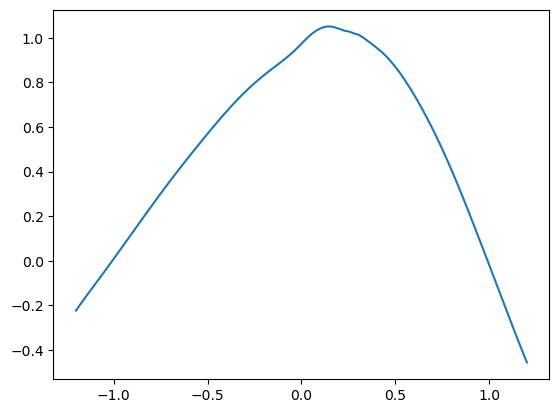

Epoch 3000 with loss 0.00033119585714302957


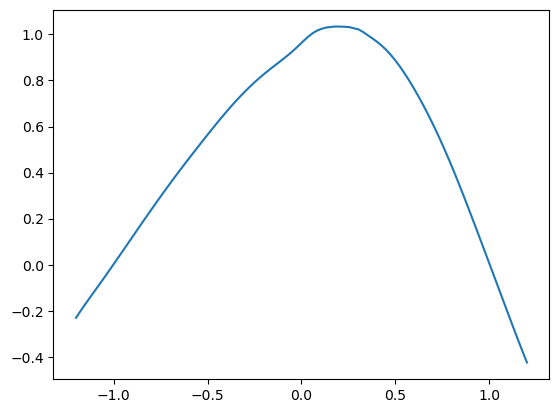

Epoch 3500 with loss 0.0003514990967232734


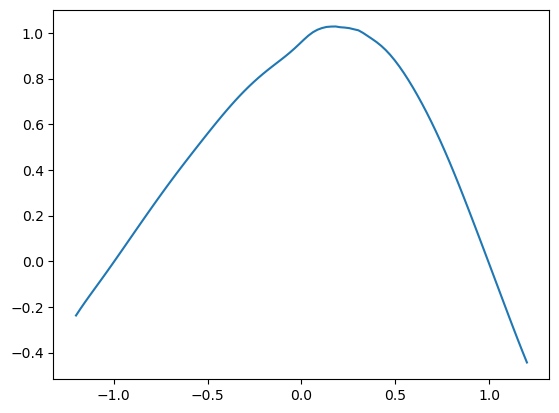

Epoch 4000 with loss 0.00041112987673841417


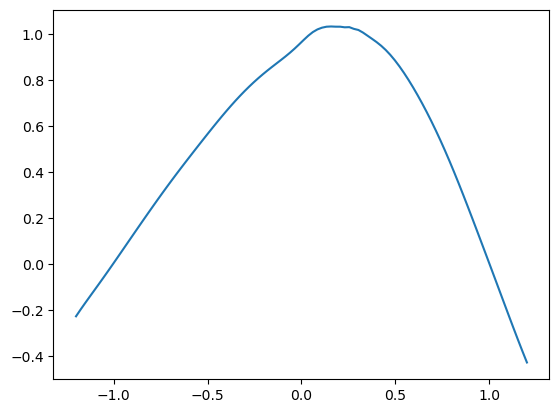

Epoch 4500 with loss 0.0022341746371239424


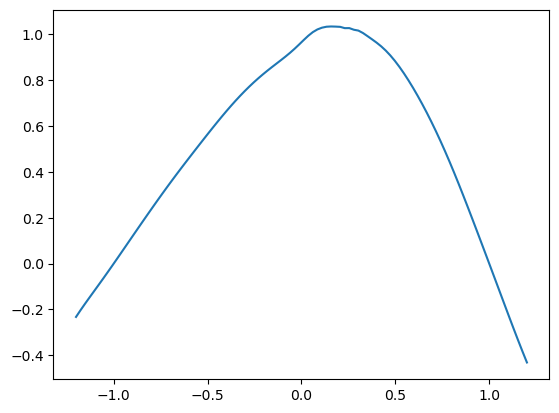

Epoch 4999 with loss 0.0003099135938100517
Training of neural network with 5000 epochs take 227.42318177223206 seconds.
Time taken: 227 seconds; L1 error: 3.40E-02; L2 error: 1.98E-03; rel error: INF.




######## Summary for deep branching method
runtime:        741
fdb runtime:    2
total runtime:  743
mean L1 error:  2.53E-02
std L1 error:   0.00E+00
mean L2 error:  1.05E-03
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


######## Summary for deep galerkin method
runtime:        319
mean L1 error:  3.03E-02
std L1 error:   0.00E+00
mean L2 error:  1.32E-03
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


######## Summary for deep BSDE method
runtime:        227
mean L1 error:  3.40E-02
std L1 error:   0.00E+00
mean L2 error:  1.98E-03
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:129: RuntimeWarning: divide by zero encountered in divide
  bsde_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)


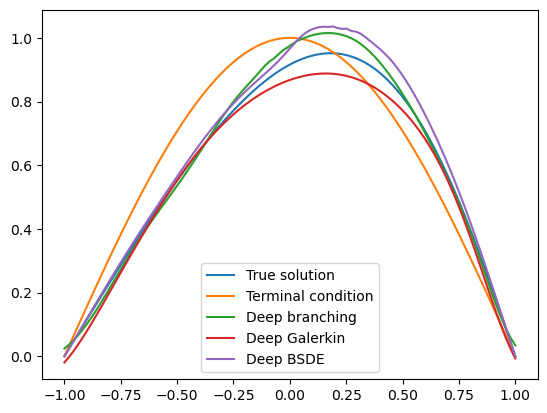

In [8]:
dim = 3
T=0.1/dim
grid_d_dim = np.concatenate((x_mid * np.ones((0, 100)), np.expand_dims(grid, axis=0), x_mid * np.ones((dim - 1, 100))), axis=0)
grid_d_dim_with_t = np.concatenate((t_lo * np.ones((1, 100)), grid_d_dim), axis=0)    
true = exact_example(t_lo, grid_d_dim, T)
terminal = exact_example(T, grid_d_dim, T)
deriv_map = np.concatenate((np.array([[0] * dim]), 1 * np.identity(dim), 2 * np.identity(dim)), axis=0).astype(int)

# Performance comparison
compare_performance(grid, grid_d_dim, grid_d_dim_with_t, t_lo, true, terminal=terminal, seeds=[0],
                    # disable_branch=True,
                    # disable_bsde=True, 
                    # disable_galerkin=True, 
                    verbose=True, debug_mode=True, 
                    conditional_probability_to_survive=partial(conditional_probability_to_survive),
                    is_x_inside=partial(is_x_inside), 
                    y_lo=x_lo, y_hi=x_hi, nu=nu,
                    T=T, device=device, epochs=5000, fname="burgers",
                    branch_nb_states=2000, branch_nb_path_per_state=5000,
                    branch_patches=1, branch_exponential_lambda=-math.log(.95)/T,
                    branch_nb_states_per_batch=1000,
                    second_order=True, bsde_nb_states=1000, bsde_nb_time_intervals=4,
                    dgm_nb_states=10000, f_fun=f_example, dgm_f_fun=dgm_f_example,
                    deriv_map=deriv_map, dgm_deriv_map=deriv_map, phi_fun=phi_example,
                    boundary_fun=boundary_fun, dgm_overtrain_rate=0, outlier_percentile=5,
                    lr_gamma=0.1, branch_lr=1e-2, branch_activation="tanh", neurons=20, layers=8,
                    save_for_best_model=False, save_as_tmp=True)

## dim = 4

#### Starting deep branching method with seed 0 - 1 out of 1 times


Logs are saved in /home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/logs/tmp
Patch 0: generation of u samples take 1459.2459778785706 seconds.
Patch  0: epoch    0 with loss 4.46E-01


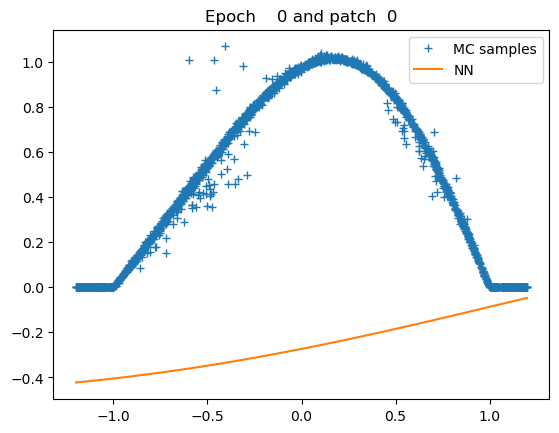

Patch  0: epoch  500 with loss 2.06E-03


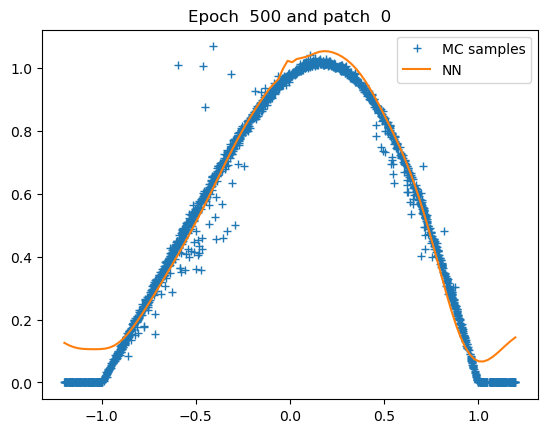

Patch  0: epoch 1000 with loss 9.32E-04


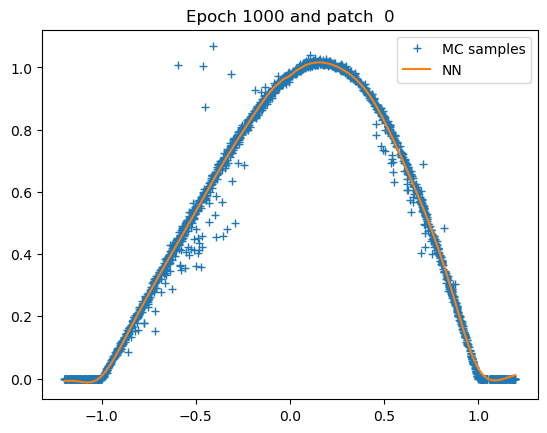

Patch  0: epoch 1500 with loss 9.29E-04


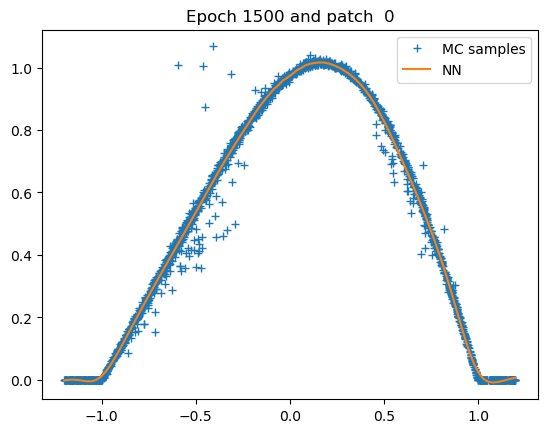

Patch  0: epoch 2000 with loss 9.27E-04


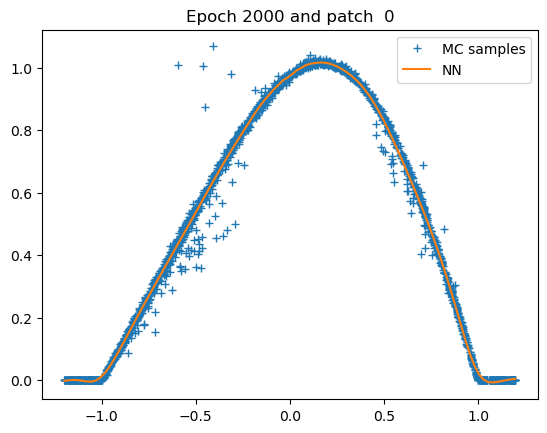

Patch  0: epoch 2500 with loss 9.27E-04


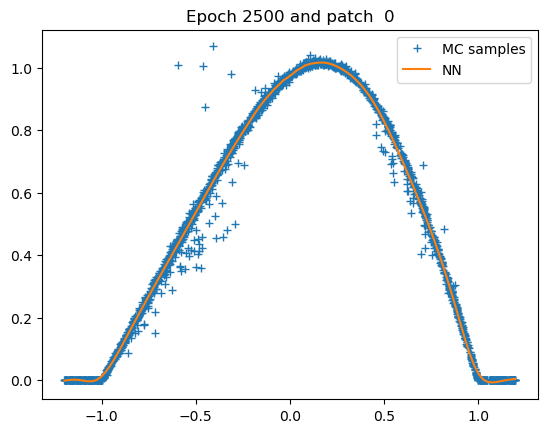

Patch  0: epoch 3000 with loss 9.26E-04


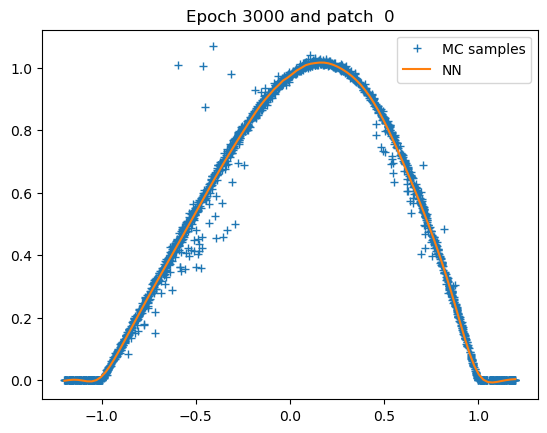

Patch  0: epoch 3500 with loss 9.26E-04


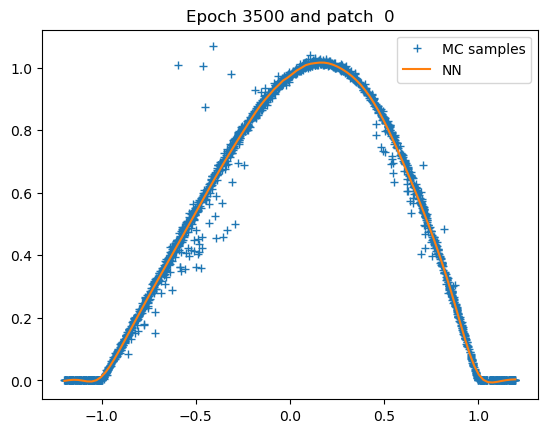

Patch  0: epoch 4000 with loss 9.26E-04


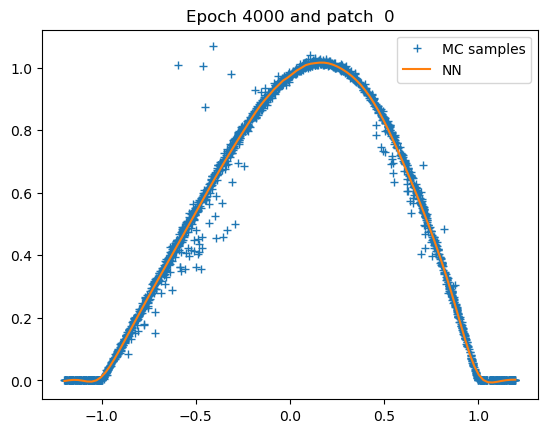

Patch  0: epoch 4500 with loss 9.25E-04


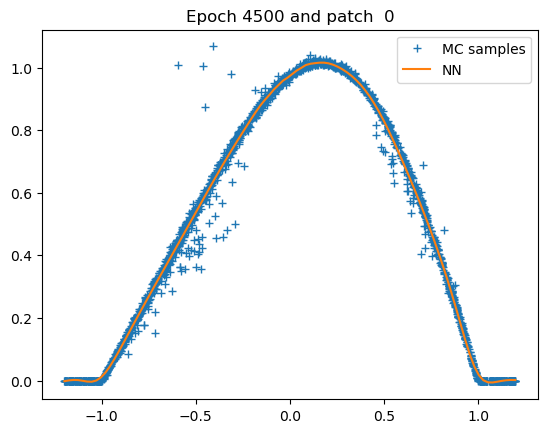

Patch  0: epoch 4999 with loss 9.24E-04


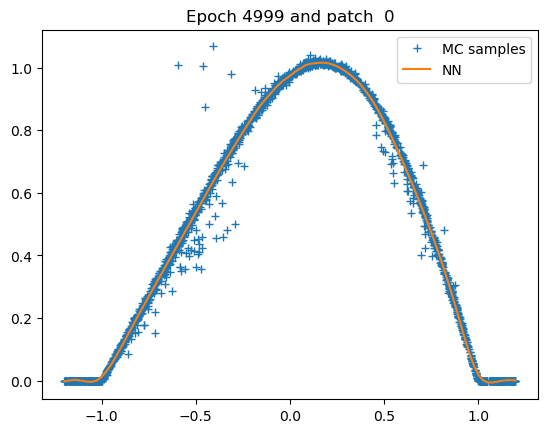

Patch 0: training of u with 5000 epochs take 40.46906638145447 seconds.
/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:74: RuntimeWarning: divide by zero encountered in divide
  branch_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())
Logs are saved in /home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/logs/tmp


Time taken: 1491 seconds; L1 error: 2.57E-02; L2 error: 1.08E-03; rel error: INF.
fdb runtime: 9 seconds; total runtime: 1500 seconds.
#### Starting deep galerkin method with seed 0 - 1 out of 1 times


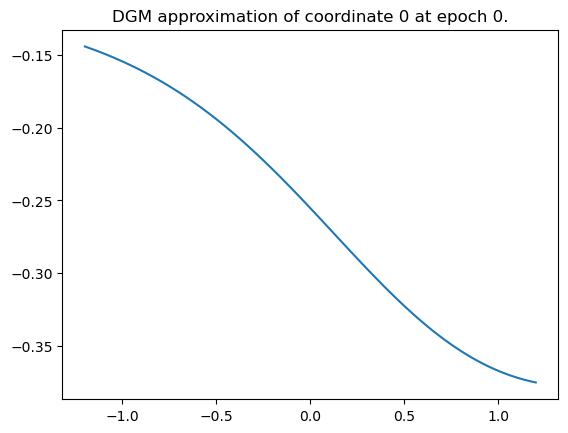

Epoch 0 with loss 1.0387263298034668


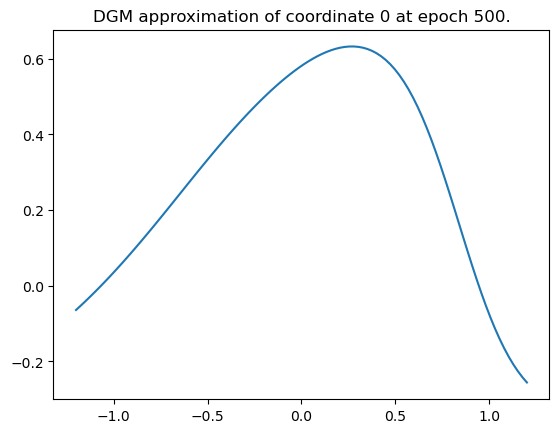

Epoch 500 with loss 0.2473149597644806


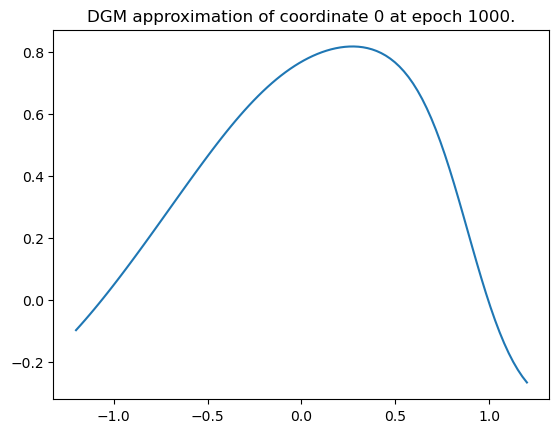

Epoch 1000 with loss 0.21846644580364227


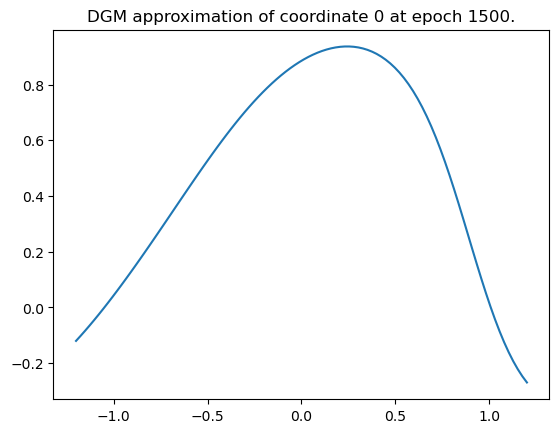

Epoch 1500 with loss 0.200236976146698


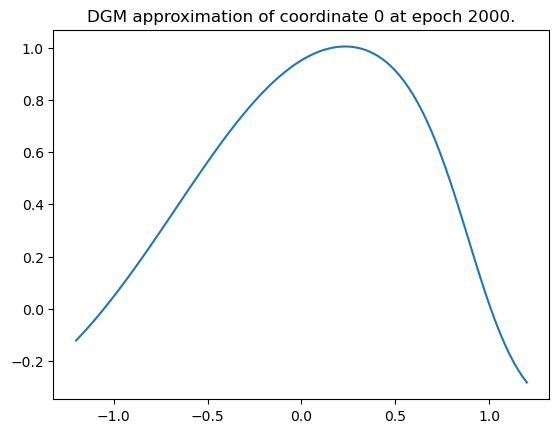

Epoch 2000 with loss 0.19331276416778564


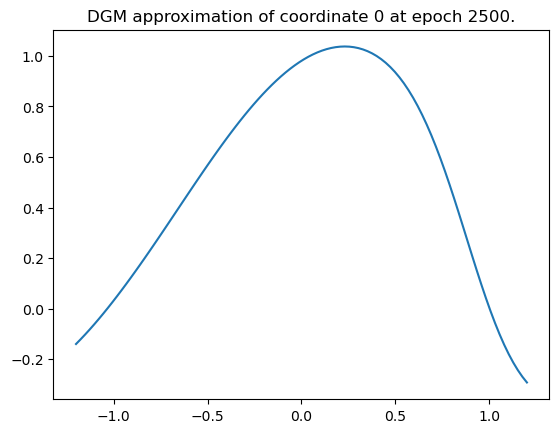

Epoch 2500 with loss 0.18110933899879456


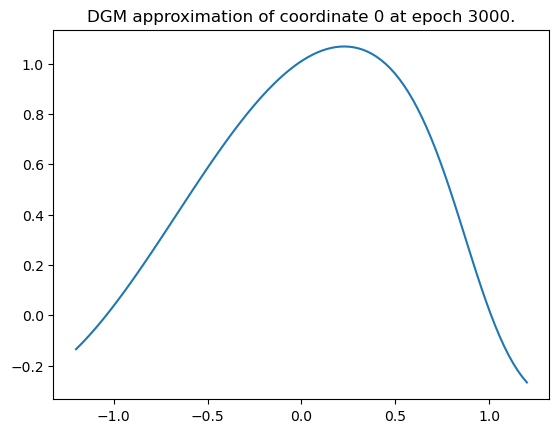

Epoch 3000 with loss 0.1793861985206604


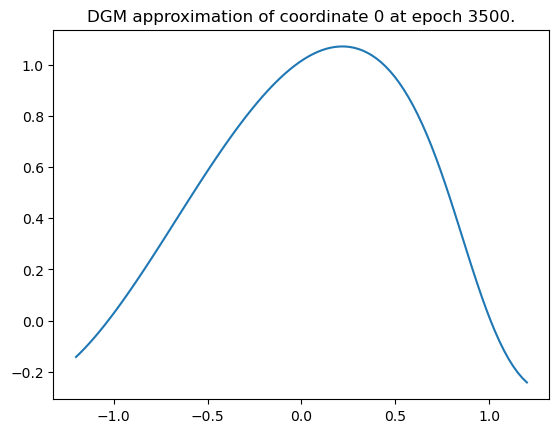

Epoch 3500 with loss 0.17105698585510254


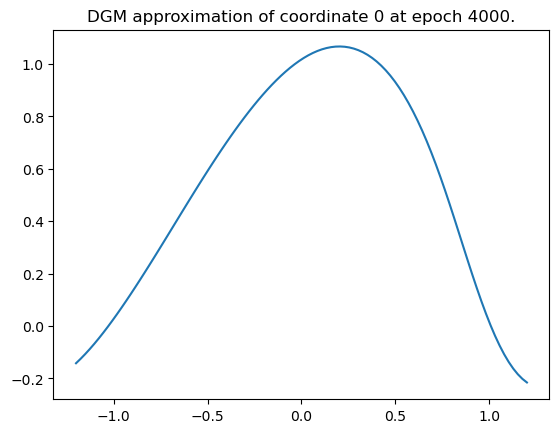

Epoch 4000 with loss 0.16800107061862946


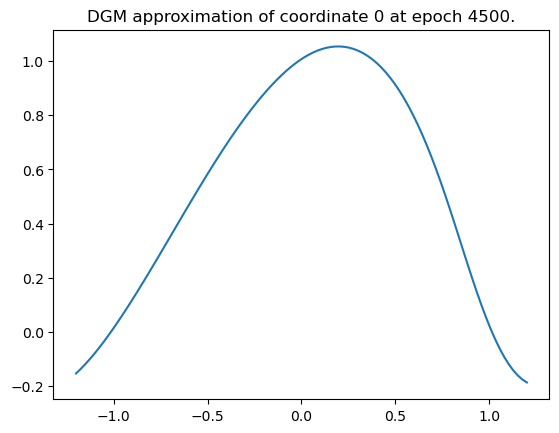

Epoch 4500 with loss 0.16764265298843384


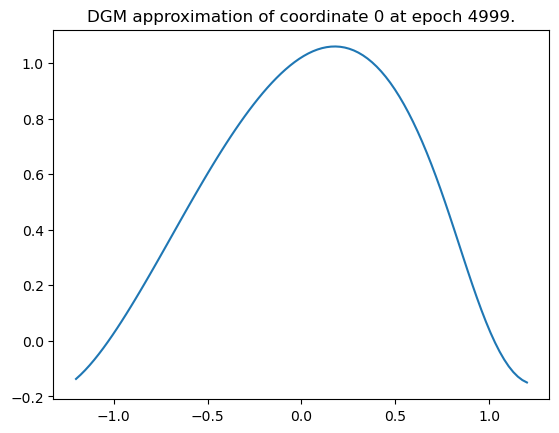

Epoch 4999 with loss 0.1659209132194519
Training of neural network with 5000 epochs take 387.7669894695282 seconds.


Time taken: 388 seconds; L1 error: 6.38E-02; L2 error: 5.21E-03; rel error: INF.
#### Starting deep BSDE method with seed 0 - 1 out of 1 times


/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:101: RuntimeWarning: divide by zero encountered in divide
  dgm_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())


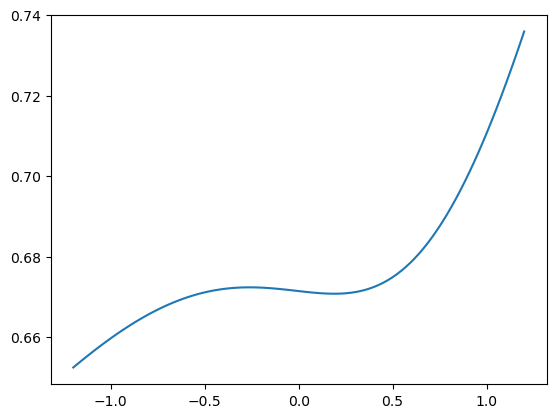

Epoch 0 with loss 1.4857532978057861


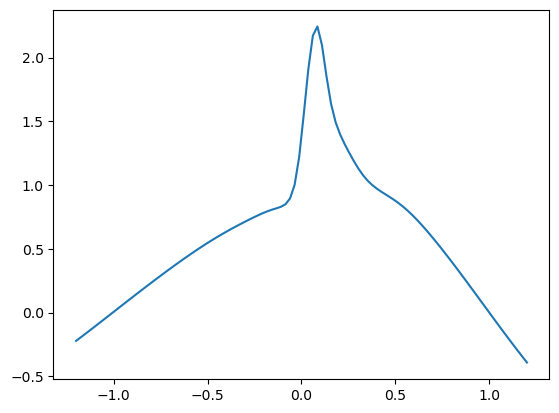

Epoch 500 with loss 0.0010032225400209427


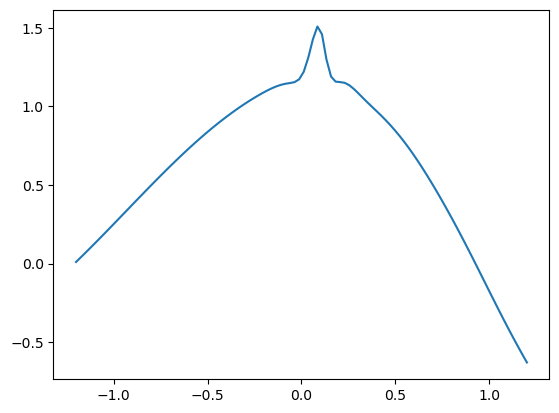

Epoch 1000 with loss 0.011398283764719963


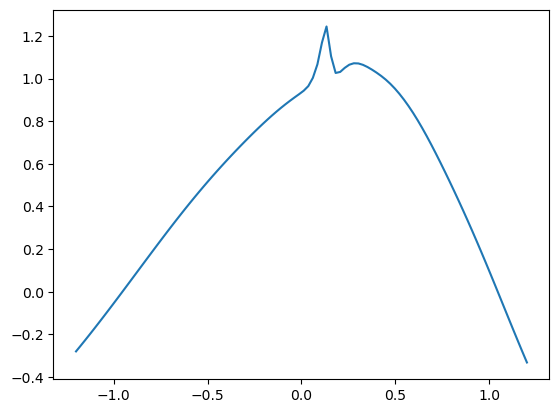

Epoch 1500 with loss 0.0007045965758152306


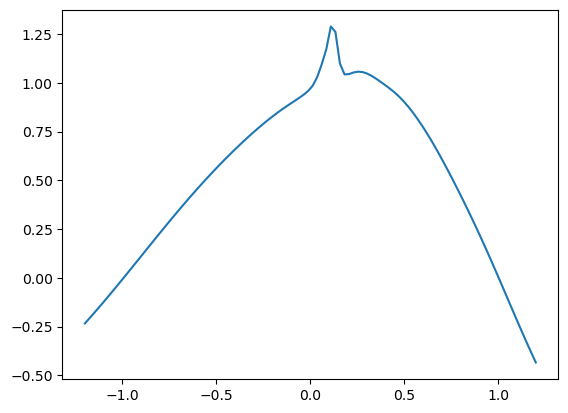

Epoch 2000 with loss 0.0008177090203389525


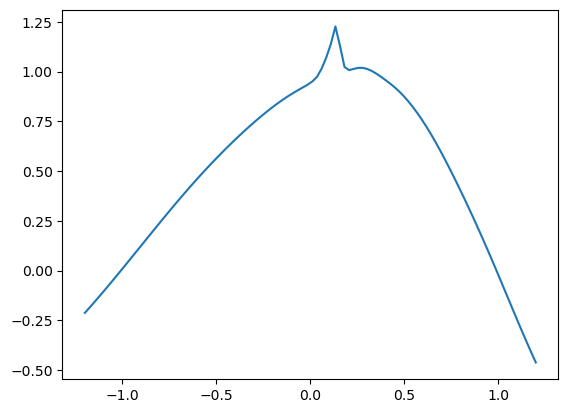

Epoch 2500 with loss 0.0012819486437365413


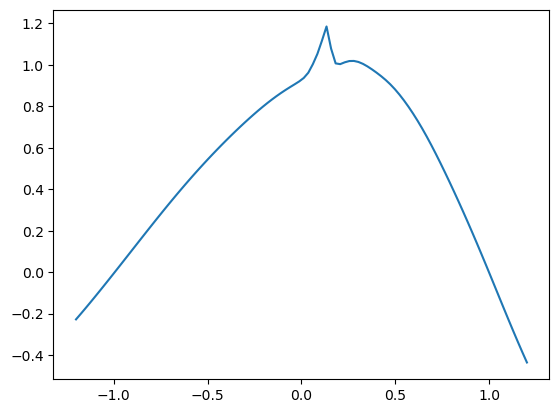

Epoch 3000 with loss 0.0002812238526530564


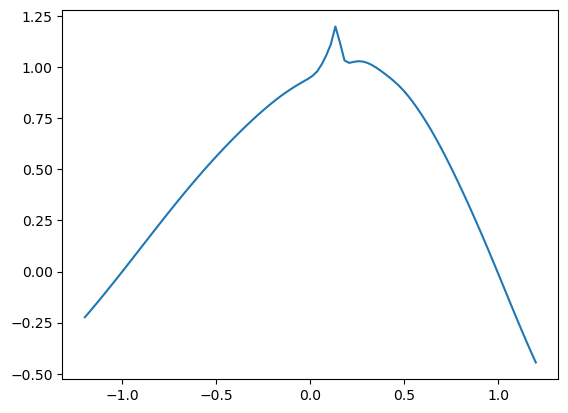

Epoch 3500 with loss 0.0005480009131133556


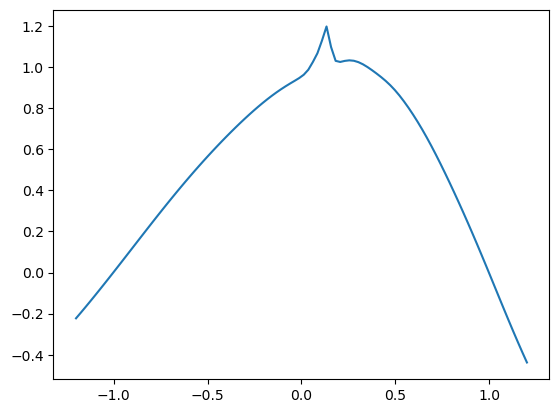

Epoch 4000 with loss 0.0016121934168040752


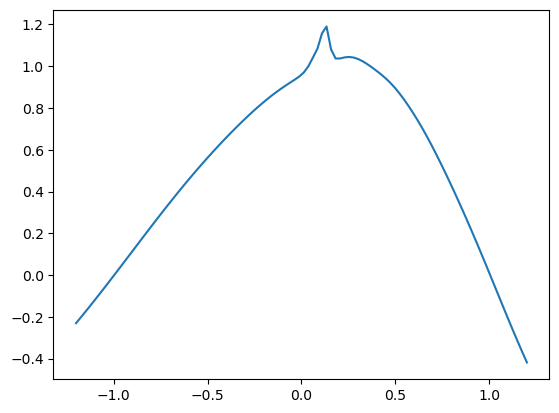

Epoch 4500 with loss 0.0010836274595931172


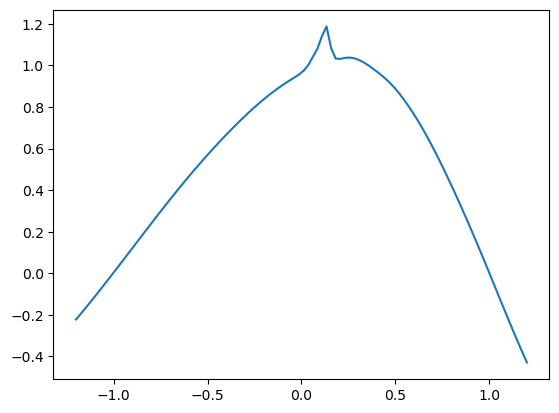

Epoch 4999 with loss 0.000425843900302425
Training of neural network with 5000 epochs take 214.8740849494934 seconds.
Time taken: 215 seconds; L1 error: 4.30E-02; L2 error: 3.65E-03; rel error: INF.




######## Summary for deep branching method
runtime:        1491
fdb runtime:    9
total runtime:  1500
mean L1 error:  2.57E-02
std L1 error:   0.00E+00
mean L2 error:  1.08E-03
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


######## Summary for deep galerkin method
runtime:        388
mean L1 error:  6.38E-02
std L1 error:   0.00E+00
mean L2 error:  5.21E-03
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


######## Summary for deep BSDE method
runtime:        215
mean L1 error:  4.30E-02
std L1 error:   0.00E+00
mean L2 error:  3.65E-03
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:129: RuntimeWarning: divide by zero encountered in divide
  bsde_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)


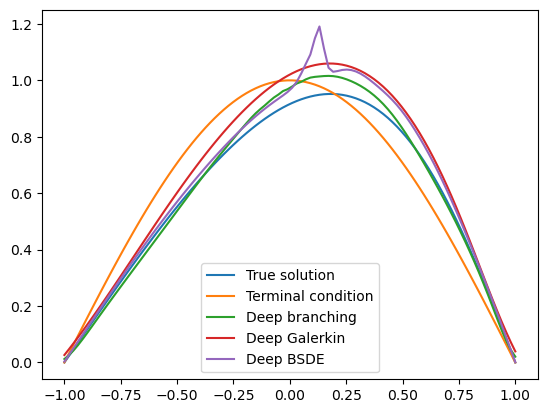

In [9]:
dim = 4
T=0.1/dim
grid_d_dim = np.concatenate((x_mid * np.ones((0, 100)), np.expand_dims(grid, axis=0), x_mid * np.ones((dim - 1, 100))), axis=0)
grid_d_dim_with_t = np.concatenate((t_lo * np.ones((1, 100)), grid_d_dim), axis=0)    
true = exact_example(t_lo, grid_d_dim, T)
terminal = exact_example(T, grid_d_dim, T)
deriv_map = np.concatenate((np.array([[0] * dim]), 1 * np.identity(dim), 2 * np.identity(dim)), axis=0).astype(int)

# Performance comparison
compare_performance(grid, grid_d_dim, grid_d_dim_with_t, t_lo, true, terminal=terminal, seeds=[0],
                    # disable_branch=True,
                    # disable_bsde=True, 
                    # disable_galerkin=True, 
                    verbose=True, debug_mode=True, 
                    conditional_probability_to_survive=partial(conditional_probability_to_survive),
                    is_x_inside=partial(is_x_inside), 
                    y_lo=x_lo, y_hi=x_hi, nu=nu,
                    T=T, device=device, epochs=5000, fname="burgers",
                    branch_nb_states=2000, branch_nb_path_per_state=5000,
                    branch_patches=1, branch_exponential_lambda=-math.log(.95)/T,
                    branch_nb_states_per_batch=1000,
                    second_order=True, bsde_nb_states=1000, bsde_nb_time_intervals=4,
                    dgm_nb_states=10000, f_fun=f_example, dgm_f_fun=dgm_f_example,
                    deriv_map=deriv_map, dgm_deriv_map=deriv_map, phi_fun=phi_example,
                    boundary_fun=boundary_fun, dgm_overtrain_rate=0, outlier_percentile=5,
                    lr_gamma=0.1, branch_lr=1e-2, branch_activation="tanh", neurons=20, layers=8,
                    save_for_best_model=False, save_as_tmp=True)

## dim = 5

#### Starting deep branching method with seed 0 - 1 out of 1 times


Logs are saved in /home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/logs/tmp
Patch 0: generation of u samples take 2613.734299182892 seconds.
Patch  0: epoch    0 with loss 2.44E+00


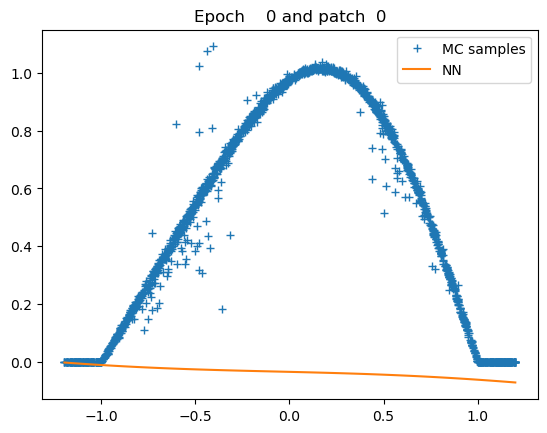

Patch  0: epoch  500 with loss 1.19E-03


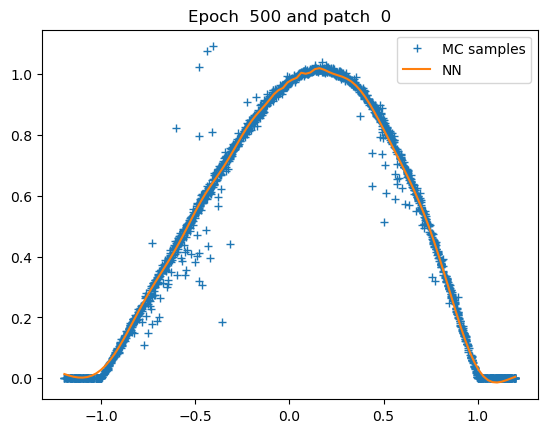

Patch  0: epoch 1000 with loss 1.18E-03


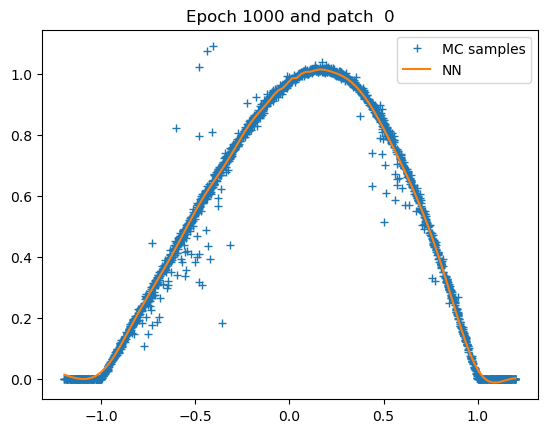

Patch  0: epoch 1500 with loss 1.18E-03


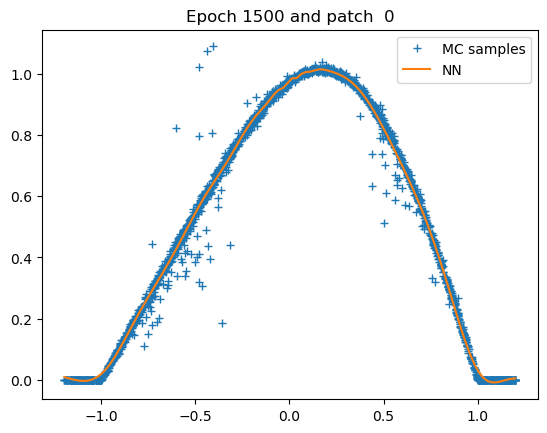

Patch  0: epoch 2000 with loss 1.18E-03


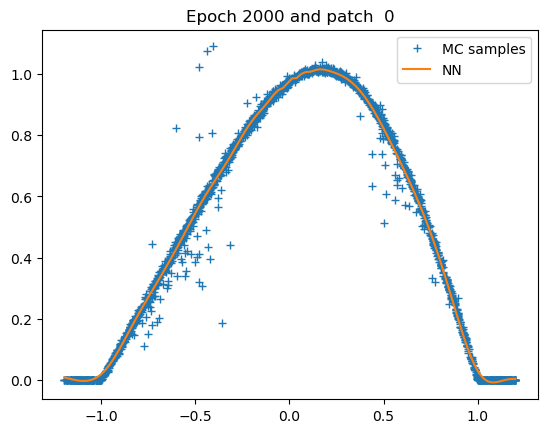

Patch  0: epoch 2500 with loss 1.18E-03


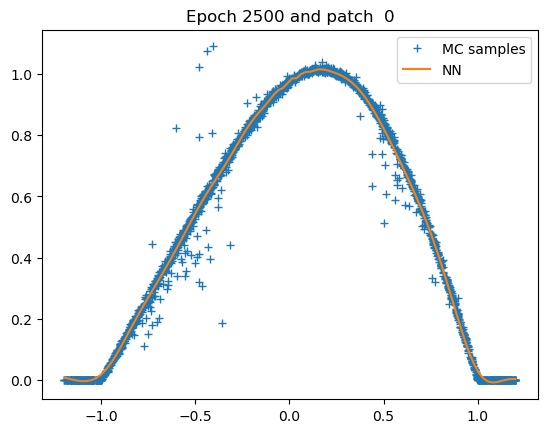

Patch  0: epoch 3000 with loss 1.18E-03


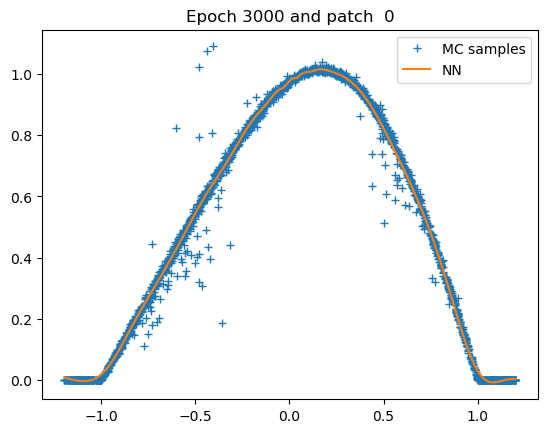

Patch  0: epoch 3500 with loss 1.18E-03


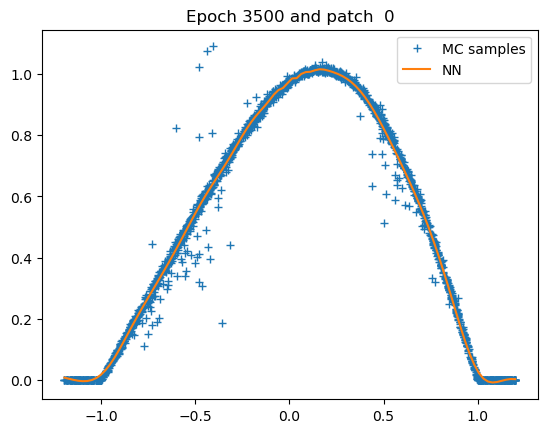

Patch  0: epoch 4000 with loss 1.18E-03


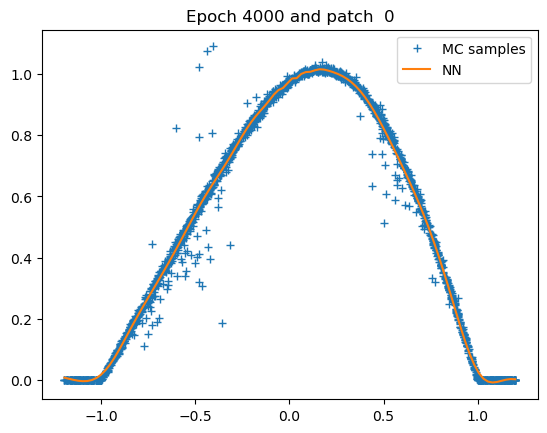

Patch  0: epoch 4500 with loss 1.18E-03


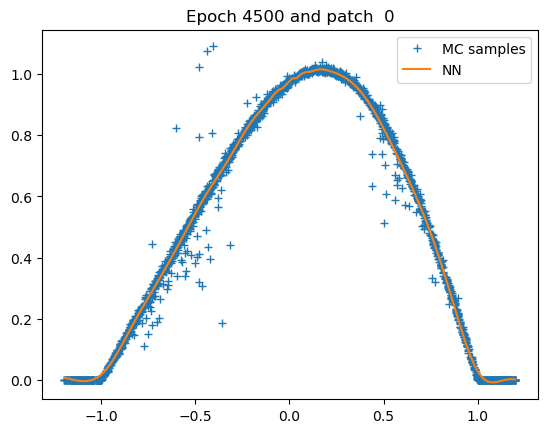

Patch  0: epoch 4999 with loss 1.18E-03


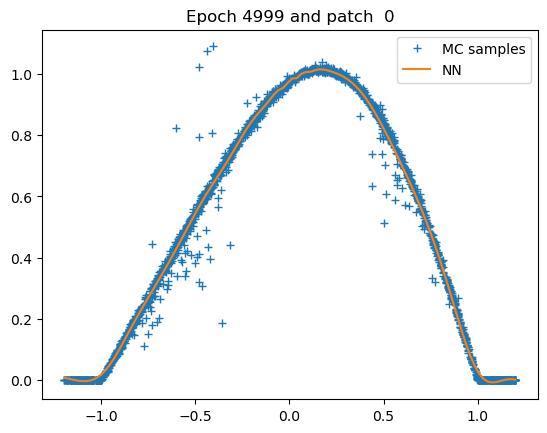

Patch 0: training of u with 5000 epochs take 39.17910695075989 seconds.
/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:74: RuntimeWarning: divide by zero encountered in divide
  branch_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())
Logs are saved in /home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/logs/tmp


Time taken: 2627 seconds; L1 error: 2.52E-02; L2 error: 1.06E-03; rel error: INF.
fdb runtime: 26 seconds; total runtime: 2653 seconds.
#### Starting deep galerkin method with seed 0 - 1 out of 1 times


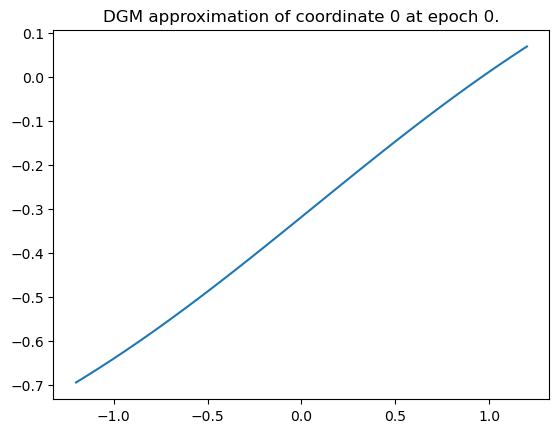

Epoch 0 with loss 1.9760178327560425


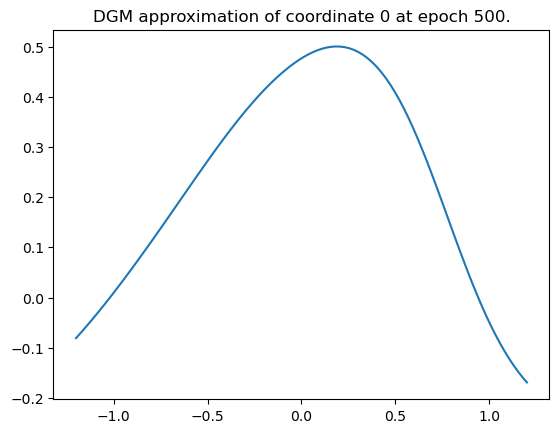

Epoch 500 with loss 0.2740651071071625


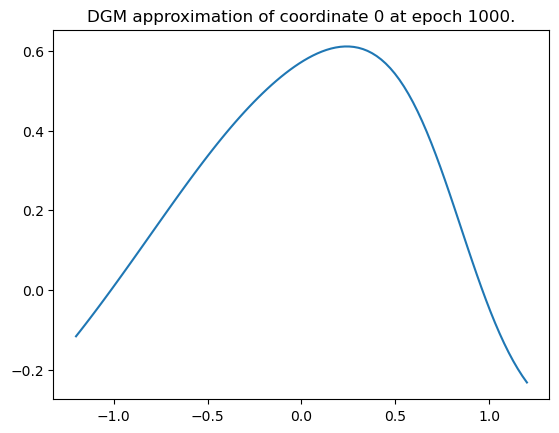

Epoch 1000 with loss 0.24509529769420624


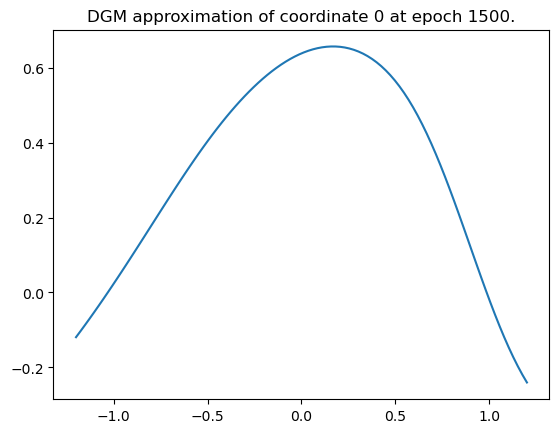

Epoch 1500 with loss 0.23835903406143188


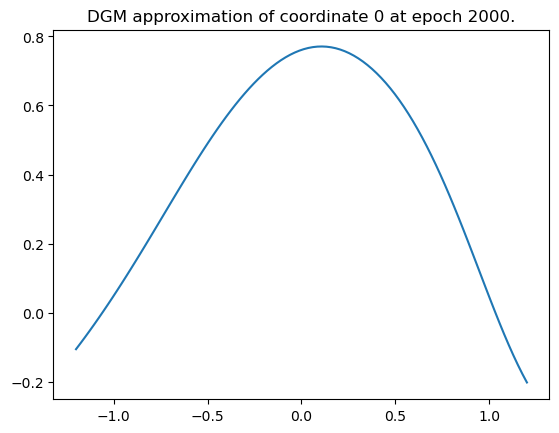

Epoch 2000 with loss 0.22776806354522705


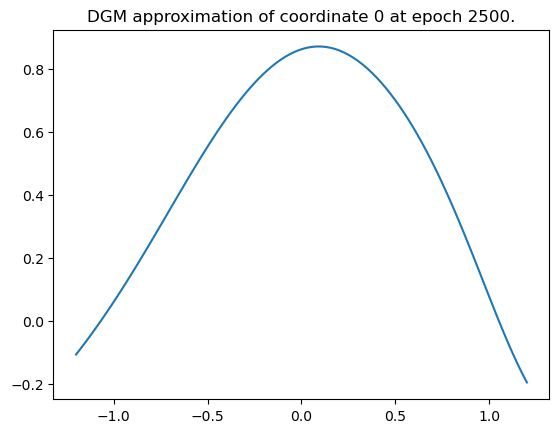

Epoch 2500 with loss 0.22202837467193604


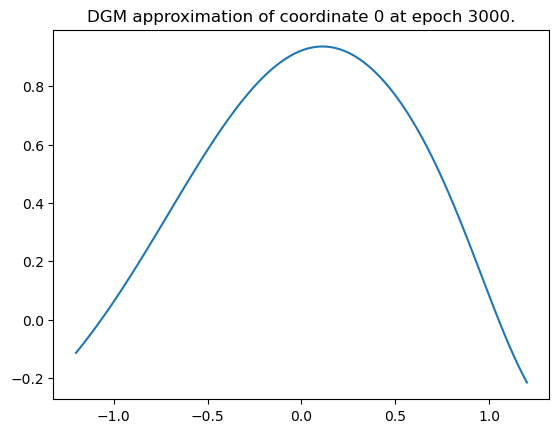

Epoch 3000 with loss 0.21332859992980957


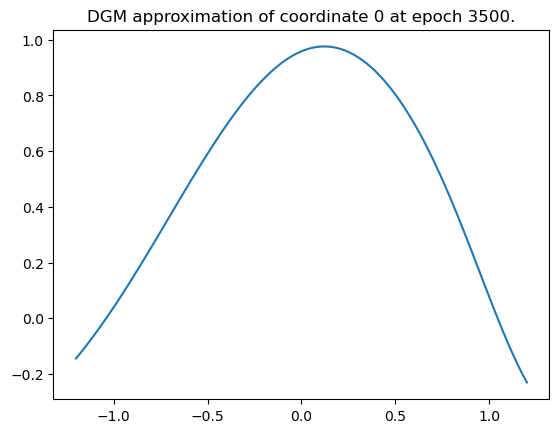

Epoch 3500 with loss 0.2099846601486206


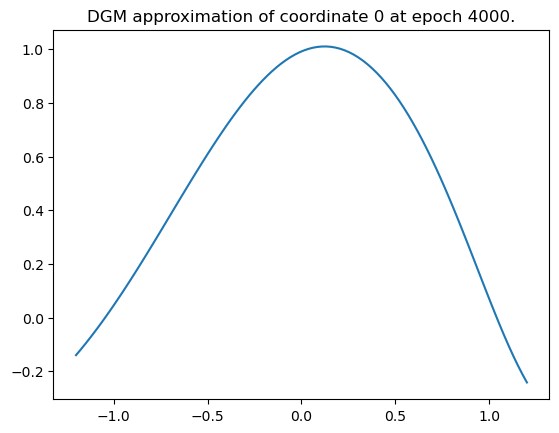

Epoch 4000 with loss 0.20594236254692078


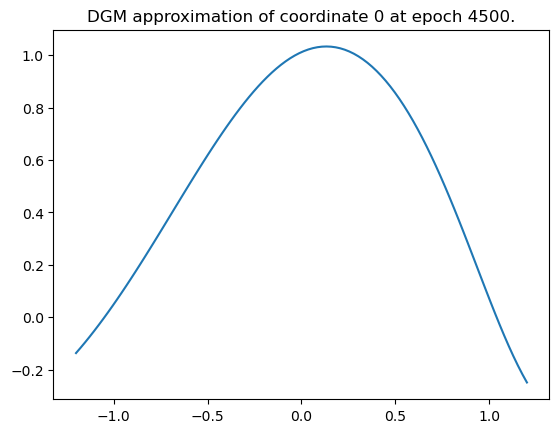

Epoch 4500 with loss 0.20388135313987732


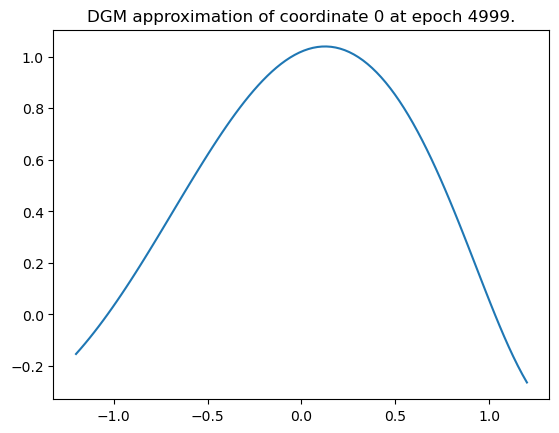

Epoch 4999 with loss 0.20286160707473755
Training of neural network with 5000 epochs take 479.91887640953064 seconds.


Time taken: 480 seconds; L1 error: 5.90E-02; L2 error: 4.37E-03; rel error: INF.
#### Starting deep BSDE method with seed 0 - 1 out of 1 times


/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:101: RuntimeWarning: divide by zero encountered in divide
  dgm_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())


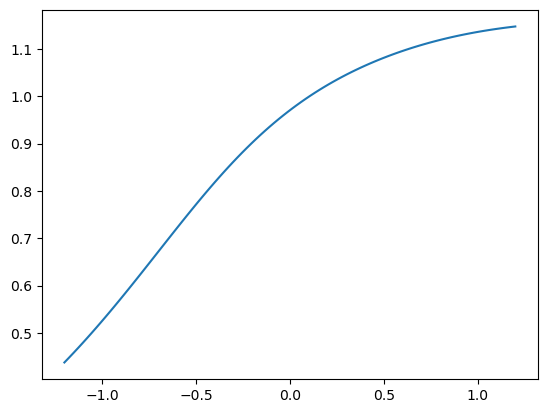

Epoch 0 with loss 1.3198376893997192


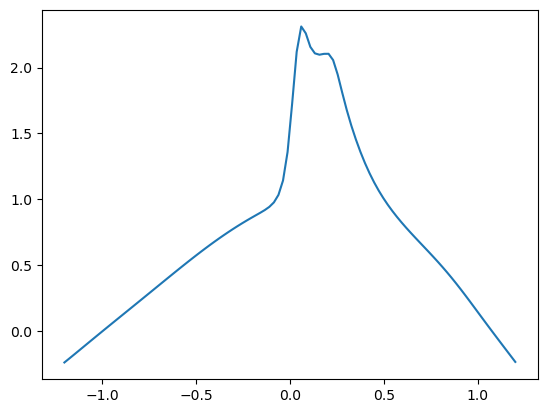

Epoch 500 with loss 0.006814839784055948


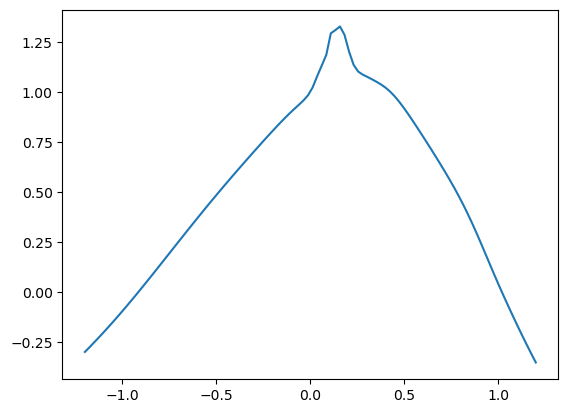

Epoch 1000 with loss 0.000854988640639931


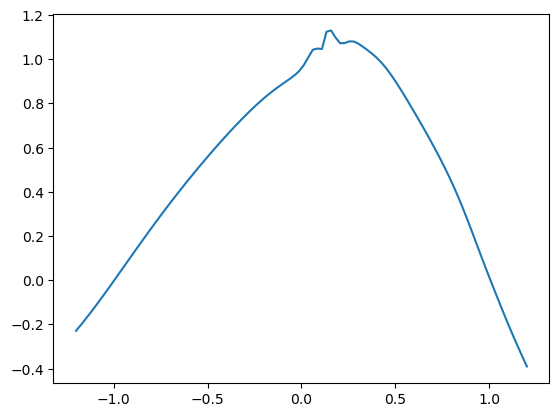

Epoch 1500 with loss 0.003288859501481056


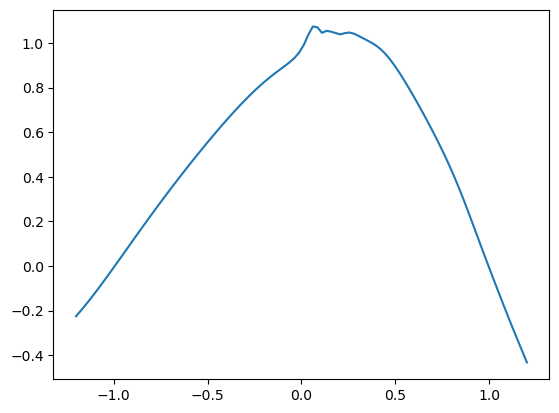

Epoch 2000 with loss 0.0003735606442205608


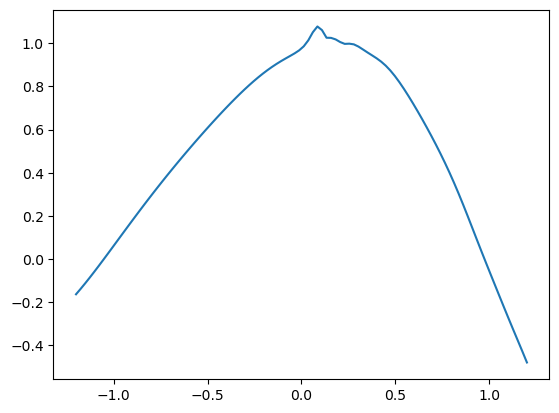

Epoch 2500 with loss 0.001129786716774106


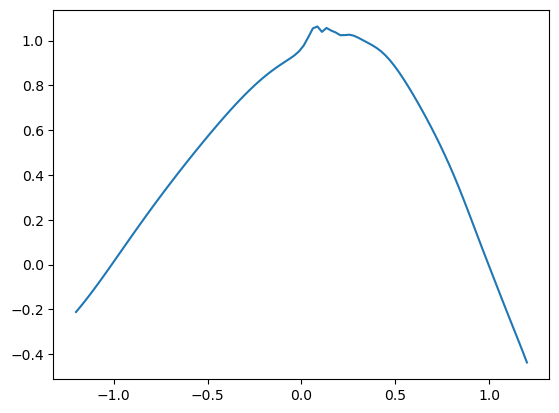

Epoch 3000 with loss 0.0006632130825892091


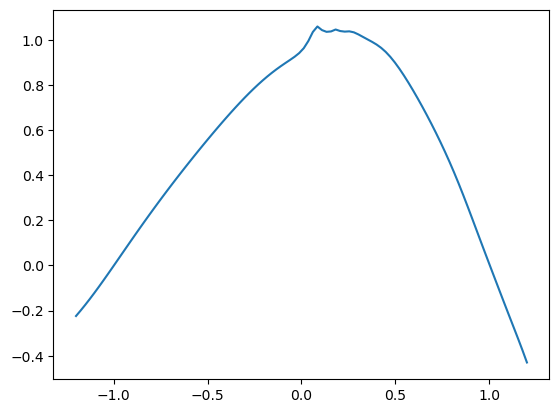

Epoch 3500 with loss 0.00041039963252842426


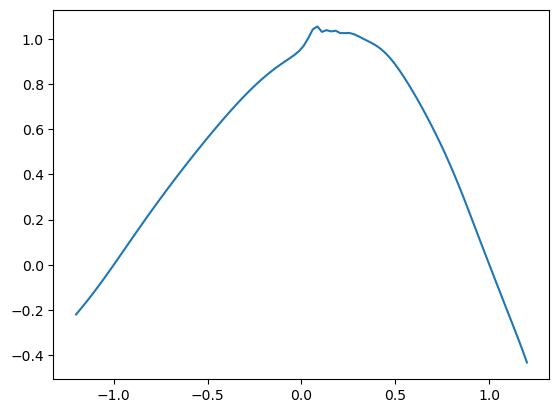

Epoch 4000 with loss 0.0007614028872922063


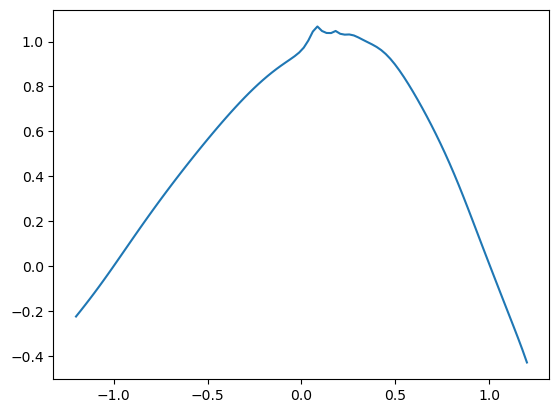

Epoch 4500 with loss 0.00035789734101854265


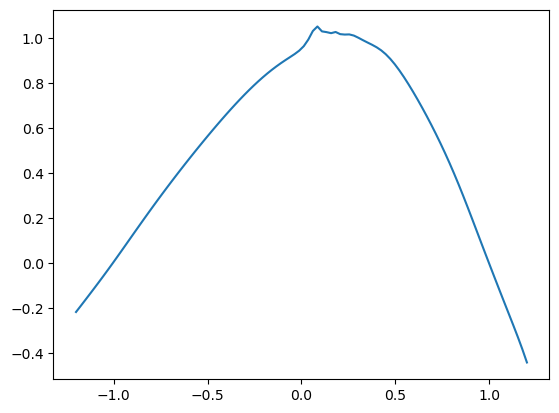

Epoch 4999 with loss 0.000608279078733176
Training of neural network with 5000 epochs take 222.3879680633545 seconds.
Time taken: 222 seconds; L1 error: 3.32E-02; L2 error: 1.82E-03; rel error: INF.




######## Summary for deep branching method
runtime:        2627
fdb runtime:    26
total runtime:  2653
mean L1 error:  2.52E-02
std L1 error:   0.00E+00
mean L2 error:  1.06E-03
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


######## Summary for deep galerkin method
runtime:        480
mean L1 error:  5.90E-02
std L1 error:   0.00E+00
mean L2 error:  4.37E-03
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


######## Summary for deep BSDE method
runtime:        222
mean L1 error:  3.32E-02
std L1 error:   0.00E+00
mean L2 error:  1.82E-03
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:129: RuntimeWarning: divide by zero encountered in divide
  bsde_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)


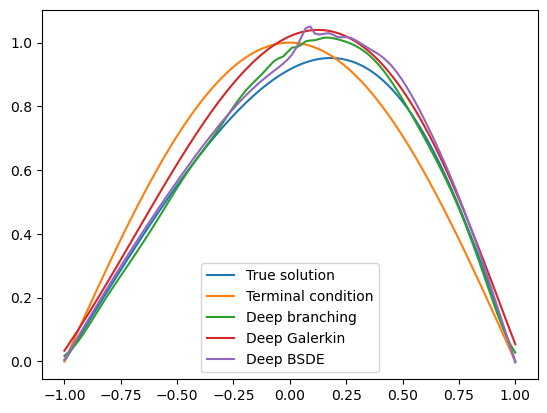

In [10]:
dim = 5
T=0.1/dim
grid_d_dim = np.concatenate((x_mid * np.ones((0, 100)), np.expand_dims(grid, axis=0), x_mid * np.ones((dim - 1, 100))), axis=0)
grid_d_dim_with_t = np.concatenate((t_lo * np.ones((1, 100)), grid_d_dim), axis=0)    
true = exact_example(t_lo, grid_d_dim, T)
terminal = exact_example(T, grid_d_dim, T)
deriv_map = np.concatenate((np.array([[0] * dim]), 1 * np.identity(dim), 2 * np.identity(dim)), axis=0).astype(int)

# Performance comparison
compare_performance(grid, grid_d_dim, grid_d_dim_with_t, t_lo, true, terminal=terminal, seeds=[0],
                    # disable_branch=True,
                    # disable_bsde=True, 
                    # disable_galerkin=True, 
                    verbose=True, debug_mode=True, 
                    conditional_probability_to_survive=partial(conditional_probability_to_survive),
                    is_x_inside=partial(is_x_inside), 
                    y_lo=x_lo, y_hi=x_hi, nu=nu,
                    T=T, device=device, epochs=5000, fname="burgers",
                    branch_nb_states=2000, branch_nb_path_per_state=5000,
                    branch_patches=1, branch_exponential_lambda=-math.log(.95)/T,
                    branch_nb_states_per_batch=1000,
                    second_order=True, bsde_nb_states=1000, bsde_nb_time_intervals=4,
                    dgm_nb_states=10000, f_fun=f_example, dgm_f_fun=dgm_f_example,
                    deriv_map=deriv_map, dgm_deriv_map=deriv_map, phi_fun=phi_example,
                    boundary_fun=boundary_fun, dgm_overtrain_rate=0, outlier_percentile=5,
                    lr_gamma=0.1, branch_lr=1e-2, branch_activation="tanh", neurons=20, layers=8,
                    save_for_best_model=False, save_as_tmp=True)

## dim = 6

#### Starting deep branching method with seed 0 - 1 out of 1 times


Logs are saved in /home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/logs/tmp
Patch 0: generation of u samples take 1168.7293763160706 seconds.
Patch  0: epoch    0 with loss 4.55E+00


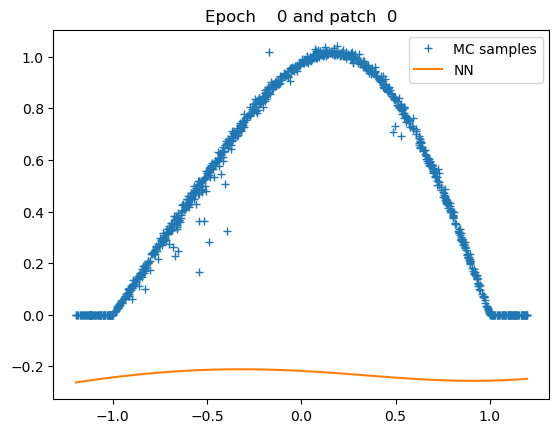

Patch  0: epoch  500 with loss 2.12E-03


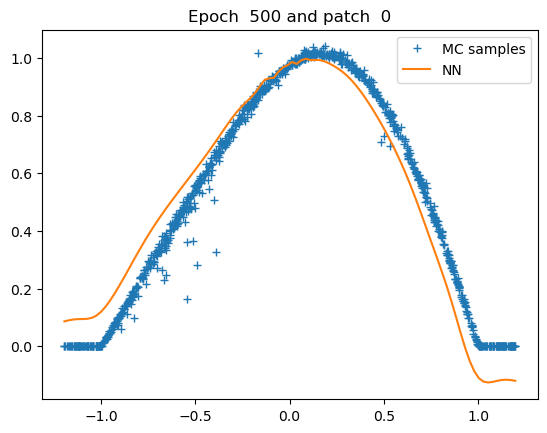

Patch  0: epoch 1000 with loss 5.75E-04


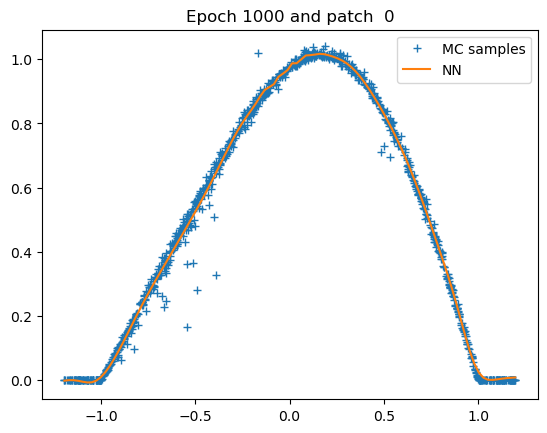

Patch  0: epoch 1500 with loss 5.74E-04


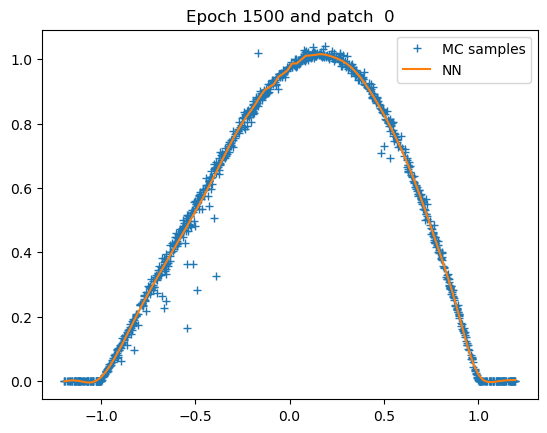

Patch  0: epoch 2000 with loss 5.74E-04


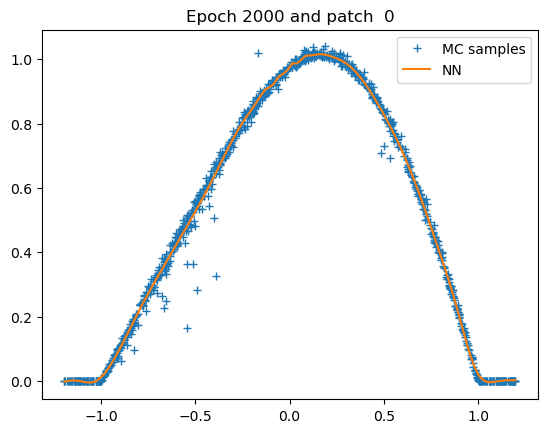

Patch  0: epoch 2500 with loss 5.74E-04


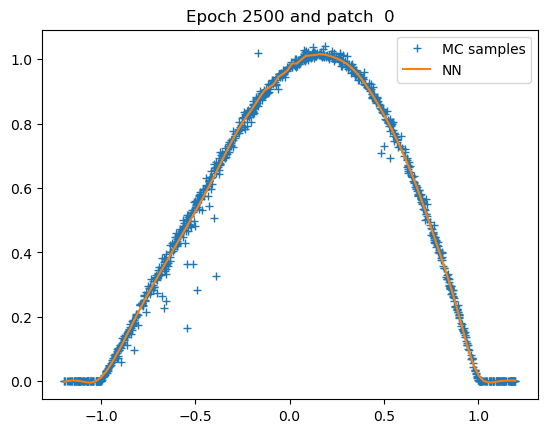

Patch  0: epoch 3000 with loss 5.73E-04


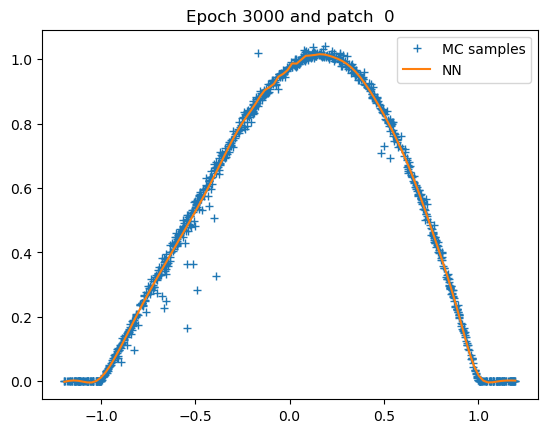

Patch  0: epoch 3500 with loss 5.73E-04


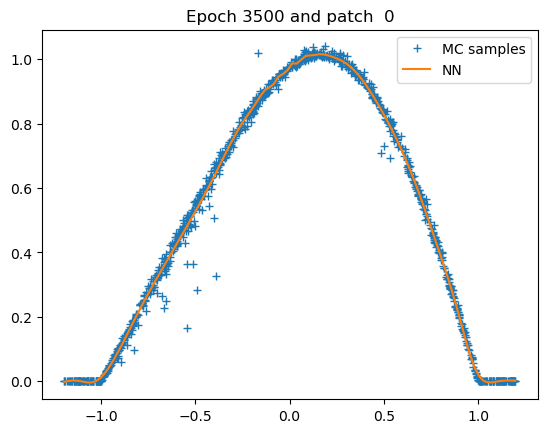

Patch  0: epoch 4000 with loss 5.73E-04


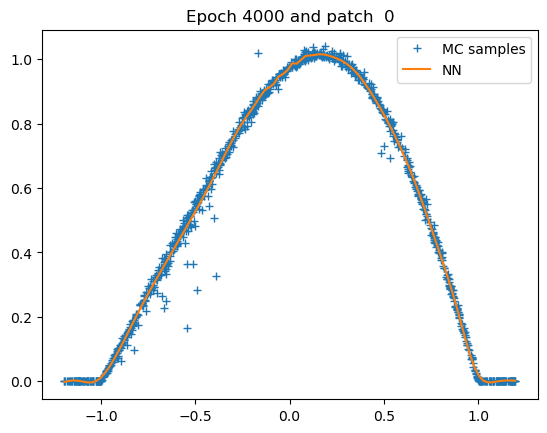

Patch  0: epoch 4500 with loss 5.73E-04


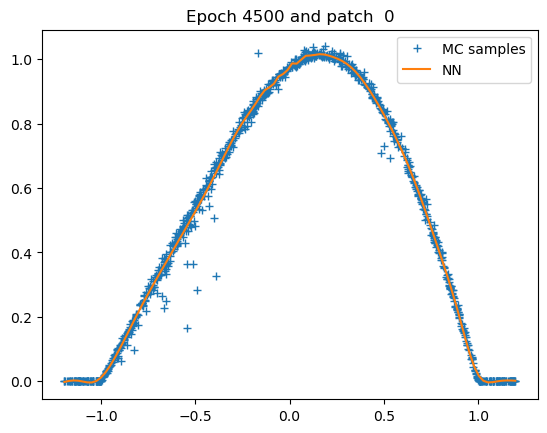

Patch  0: epoch 4999 with loss 5.73E-04


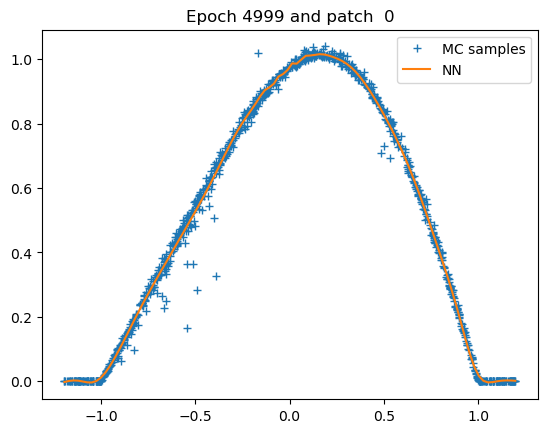

Patch 0: training of u with 5000 epochs take 39.76601529121399 seconds.
/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:74: RuntimeWarning: divide by zero encountered in divide
  branch_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())
Logs are saved in /home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/logs/tmp


Time taken: 1175 seconds; L1 error: 2.61E-02; L2 error: 1.10E-03; rel error: INF.
fdb runtime: 34 seconds; total runtime: 1209 seconds.
#### Starting deep galerkin method with seed 0 - 1 out of 1 times


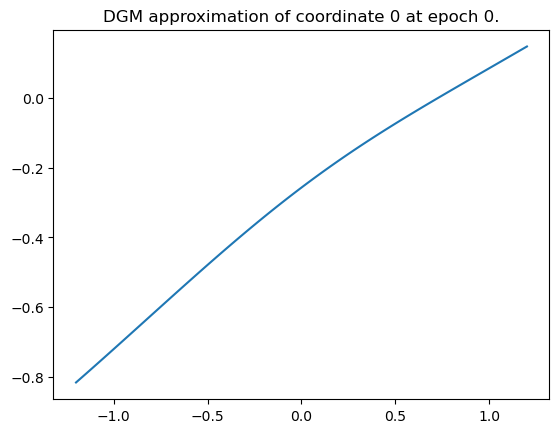

Epoch 0 with loss 1.597120761871338


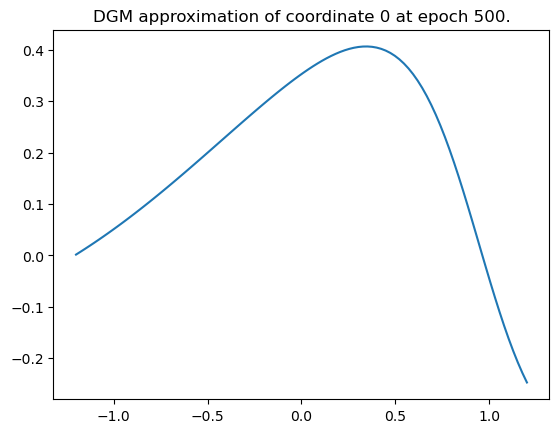

Epoch 500 with loss 0.32103297114372253


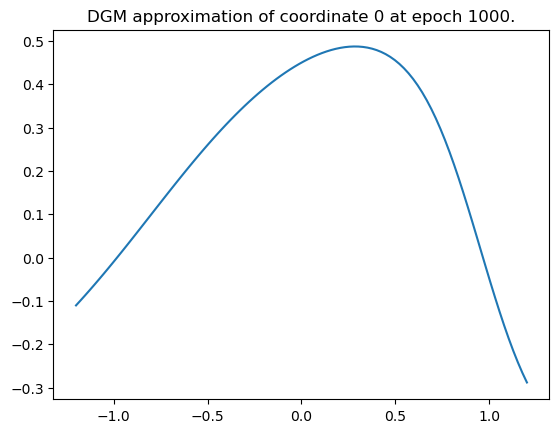

Epoch 1000 with loss 0.2702941298484802


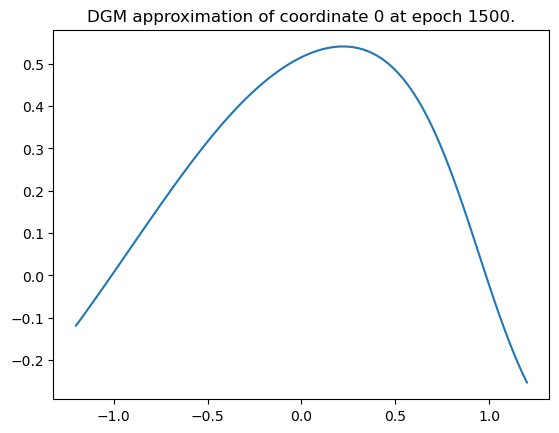

Epoch 1500 with loss 0.25084903836250305


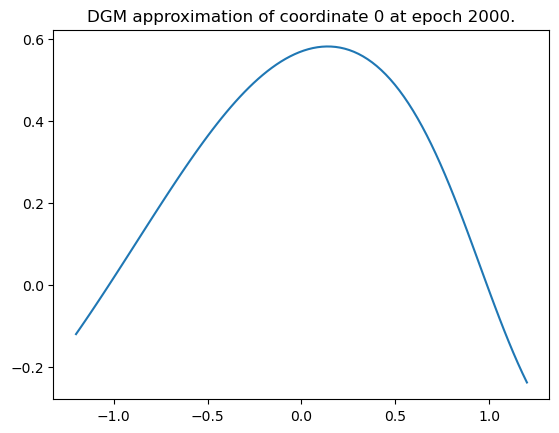

Epoch 2000 with loss 0.24626421928405762


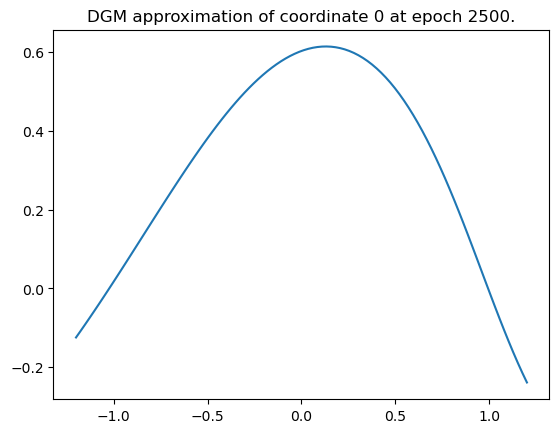

Epoch 2500 with loss 0.2402874380350113


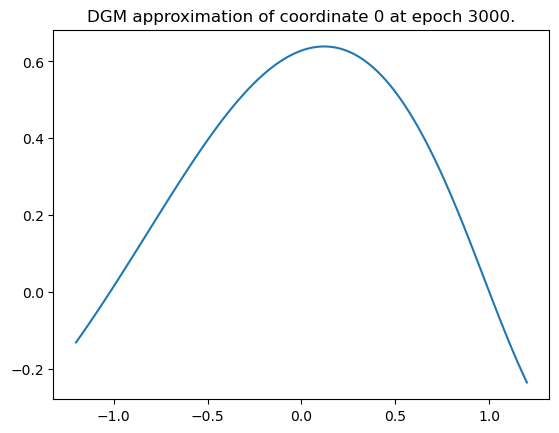

Epoch 3000 with loss 0.2391446828842163


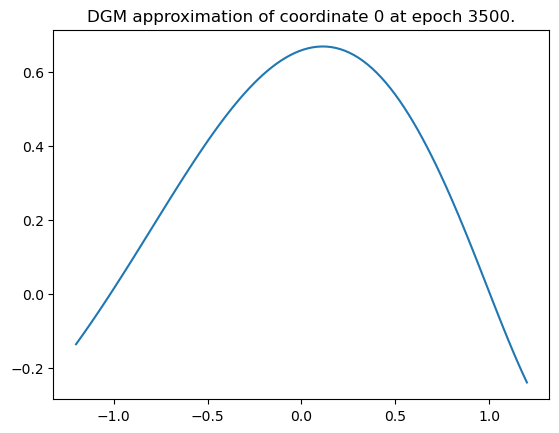

Epoch 3500 with loss 0.23761284351348877


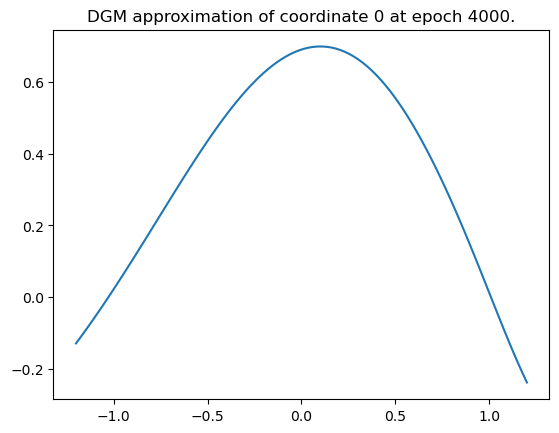

Epoch 4000 with loss 0.23522897064685822


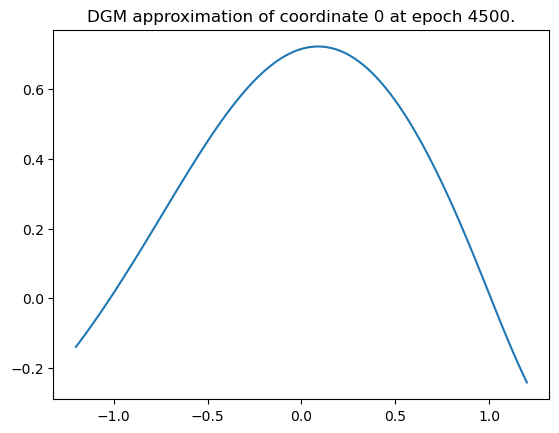

Epoch 4500 with loss 0.2332015335559845


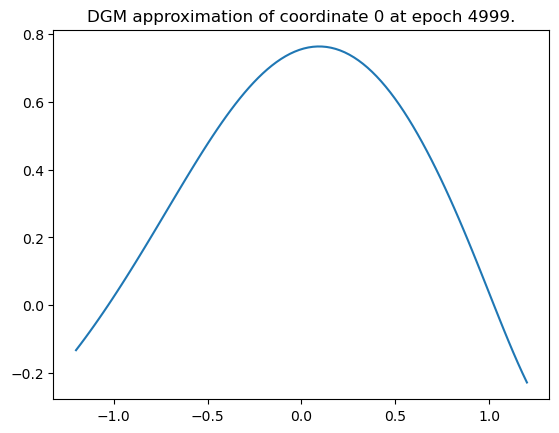

Epoch 4999 with loss 0.2293606549501419
Training of neural network with 5000 epochs take 550.2625784873962 seconds.


Time taken: 550 seconds; L1 error: 1.15E-01; L2 error: 1.81E-02; rel error: INF.
#### Starting deep BSDE method with seed 0 - 1 out of 1 times


/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:101: RuntimeWarning: divide by zero encountered in divide
  dgm_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())


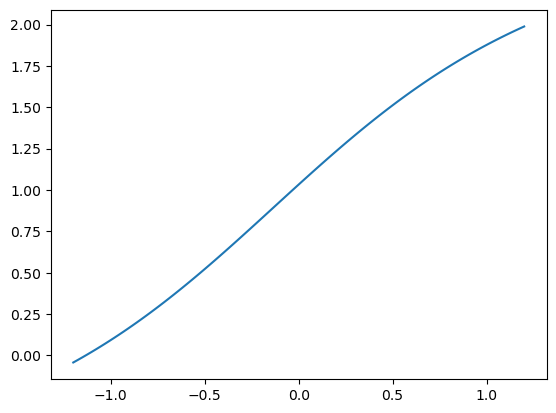

Epoch 0 with loss 1.1166166067123413


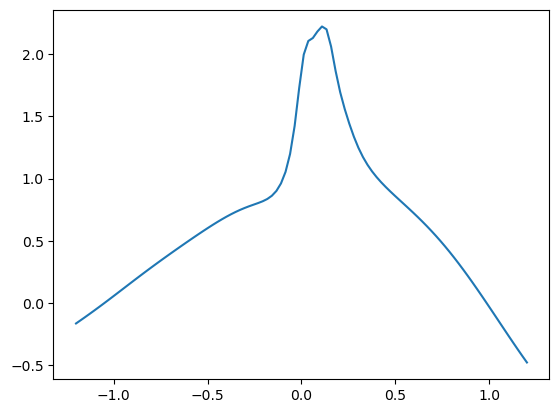

Epoch 500 with loss 0.0020445638801902533


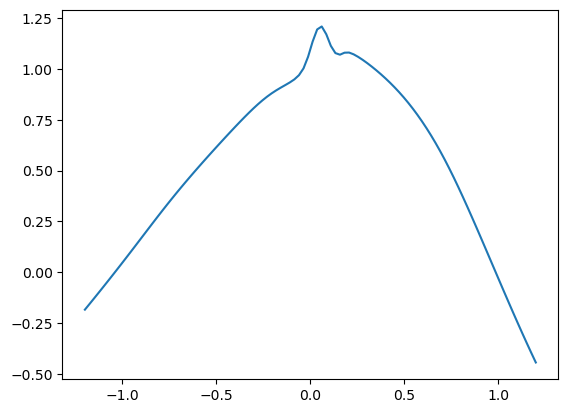

Epoch 1000 with loss 0.00039029086474329233


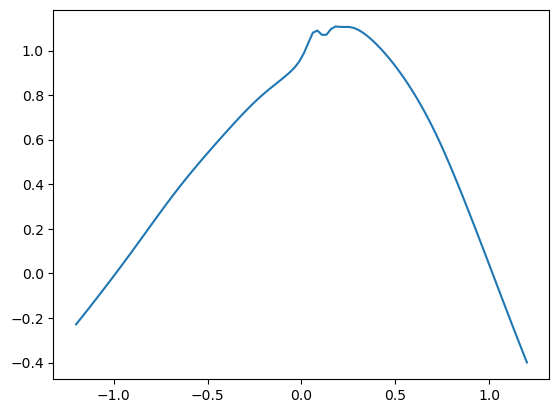

Epoch 1500 with loss 0.0008735397714190185


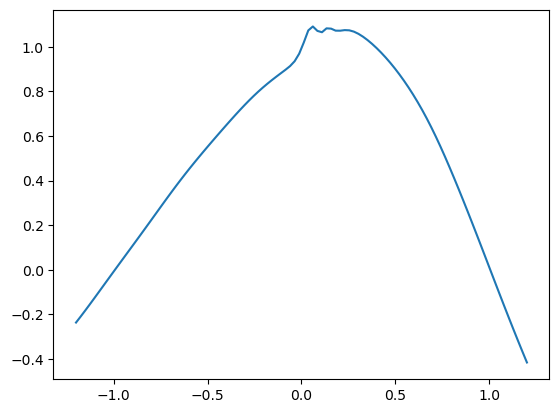

Epoch 2000 with loss 0.0003985452640336007


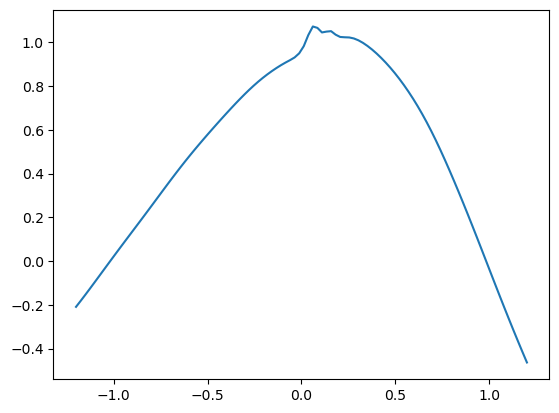

Epoch 2500 with loss 0.000774426618590951


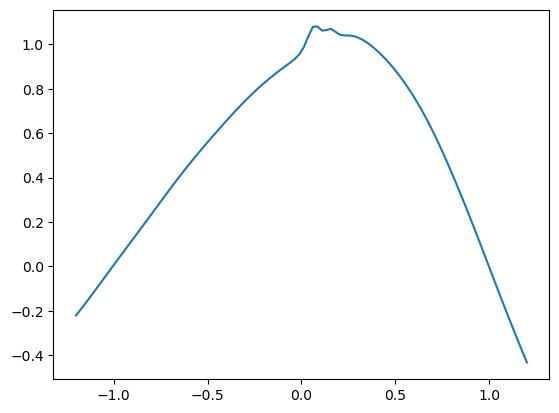

Epoch 3000 with loss 0.0003455973928794265


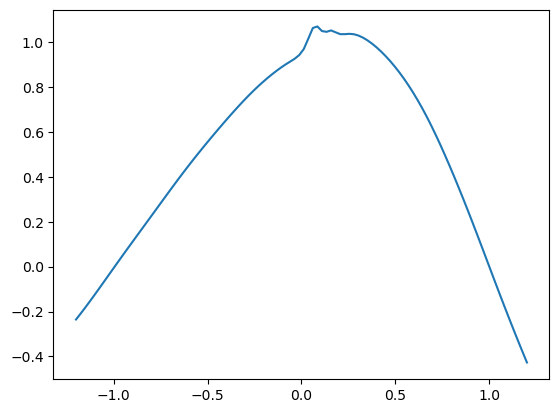

Epoch 3500 with loss 0.0007671631756238639


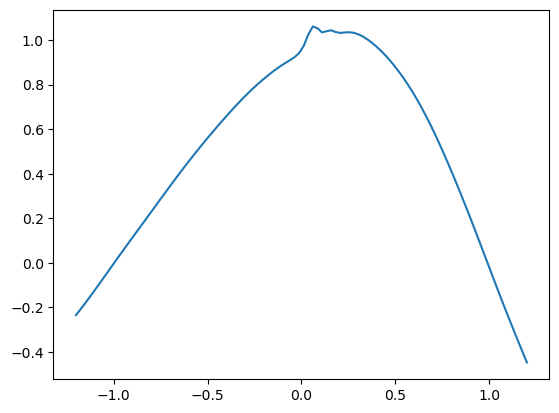

Epoch 4000 with loss 0.0005653013940900564


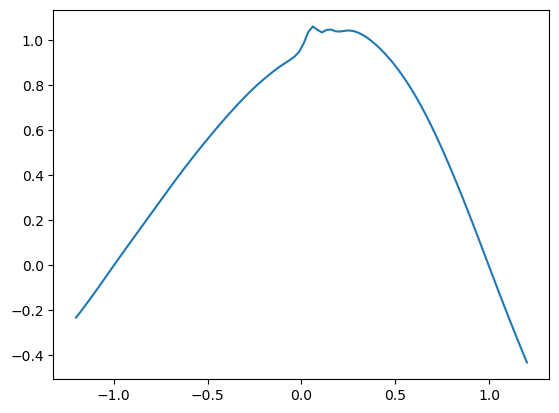

Epoch 4500 with loss 0.0006125663639977574


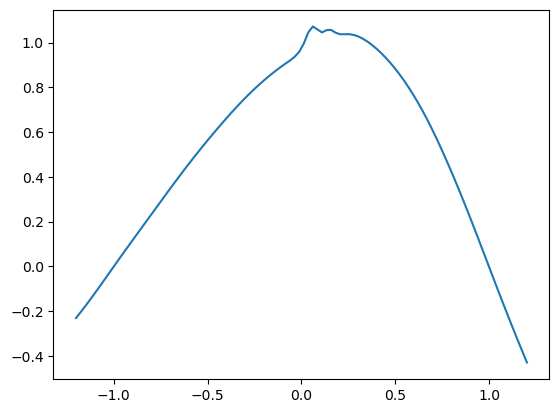

Epoch 4999 with loss 0.00039906217716634274
Training of neural network with 5000 epochs take 236.3563690185547 seconds.
Time taken: 236 seconds; L1 error: 3.72E-02; L2 error: 2.72E-03; rel error: INF.




######## Summary for deep branching method
runtime:        1175
fdb runtime:    34
total runtime:  1209
mean L1 error:  2.61E-02
std L1 error:   0.00E+00
mean L2 error:  1.10E-03
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


######## Summary for deep galerkin method
runtime:        550
mean L1 error:  1.15E-01
std L1 error:   0.00E+00
mean L2 error:  1.81E-02
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


######## Summary for deep BSDE method
runtime:        236
mean L1 error:  3.72E-02
std L1 error:   0.00E+00
mean L2 error:  2.72E-03
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:129: RuntimeWarning: divide by zero encountered in divide
  bsde_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)


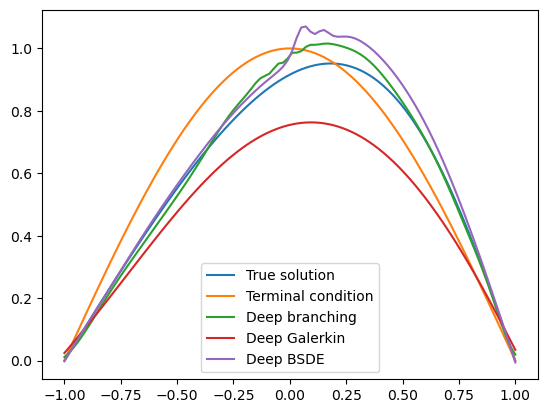

In [11]:
dim = 6
T=0.1/dim
grid_d_dim = np.concatenate((x_mid * np.ones((0, 100)), np.expand_dims(grid, axis=0), x_mid * np.ones((dim - 1, 100))), axis=0)
grid_d_dim_with_t = np.concatenate((t_lo * np.ones((1, 100)), grid_d_dim), axis=0)    
true = exact_example(t_lo, grid_d_dim, T)
terminal = exact_example(T, grid_d_dim, T)
deriv_map = np.concatenate((np.array([[0] * dim]), 1 * np.identity(dim), 2 * np.identity(dim)), axis=0).astype(int)

# Performance comparison
compare_performance(grid, grid_d_dim, grid_d_dim_with_t, t_lo, true, terminal=terminal, seeds=[0],
                    # disable_branch=True,
                    # disable_bsde=True, 
                    # disable_galerkin=True, 
                    verbose=True, debug_mode=True, 
                    conditional_probability_to_survive=partial(conditional_probability_to_survive),
                    is_x_inside=partial(is_x_inside), 
                    y_lo=x_lo, y_hi=x_hi, nu=nu,
                    T=T, device=device, epochs=5000, fname="burgers",
                    branch_nb_states=1000, branch_nb_path_per_state=3000,
                    branch_patches=1, branch_exponential_lambda=-math.log(.95)/T,
                    branch_nb_states_per_batch=1000,
                    second_order=True, bsde_nb_states=1000, bsde_nb_time_intervals=4,
                    dgm_nb_states=10000, f_fun=f_example, dgm_f_fun=dgm_f_example,
                    deriv_map=deriv_map, dgm_deriv_map=deriv_map, phi_fun=phi_example,
                    boundary_fun=boundary_fun, dgm_overtrain_rate=0, outlier_percentile=5,
                    lr_gamma=0.1, branch_lr=1e-2, branch_activation="tanh", neurons=20, layers=8,
                    save_for_best_model=False, save_as_tmp=True)

## dim = 7

#### Starting deep branching method with seed 0 - 1 out of 1 times


Logs are saved in /home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/logs/tmp
Patch 0: generation of u samples take 1630.618628501892 seconds.
Patch  0: epoch    0 with loss 5.49E-01


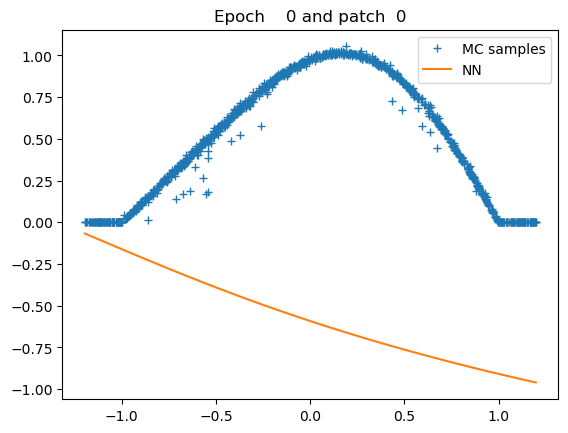

Patch  0: epoch  500 with loss 7.08E-04


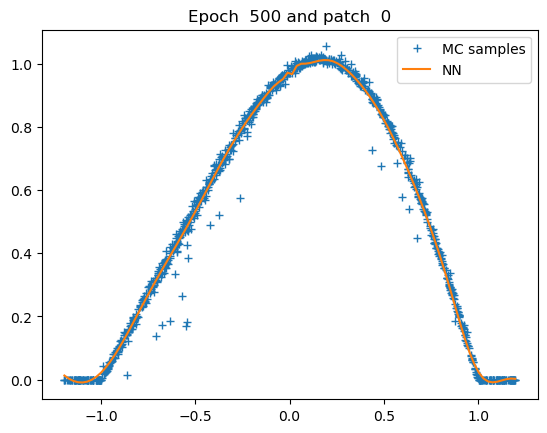

Patch  0: epoch 1000 with loss 7.34E-04


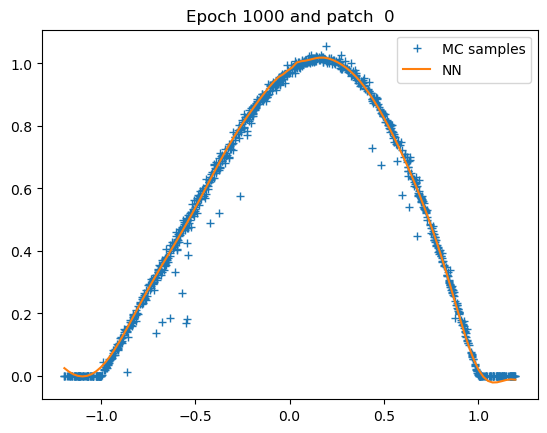

Patch  0: epoch 1500 with loss 7.01E-04


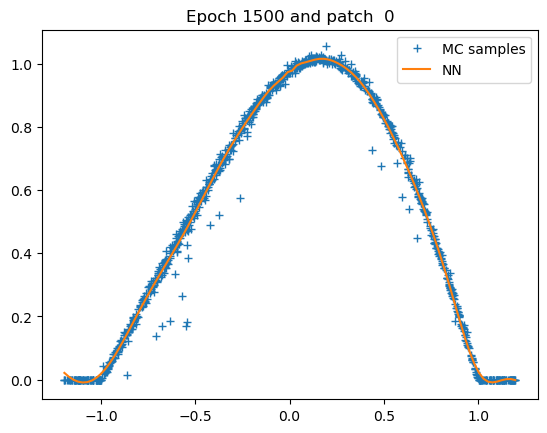

Patch  0: epoch 2000 with loss 6.98E-04


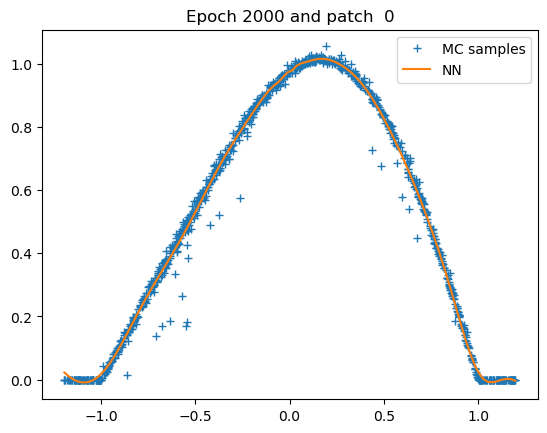

Patch  0: epoch 2500 with loss 6.98E-04


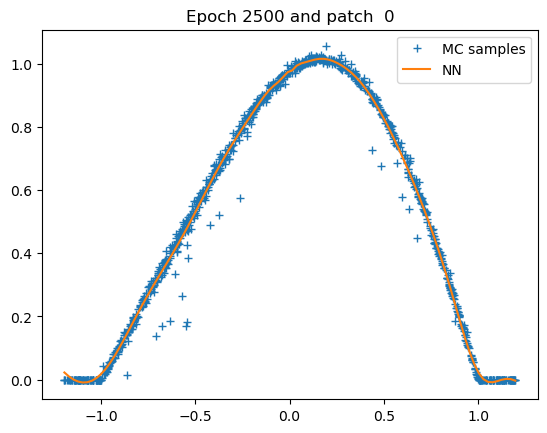

Patch  0: epoch 3000 with loss 6.98E-04


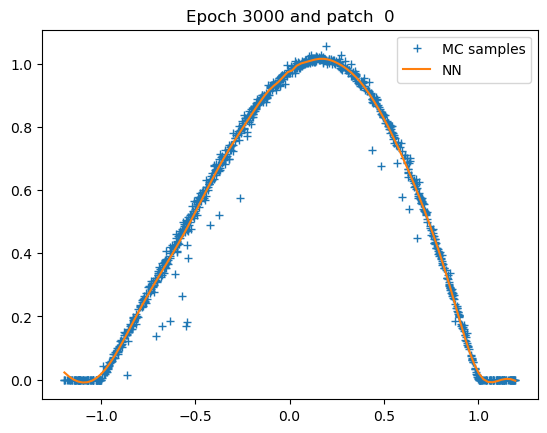

Patch  0: epoch 3500 with loss 6.97E-04


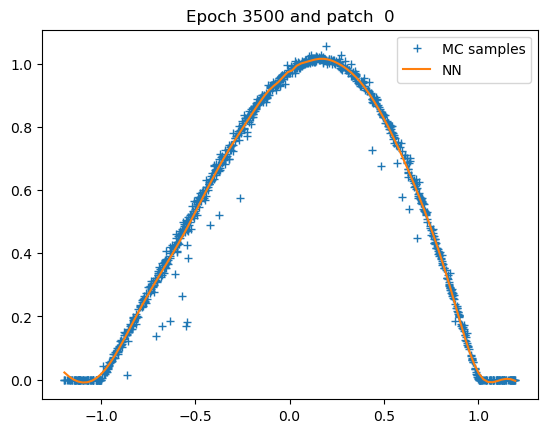

Patch  0: epoch 4000 with loss 6.97E-04


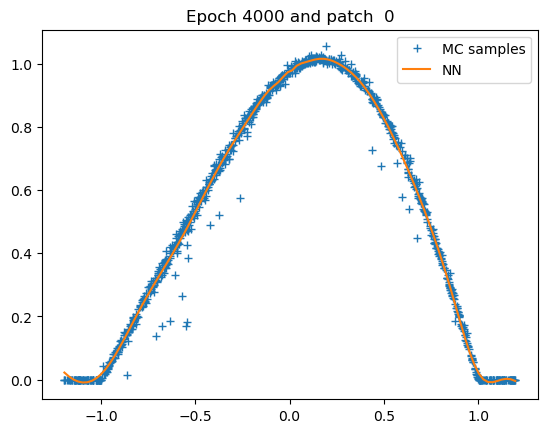

Patch  0: epoch 4500 with loss 6.96E-04


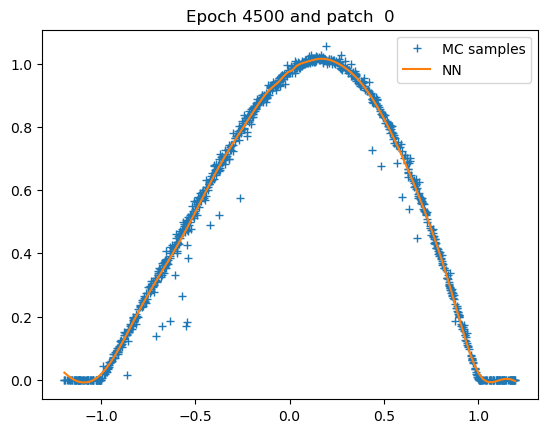

Patch  0: epoch 4999 with loss 6.95E-04


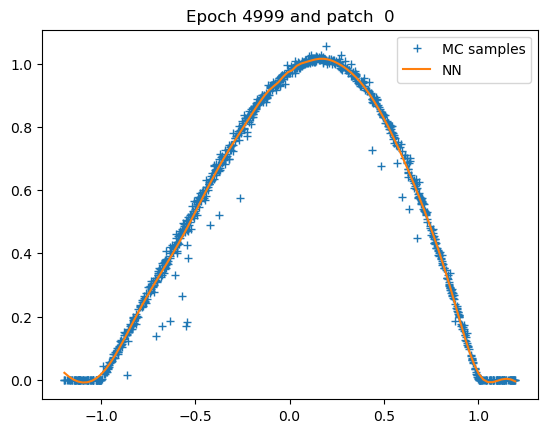

Patch 0: training of u with 5000 epochs take 36.44012475013733 seconds.
/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:74: RuntimeWarning: divide by zero encountered in divide
  branch_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())
Logs are saved in /home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/logs/tmp


Time taken: 1607 seconds; L1 error: 2.60E-02; L2 error: 1.07E-03; rel error: INF.
fdb runtime: 61 seconds; total runtime: 1668 seconds.
#### Starting deep galerkin method with seed 0 - 1 out of 1 times


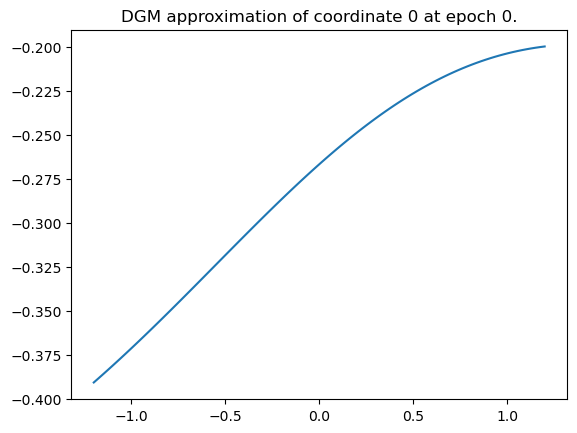

Epoch 0 with loss 1.1828182935714722


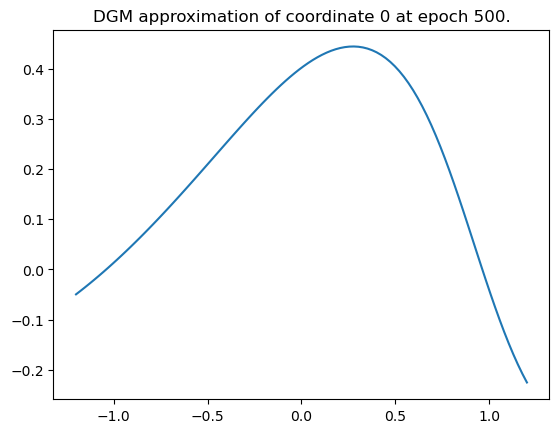

Epoch 500 with loss 0.3189826011657715


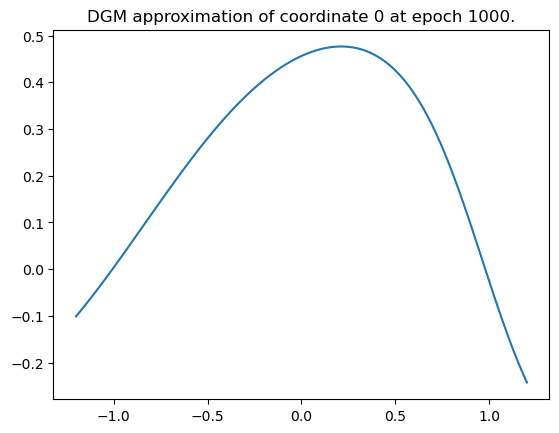

Epoch 1000 with loss 0.2835768163204193


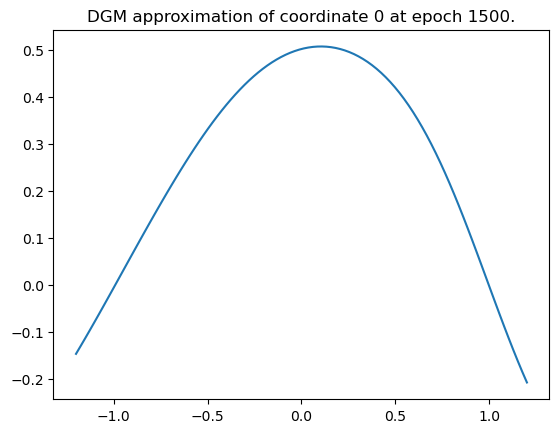

Epoch 1500 with loss 0.25953909754753113


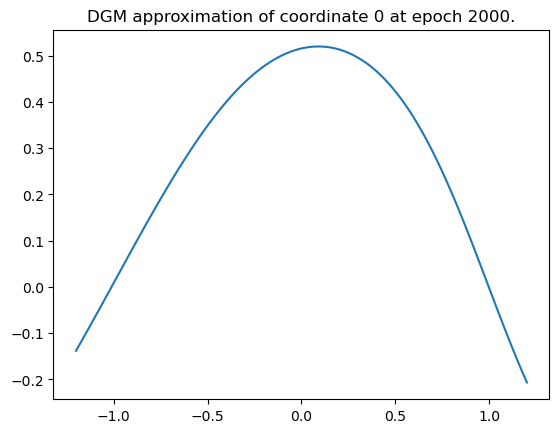

Epoch 2000 with loss 0.25545749068260193


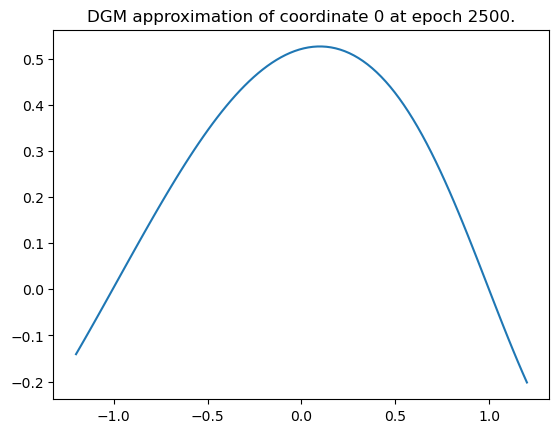

Epoch 2500 with loss 0.25184622406959534


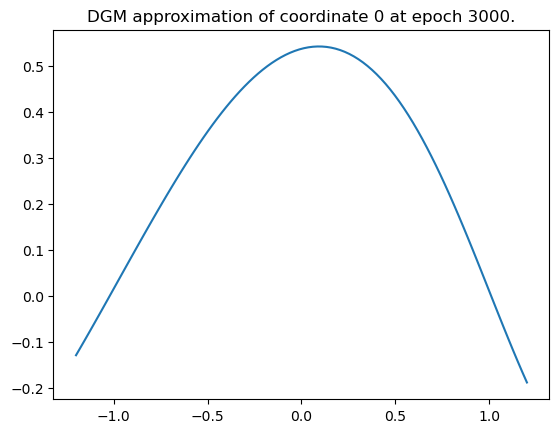

Epoch 3000 with loss 0.2489294409751892


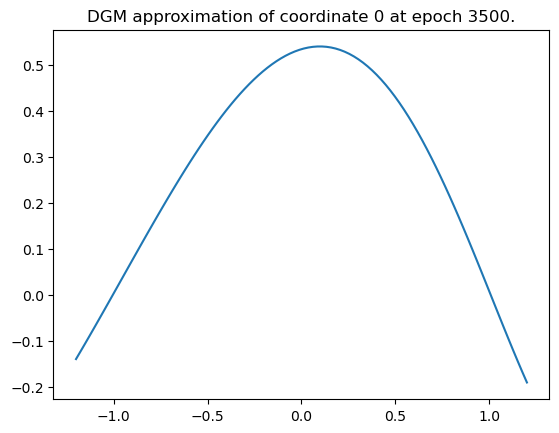

Epoch 3500 with loss 0.2459023892879486


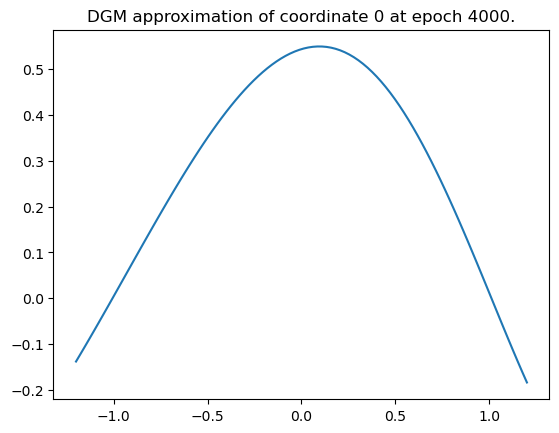

Epoch 4000 with loss 0.24391420185565948


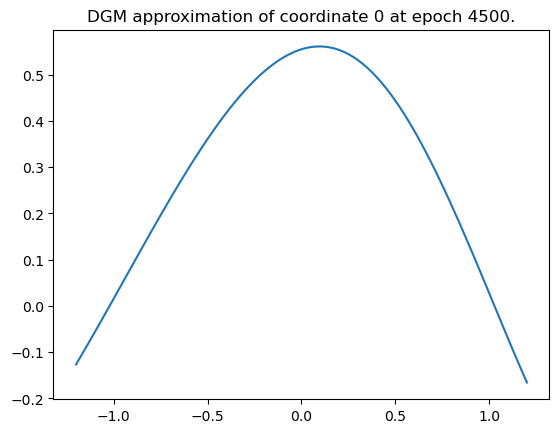

Epoch 4500 with loss 0.24996542930603027


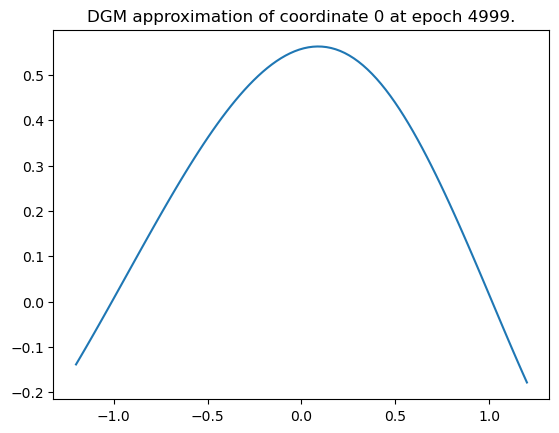

Epoch 4999 with loss 0.2433682084083557
Training of neural network with 5000 epochs take 634.9610979557037 seconds.


Time taken: 635 seconds; L1 error: 2.43E-01; L2 error: 7.59E-02; rel error: INF.
#### Starting deep BSDE method with seed 0 - 1 out of 1 times


/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:101: RuntimeWarning: divide by zero encountered in divide
  dgm_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())


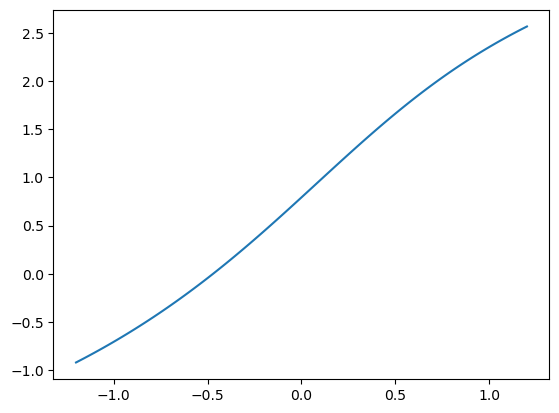

Epoch 0 with loss 0.6358468532562256


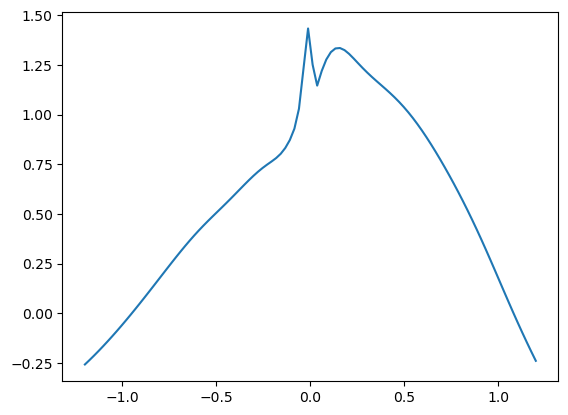

Epoch 500 with loss 0.010403246618807316


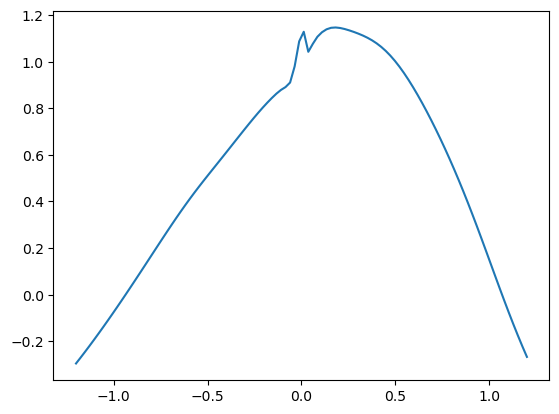

Epoch 1000 with loss 0.0008102707797661424


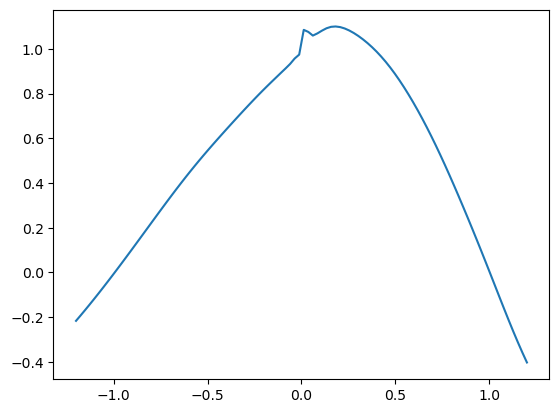

Epoch 1500 with loss 0.0021740098018199205


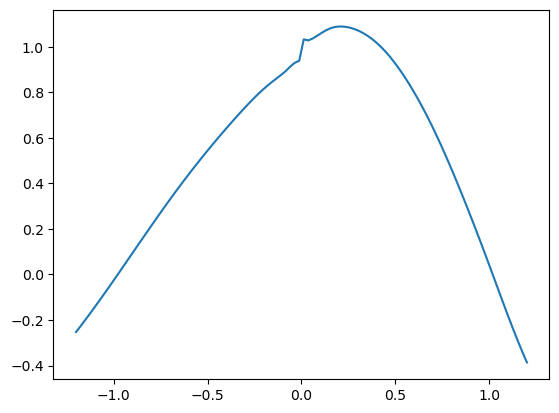

Epoch 2000 with loss 0.0003808590117841959


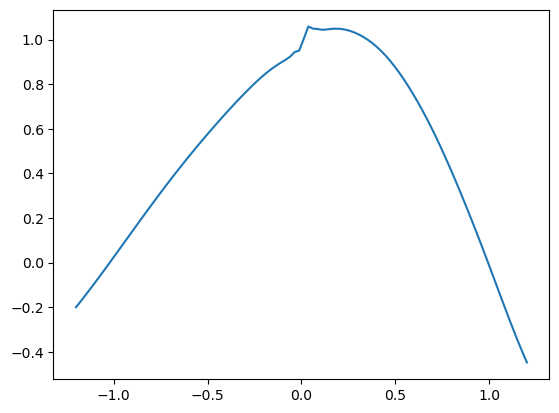

Epoch 2500 with loss 0.00040368243935517967


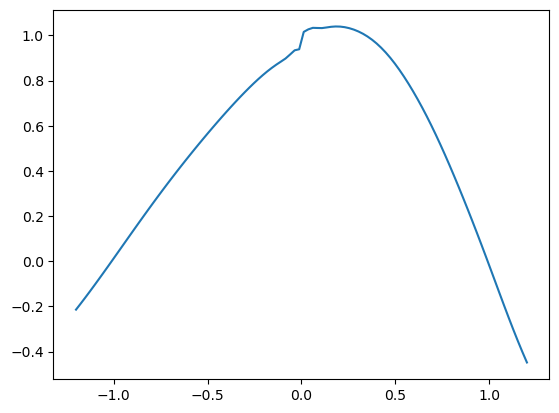

Epoch 3000 with loss 0.0013986175181344151


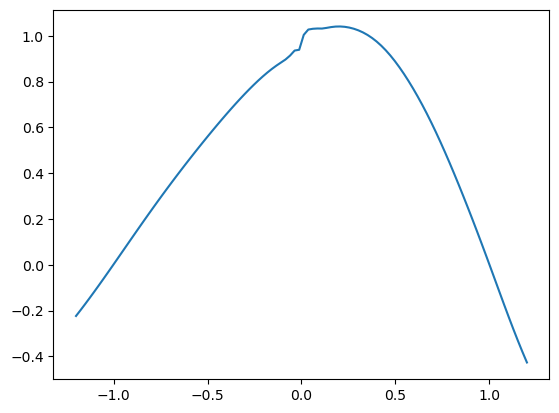

Epoch 3500 with loss 0.0002912451745942235


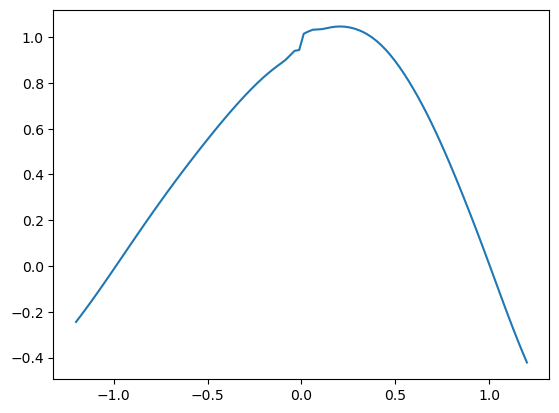

Epoch 4000 with loss 0.0004836395673919469


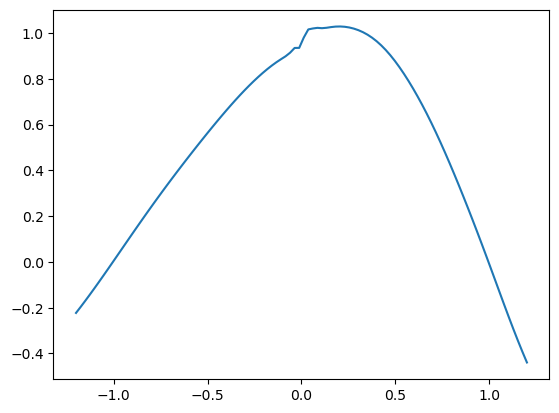

Epoch 4500 with loss 0.00031268372549675405


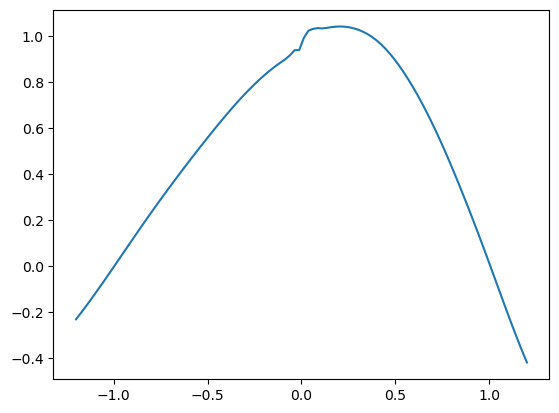

Epoch 4999 with loss 0.0008605922921560705
Training of neural network with 5000 epochs take 230.70040154457092 seconds.
Time taken: 231 seconds; L1 error: 3.75E-02; L2 error: 2.58E-03; rel error: INF.




######## Summary for deep branching method
runtime:        1607
fdb runtime:    61
total runtime:  1668
mean L1 error:  2.60E-02
std L1 error:   0.00E+00
mean L2 error:  1.07E-03
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


######## Summary for deep galerkin method
runtime:        635
mean L1 error:  2.43E-01
std L1 error:   0.00E+00
mean L2 error:  7.59E-02
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


######## Summary for deep BSDE method
runtime:        231
mean L1 error:  3.75E-02
std L1 error:   0.00E+00
mean L2 error:  2.58E-03
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:129: RuntimeWarning: divide by zero encountered in divide
  bsde_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)


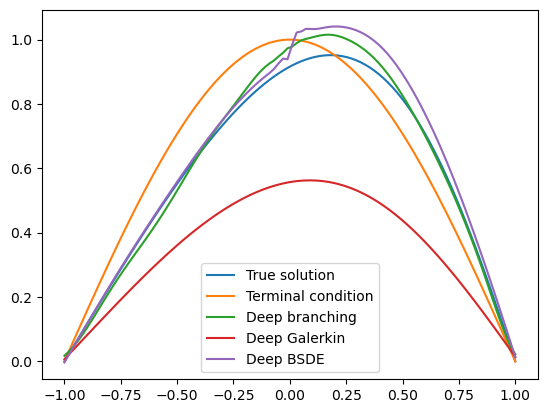

In [12]:
dim = 7
T=0.1/dim
grid_d_dim = np.concatenate((x_mid * np.ones((0, 100)), np.expand_dims(grid, axis=0), x_mid * np.ones((dim - 1, 100))), axis=0)
grid_d_dim_with_t = np.concatenate((t_lo * np.ones((1, 100)), grid_d_dim), axis=0)    
true = exact_example(t_lo, grid_d_dim, T)
terminal = exact_example(T, grid_d_dim, T)
deriv_map = np.concatenate((np.array([[0] * dim]), 1 * np.identity(dim), 2 * np.identity(dim)), axis=0).astype(int)

# Performance comparison
compare_performance(grid, grid_d_dim, grid_d_dim_with_t, t_lo, true, terminal=terminal, seeds=[0],
                    # disable_branch=True,
                    # disable_bsde=True, 
                    # disable_galerkin=True, 
                    verbose=True, debug_mode=True, 
                    conditional_probability_to_survive=partial(conditional_probability_to_survive),
                    is_x_inside=partial(is_x_inside), 
                    y_lo=x_lo, y_hi=x_hi, nu=nu,
                    T=T, device=device, epochs=5000, fname="burgers",
                    branch_nb_states=1000, branch_nb_path_per_state=3000,
                    branch_patches=1, branch_exponential_lambda=-math.log(.95)/T,
                    branch_nb_states_per_batch=1000,
                    second_order=True, bsde_nb_states=1000, bsde_nb_time_intervals=4,
                    dgm_nb_states=10000, f_fun=f_example, dgm_f_fun=dgm_f_example,
                    deriv_map=deriv_map, dgm_deriv_map=deriv_map, phi_fun=phi_example,
                    boundary_fun=boundary_fun, dgm_overtrain_rate=0, outlier_percentile=5,
                    lr_gamma=0.1, branch_lr=1e-2, branch_activation="tanh", neurons=20, layers=8,
                    save_for_best_model=False, save_as_tmp=True)

## dim = 8

#### Starting deep branching method with seed 0 - 1 out of 1 times


Logs are saved in /home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/logs/tmp
Patch 0: generation of u samples take 2233.203206062317 seconds.
Patch  0: epoch    0 with loss 2.89E+00


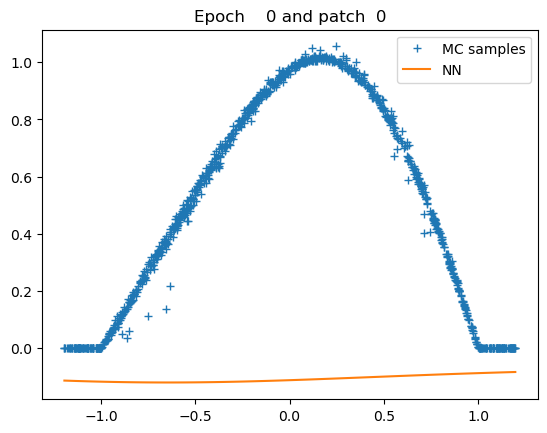

Patch  0: epoch  500 with loss 3.37E-04


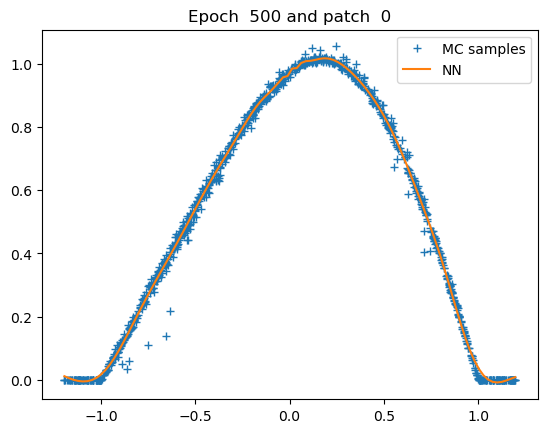

Patch  0: epoch 1000 with loss 3.24E-04


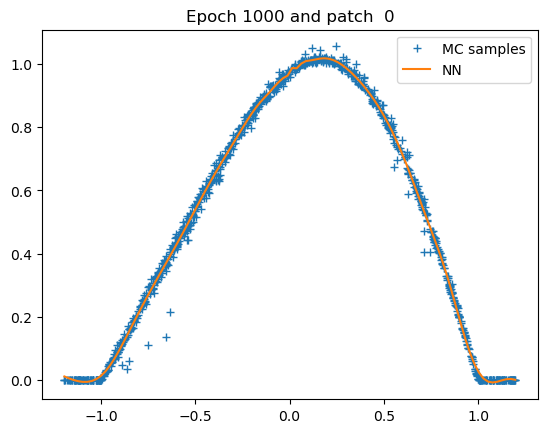

Patch  0: epoch 1500 with loss 3.23E-04


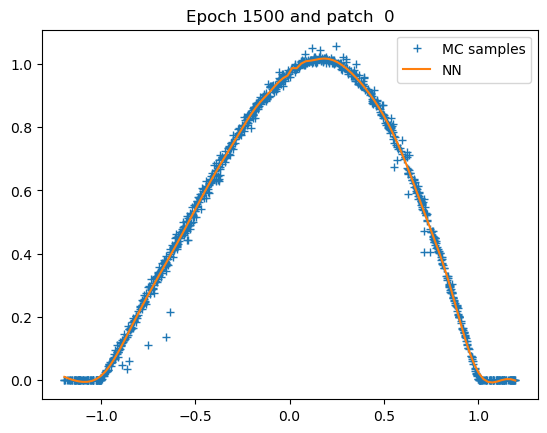

Patch  0: epoch 2000 with loss 3.22E-04


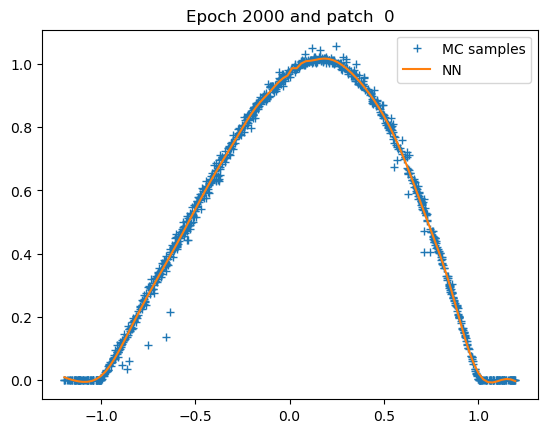

Patch  0: epoch 2500 with loss 3.22E-04


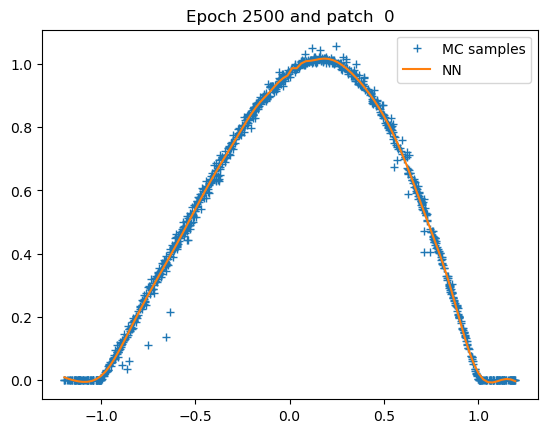

Patch  0: epoch 3000 with loss 3.22E-04


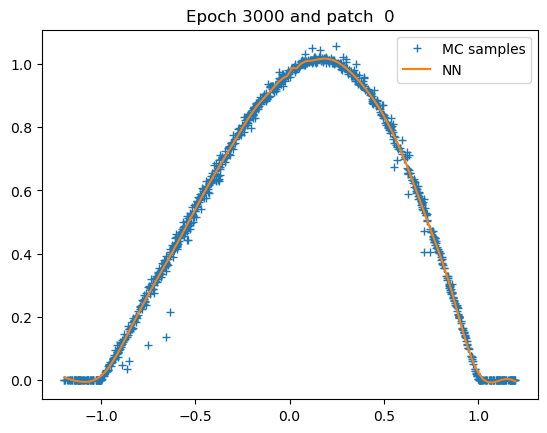

Patch  0: epoch 3500 with loss 3.22E-04


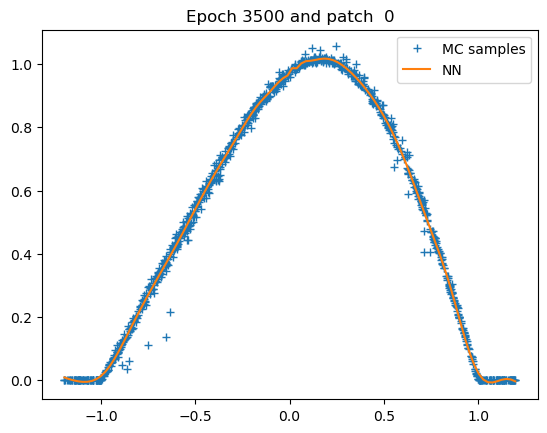

Patch  0: epoch 4000 with loss 3.21E-04


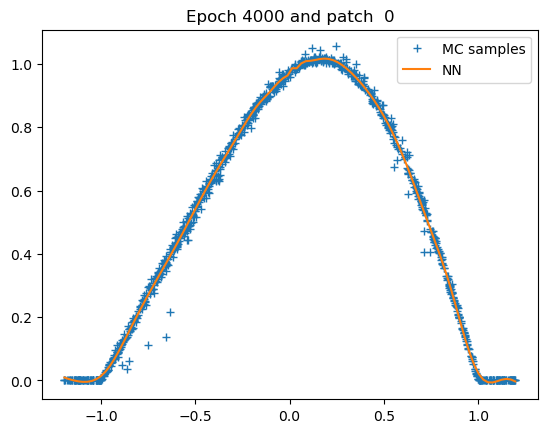

Patch  0: epoch 4500 with loss 3.21E-04


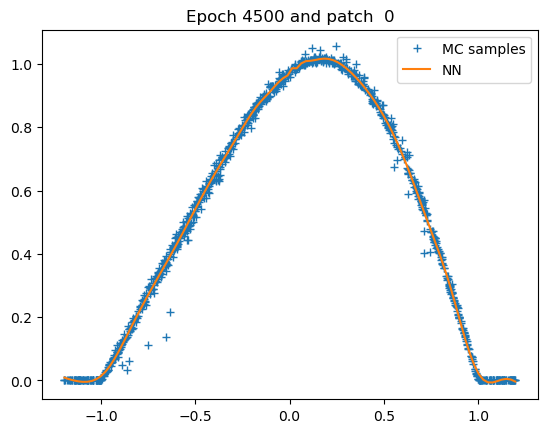

Patch  0: epoch 4999 with loss 3.21E-04


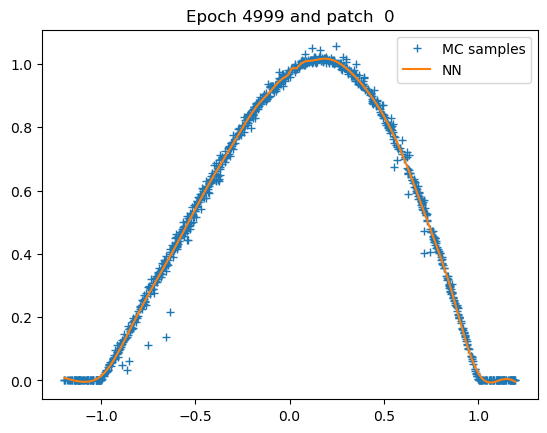

Patch 0: training of u with 5000 epochs take 35.9368851184845 seconds.
/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:74: RuntimeWarning: divide by zero encountered in divide
  branch_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())
Logs are saved in /home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/logs/tmp


Time taken: 2190 seconds; L1 error: 2.59E-02; L2 error: 1.08E-03; rel error: INF.
fdb runtime: 81 seconds; total runtime: 2270 seconds.
#### Starting deep galerkin method with seed 0 - 1 out of 1 times


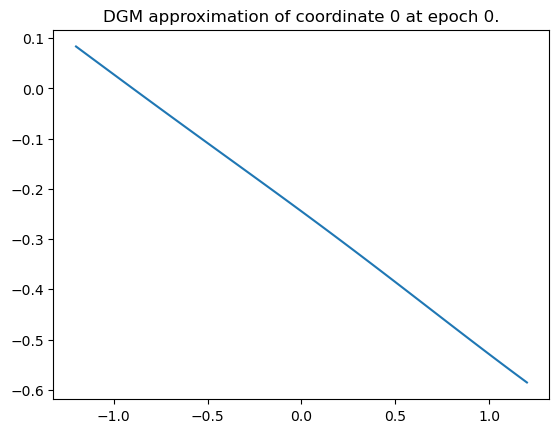

Epoch 0 with loss 1.2467961311340332


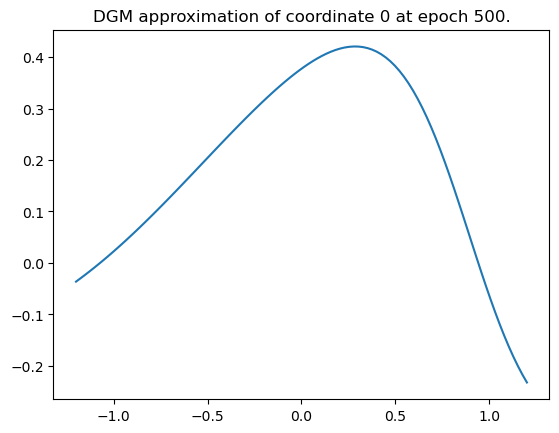

Epoch 500 with loss 0.3325274586677551


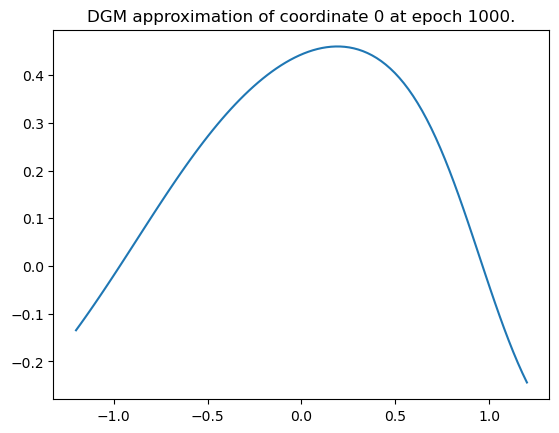

Epoch 1000 with loss 0.29730111360549927


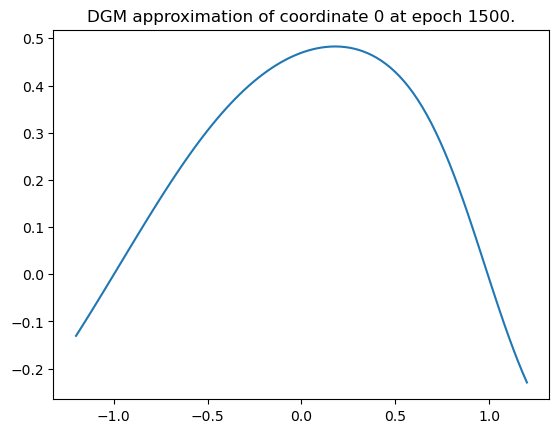

Epoch 1500 with loss 0.267569363117218


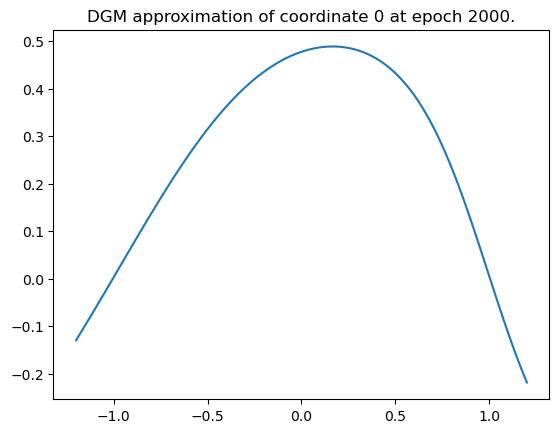

Epoch 2000 with loss 0.266094446182251


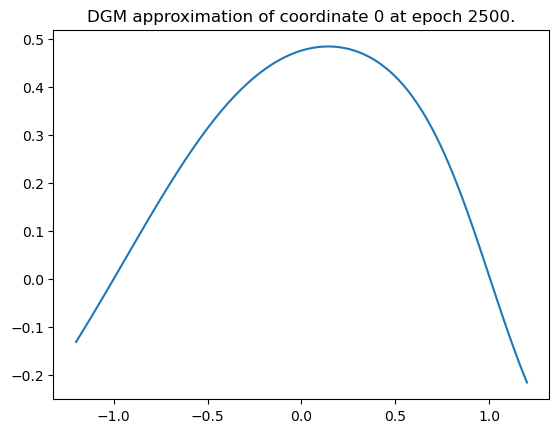

Epoch 2500 with loss 0.2592502236366272


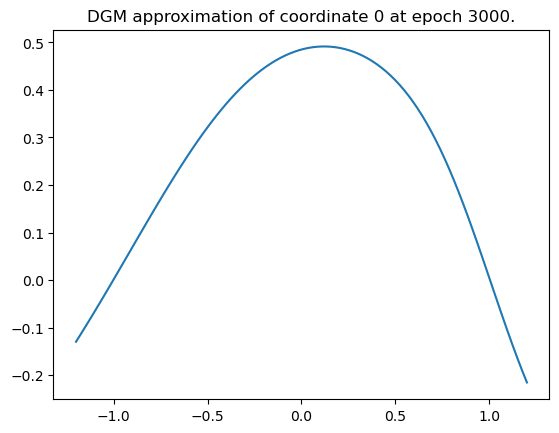

Epoch 3000 with loss 0.25749415159225464


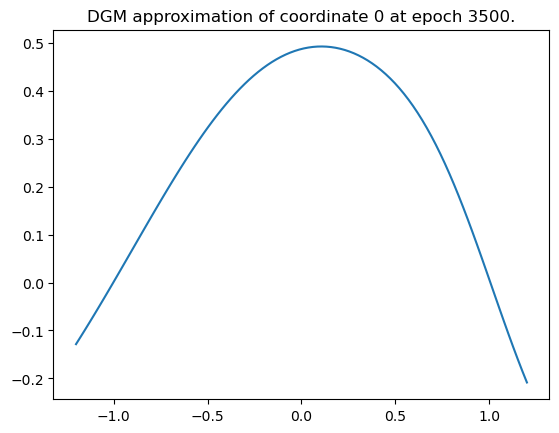

Epoch 3500 with loss 0.2563460171222687


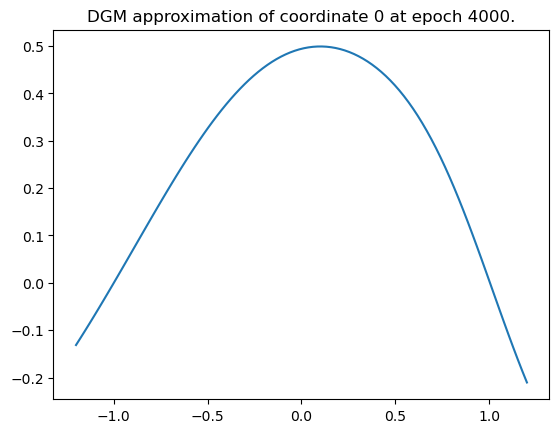

Epoch 4000 with loss 0.25454461574554443


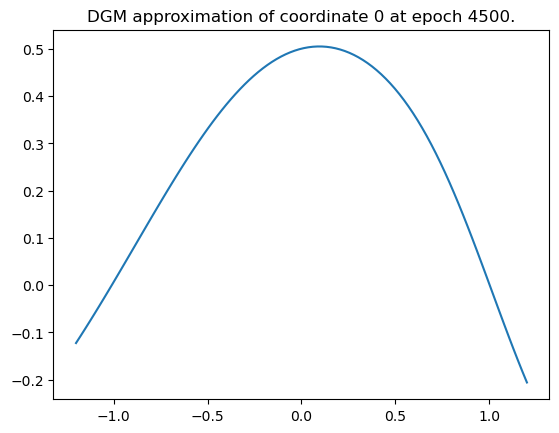

Epoch 4500 with loss 0.2557452917098999


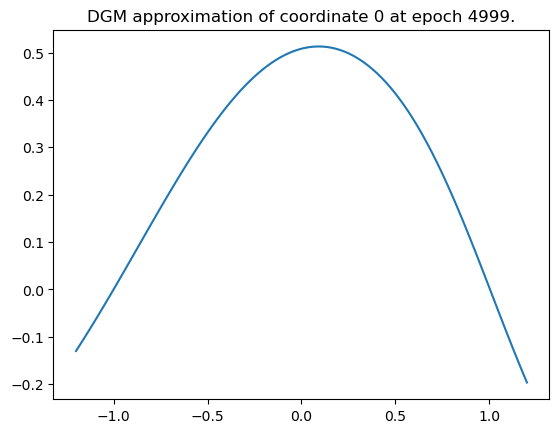

Epoch 4999 with loss 0.25139713287353516
Training of neural network with 5000 epochs take 723.160968542099 seconds.


Time taken: 723 seconds; L1 error: 2.71E-01; L2 error: 9.30E-02; rel error: INF.
#### Starting deep BSDE method with seed 0 - 1 out of 1 times


/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:101: RuntimeWarning: divide by zero encountered in divide
  dgm_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())


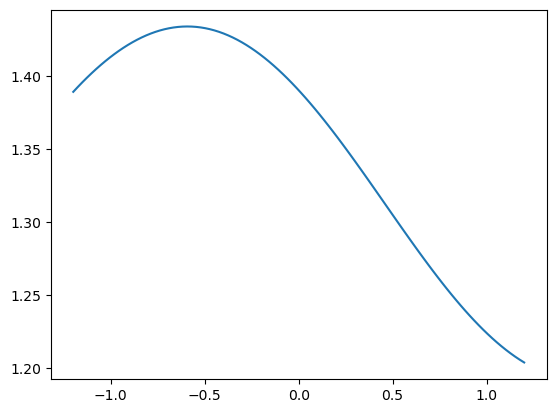

Epoch 0 with loss 1.2951319217681885


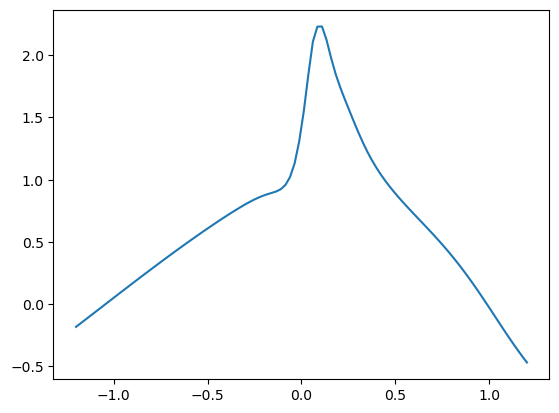

Epoch 500 with loss 0.0015041535953059793


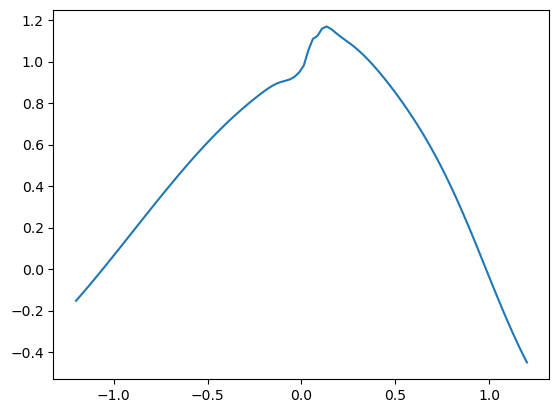

Epoch 1000 with loss 0.0021387613378465176


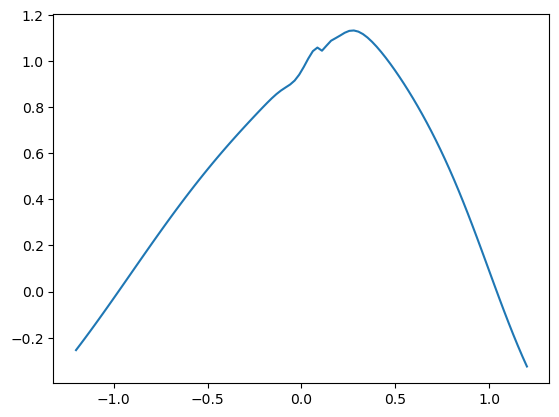

Epoch 1500 with loss 0.0036083594895899296


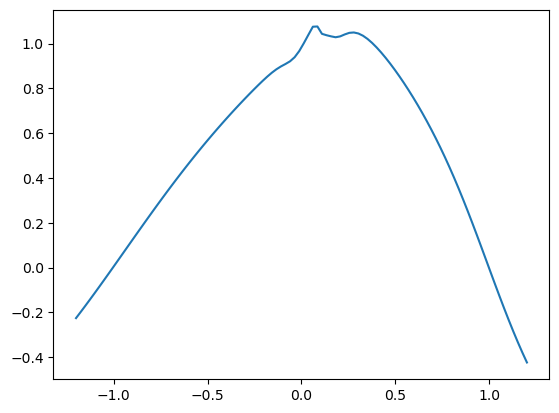

Epoch 2000 with loss 0.0013148185098543763


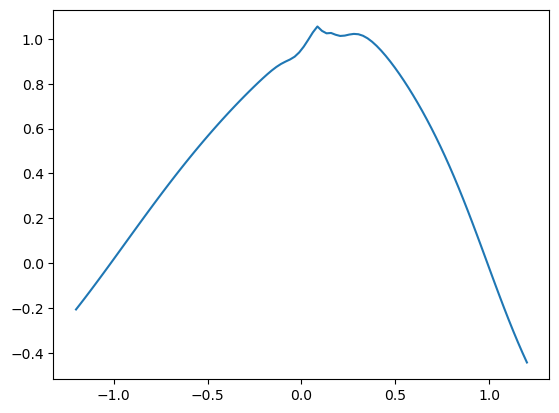

Epoch 2500 with loss 0.0004455527232494205


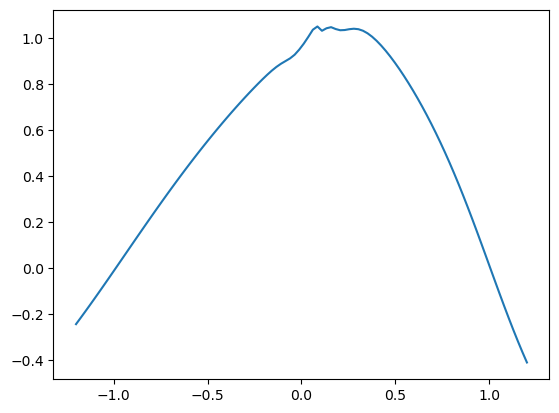

Epoch 3000 with loss 0.0008548053447157145


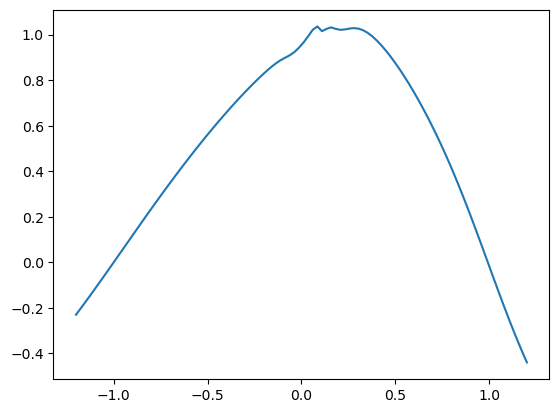

Epoch 3500 with loss 0.0004479103081393987


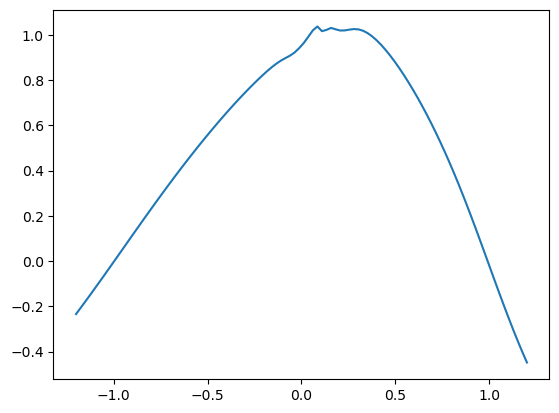

Epoch 4000 with loss 0.0002770261780824512


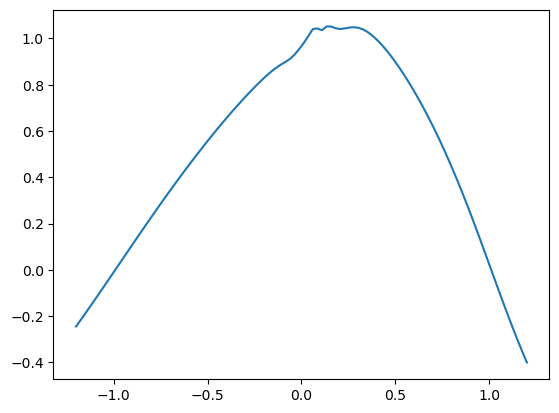

Epoch 4500 with loss 0.0006637260667048395


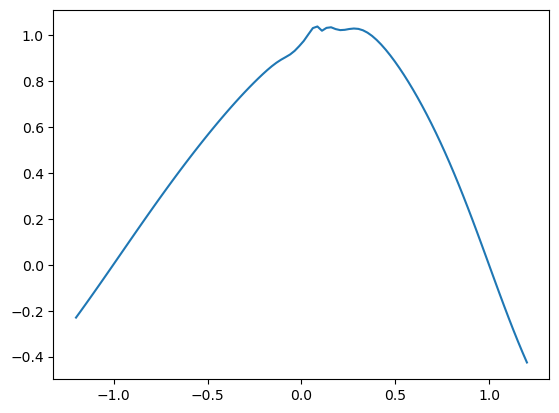

Epoch 4999 with loss 0.00043170785647816956
Training of neural network with 5000 epochs take 228.1558346748352 seconds.
Time taken: 228 seconds; L1 error: 3.62E-02; L2 error: 2.24E-03; rel error: INF.




######## Summary for deep branching method
runtime:        2190
fdb runtime:    81
total runtime:  2270
mean L1 error:  2.59E-02
std L1 error:   0.00E+00
mean L2 error:  1.08E-03
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


######## Summary for deep galerkin method
runtime:        723
mean L1 error:  2.71E-01
std L1 error:   0.00E+00
mean L2 error:  9.30E-02
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


######## Summary for deep BSDE method
runtime:        228
mean L1 error:  3.62E-02
std L1 error:   0.00E+00
mean L2 error:  2.24E-03
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:129: RuntimeWarning: divide by zero encountered in divide
  bsde_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)


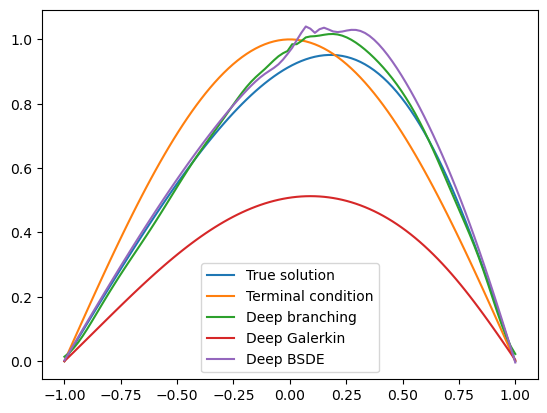

In [13]:
dim = 8
T=0.1/dim
grid_d_dim = np.concatenate((x_mid * np.ones((0, 100)), np.expand_dims(grid, axis=0), x_mid * np.ones((dim - 1, 100))), axis=0)
grid_d_dim_with_t = np.concatenate((t_lo * np.ones((1, 100)), grid_d_dim), axis=0)    
true = exact_example(t_lo, grid_d_dim, T)
terminal = exact_example(T, grid_d_dim, T)
deriv_map = np.concatenate((np.array([[0] * dim]), 1 * np.identity(dim), 2 * np.identity(dim)), axis=0).astype(int)

# Performance comparison
compare_performance(grid, grid_d_dim, grid_d_dim_with_t, t_lo, true, terminal=terminal, seeds=[0],
                    # disable_branch=True,
                    # disable_bsde=True, 
                    # disable_galerkin=True, 
                    verbose=True, debug_mode=True, 
                    conditional_probability_to_survive=partial(conditional_probability_to_survive),
                    is_x_inside=partial(is_x_inside), 
                    y_lo=x_lo, y_hi=x_hi, nu=nu,
                    T=T, device=device, epochs=5000, fname="burgers",
                    branch_nb_states=1000, branch_nb_path_per_state=3000,
                    branch_patches=1, branch_exponential_lambda=-math.log(.95)/T,
                    branch_nb_states_per_batch=1000,
                    second_order=True, bsde_nb_states=1000, bsde_nb_time_intervals=4,
                    dgm_nb_states=10000, f_fun=f_example, dgm_f_fun=dgm_f_example,
                    deriv_map=deriv_map, dgm_deriv_map=deriv_map, phi_fun=phi_example,
                    boundary_fun=boundary_fun, dgm_overtrain_rate=0, outlier_percentile=5,
                    lr_gamma=0.1, branch_lr=1e-2, branch_activation="tanh", neurons=20, layers=8,
                    save_for_best_model=False, save_as_tmp=True)

## dim = 9

#### Starting deep branching method with seed 0 - 1 out of 1 times


Logs are saved in /home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/logs/tmp
Patch 0: generation of u samples take 2773.4958124160767 seconds.
Patch  0: epoch    0 with loss 1.37E+00


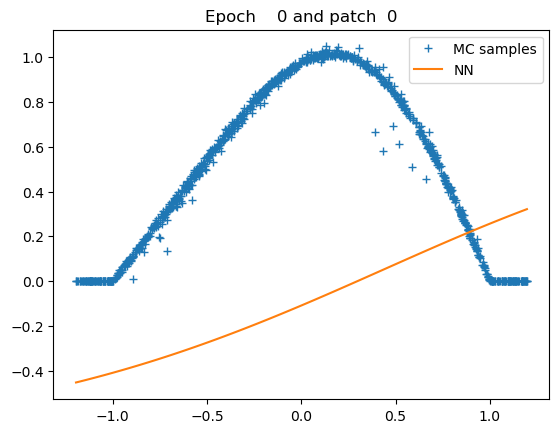

Patch  0: epoch  500 with loss 5.32E-04


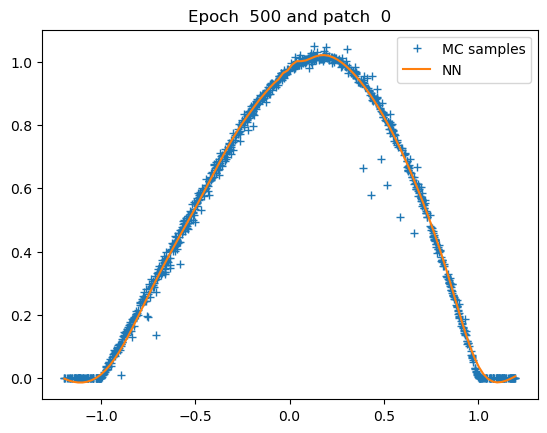

Patch  0: epoch 1000 with loss 5.17E-04


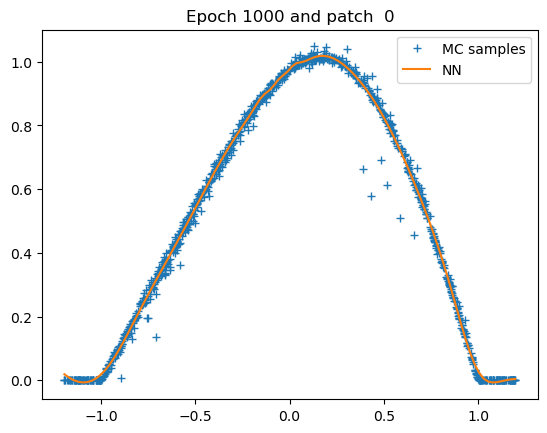

Patch  0: epoch 1500 with loss 5.16E-04


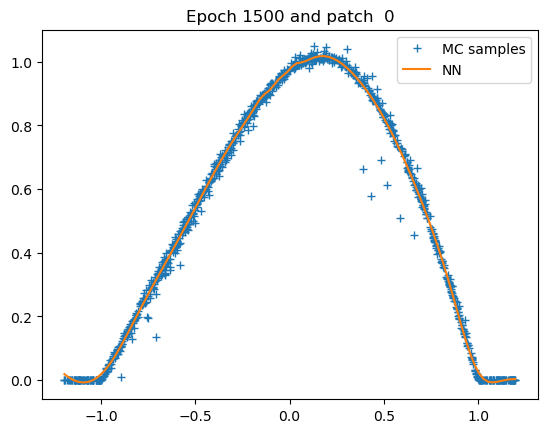

Patch  0: epoch 2000 with loss 5.15E-04


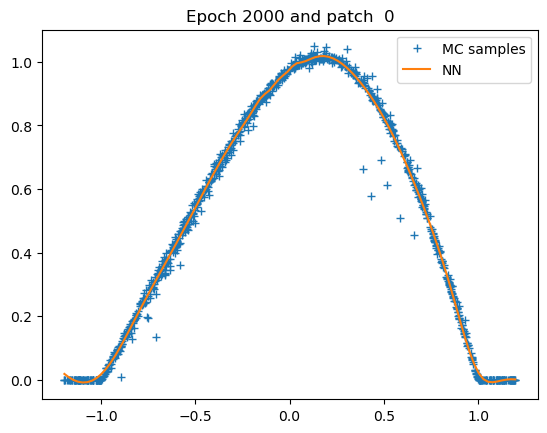

Patch  0: epoch 2500 with loss 5.15E-04


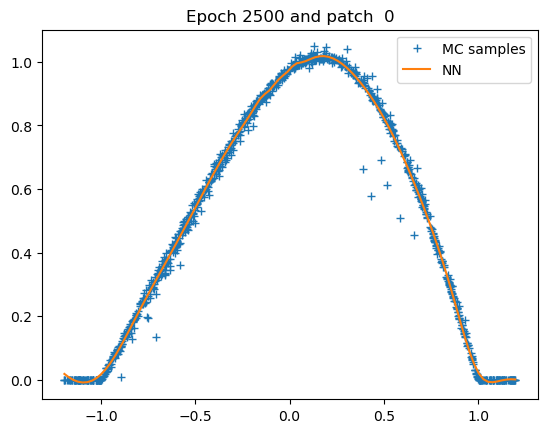

Patch  0: epoch 3000 with loss 5.14E-04


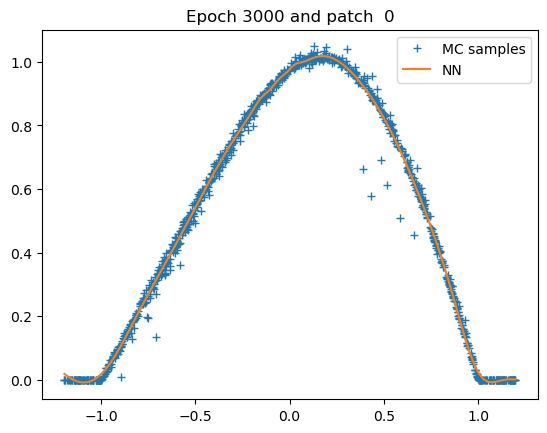

Patch  0: epoch 3500 with loss 5.14E-04


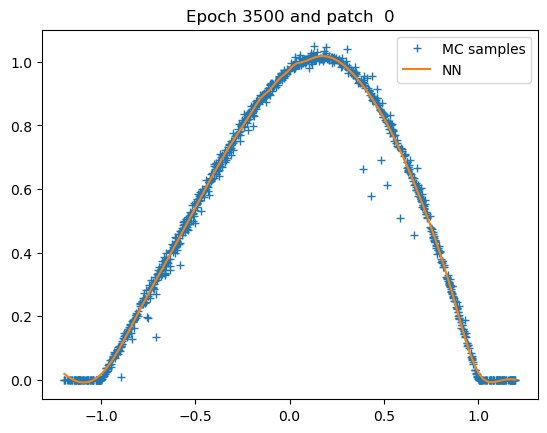

Patch  0: epoch 4000 with loss 5.14E-04


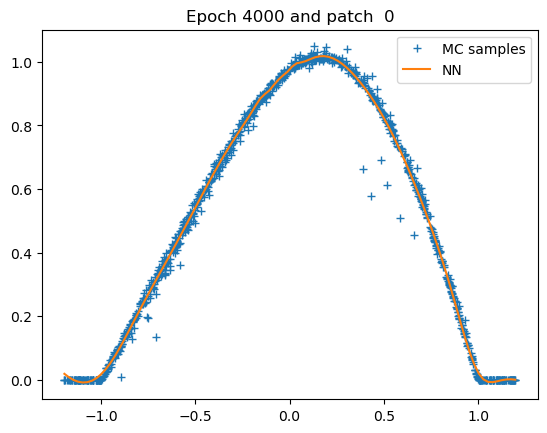

Patch  0: epoch 4500 with loss 5.13E-04


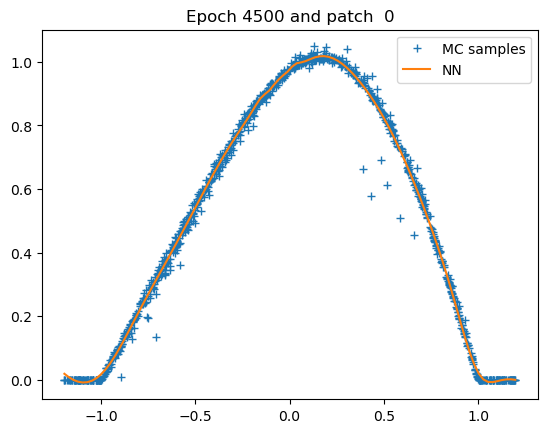

Patch  0: epoch 4999 with loss 5.13E-04


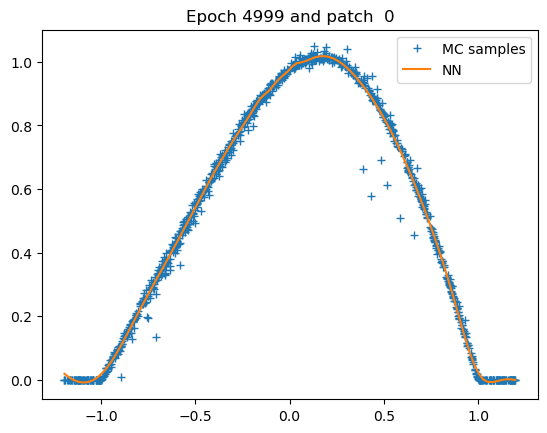

Patch 0: training of u with 5000 epochs take 39.716620683670044 seconds.
/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:74: RuntimeWarning: divide by zero encountered in divide
  branch_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())
Logs are saved in /home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/logs/tmp


Time taken: 2695 seconds; L1 error: 2.46E-02; L2 error: 1.03E-03; rel error: INF.
fdb runtime: 120 seconds; total runtime: 2815 seconds.
#### Starting deep galerkin method with seed 0 - 1 out of 1 times


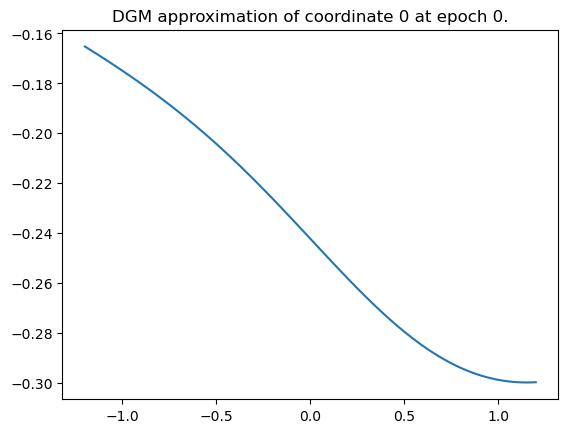

Epoch 0 with loss 1.0535392761230469


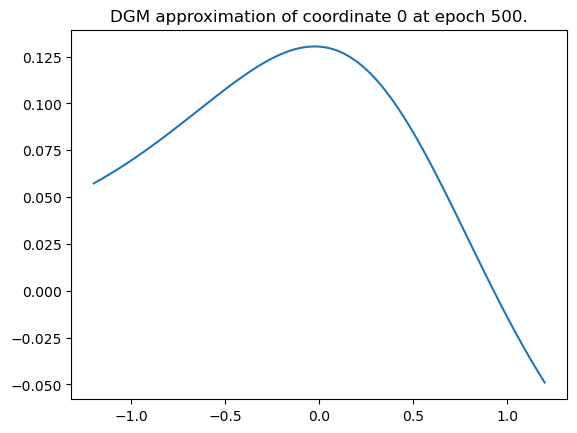

Epoch 500 with loss 0.456920325756073


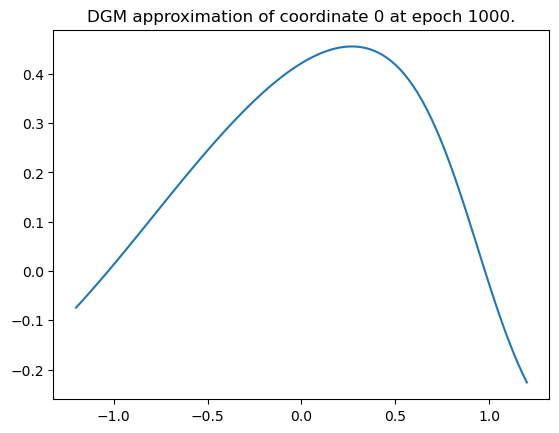

Epoch 1000 with loss 0.29912689328193665


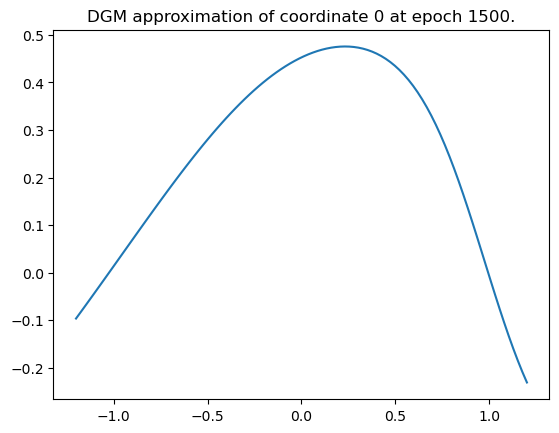

Epoch 1500 with loss 0.2740591764450073


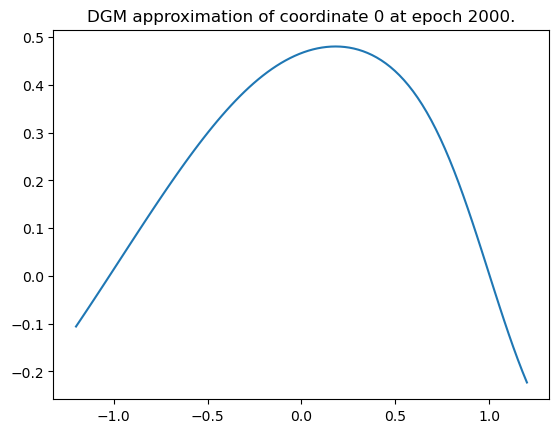

Epoch 2000 with loss 0.26353728771209717


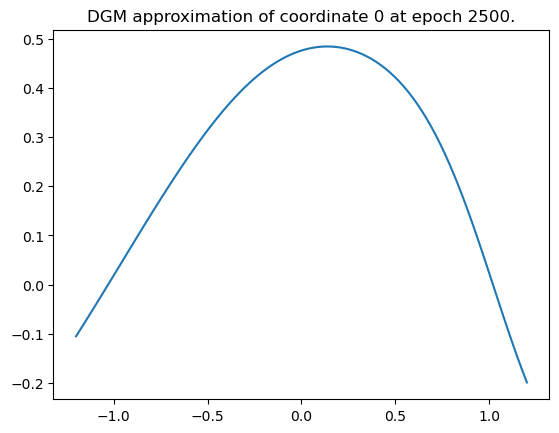

Epoch 2500 with loss 0.26618492603302


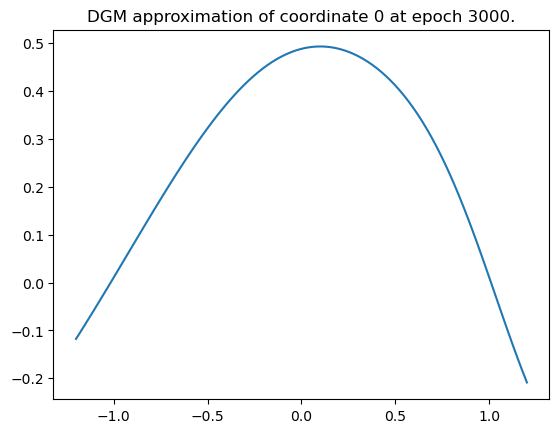

Epoch 3000 with loss 0.26228633522987366


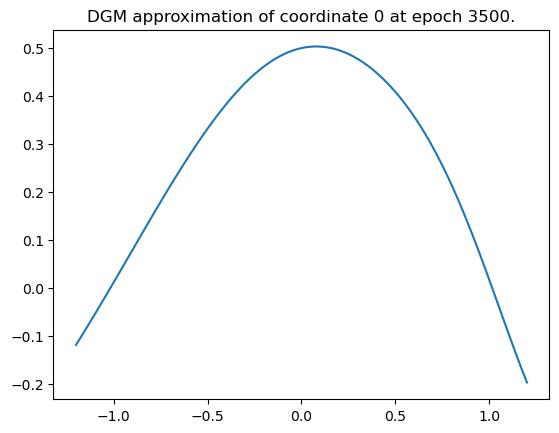

Epoch 3500 with loss 0.264432817697525


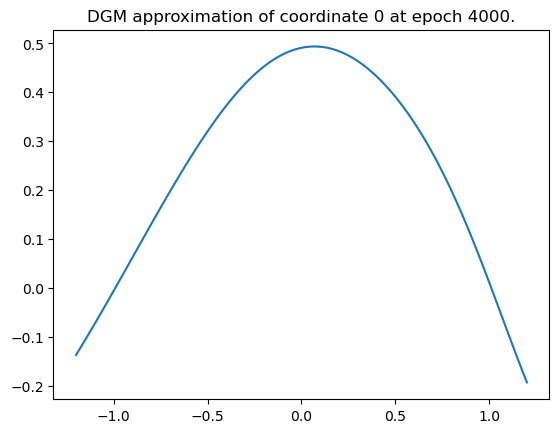

Epoch 4000 with loss 0.2541009187698364


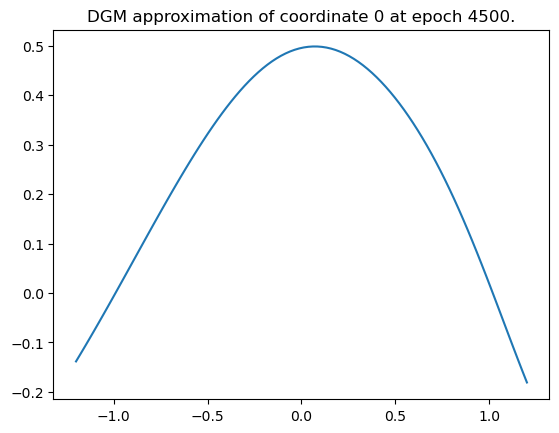

Epoch 4500 with loss 0.25017133355140686


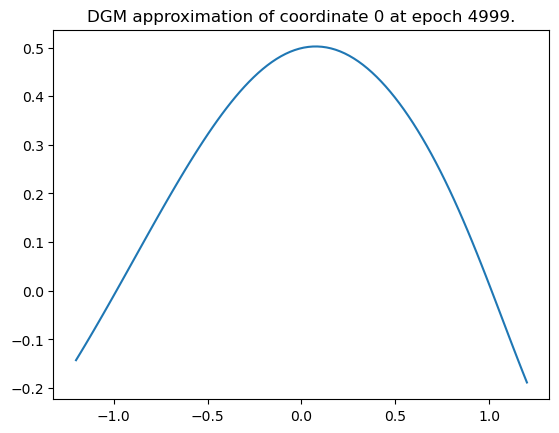

Epoch 4999 with loss 0.24878671765327454
Training of neural network with 5000 epochs take 806.4707663059235 seconds.


Time taken: 807 seconds; L1 error: 2.80E-01; L2 error: 9.93E-02; rel error: INF.
#### Starting deep BSDE method with seed 0 - 1 out of 1 times


/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:101: RuntimeWarning: divide by zero encountered in divide
  dgm_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())


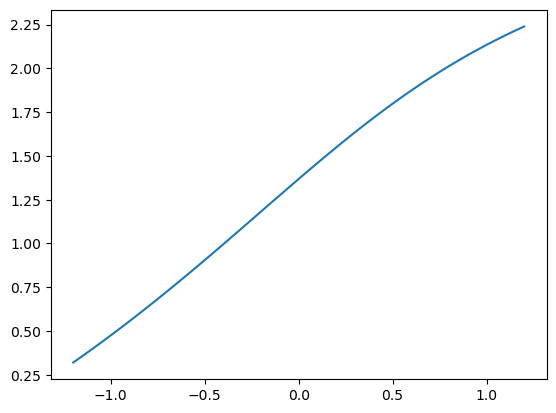

Epoch 0 with loss 1.4980647563934326


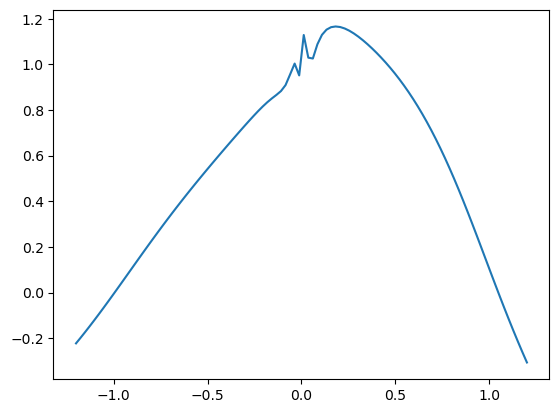

Epoch 500 with loss 0.006196605507284403


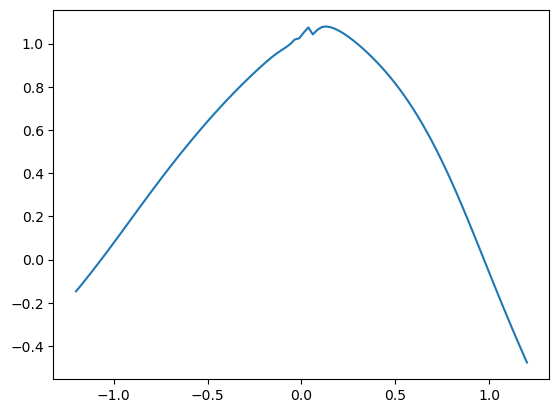

Epoch 1000 with loss 0.0022264905273914337


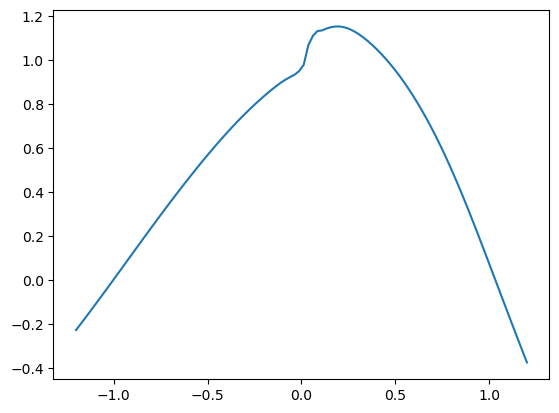

Epoch 1500 with loss 0.004625043366104364


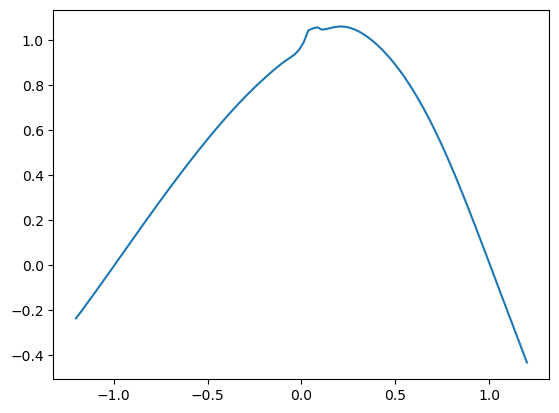

Epoch 2000 with loss 0.001030422281473875


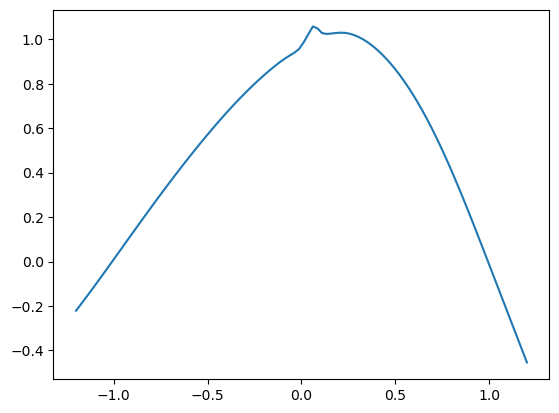

Epoch 2500 with loss 0.00035144126741215587


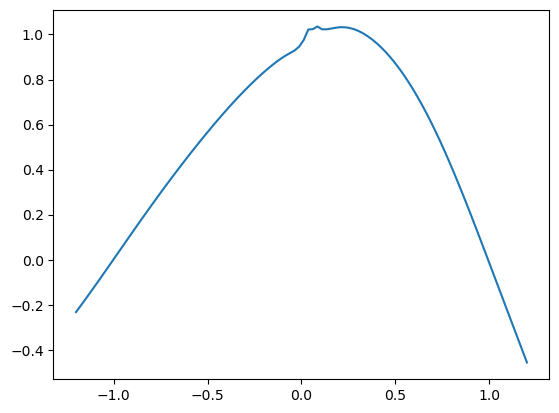

Epoch 3000 with loss 0.000356879347236827


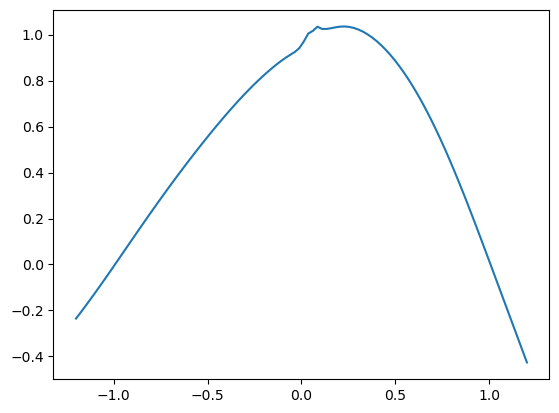

Epoch 3500 with loss 0.0008221383322961628


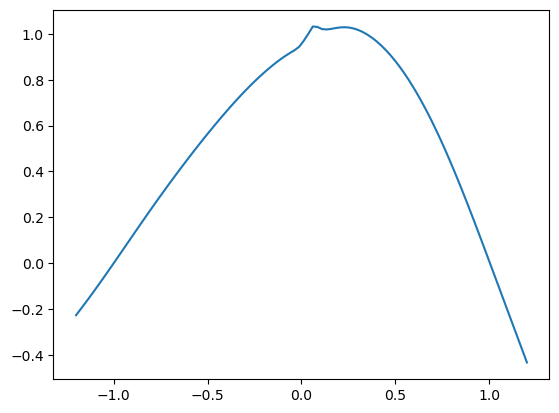

Epoch 4000 with loss 0.0006264413823373616


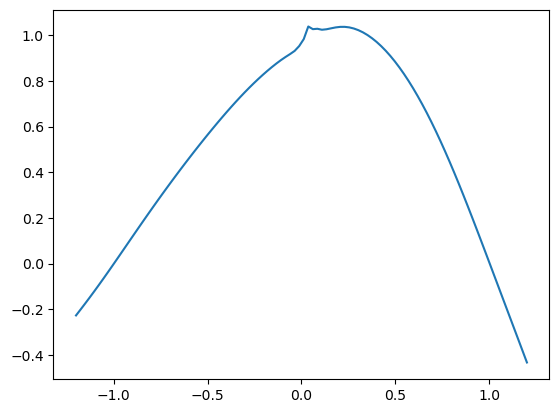

Epoch 4500 with loss 0.0003034960536751896


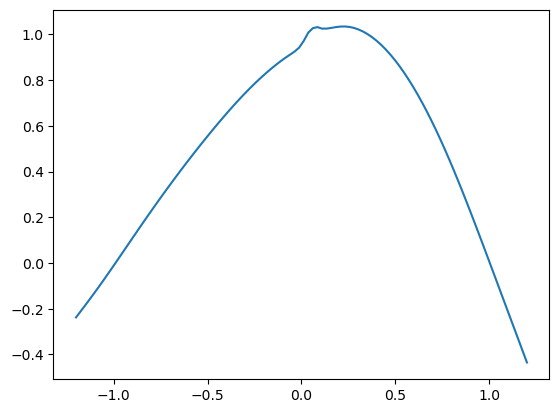

Epoch 4999 with loss 0.00082432507770136
Training of neural network with 5000 epochs take 231.7811357975006 seconds.
Time taken: 232 seconds; L1 error: 3.36E-02; L2 error: 2.18E-03; rel error: INF.




######## Summary for deep branching method
runtime:        2695
fdb runtime:    120
total runtime:  2815
mean L1 error:  2.46E-02
std L1 error:   0.00E+00
mean L2 error:  1.03E-03
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


######## Summary for deep galerkin method
runtime:        807
mean L1 error:  2.80E-01
std L1 error:   0.00E+00
mean L2 error:  9.93E-02
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


######## Summary for deep BSDE method
runtime:        232
mean L1 error:  3.36E-02
std L1 error:   0.00E+00
mean L2 error:  2.18E-03
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:129: RuntimeWarning: divide by zero encountered in divide
  bsde_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)


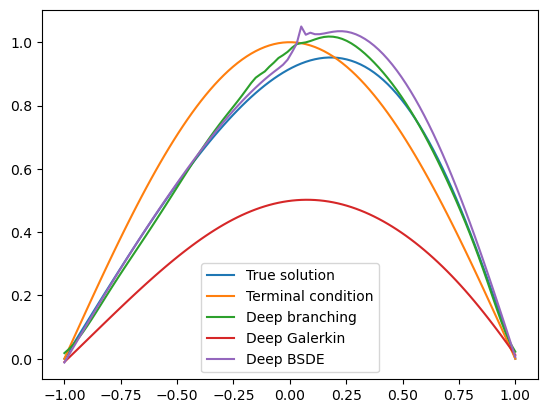

In [14]:
dim = 9
T=0.1/dim
grid_d_dim = np.concatenate((x_mid * np.ones((0, 100)), np.expand_dims(grid, axis=0), x_mid * np.ones((dim - 1, 100))), axis=0)
grid_d_dim_with_t = np.concatenate((t_lo * np.ones((1, 100)), grid_d_dim), axis=0)    
true = exact_example(t_lo, grid_d_dim, T)
terminal = exact_example(T, grid_d_dim, T)
deriv_map = np.concatenate((np.array([[0] * dim]), 1 * np.identity(dim), 2 * np.identity(dim)), axis=0).astype(int)

# Performance comparison
compare_performance(grid, grid_d_dim, grid_d_dim_with_t, t_lo, true, terminal=terminal, seeds=[0],
                    # disable_branch=True,
                    # disable_bsde=True, 
                    # disable_galerkin=True, 
                    verbose=True, debug_mode=True, 
                    conditional_probability_to_survive=partial(conditional_probability_to_survive),
                    is_x_inside=partial(is_x_inside), 
                    y_lo=x_lo, y_hi=x_hi, nu=nu,
                    T=T, device=device, epochs=5000, fname="burgers",
                    branch_nb_states=1000, branch_nb_path_per_state=3000,
                    branch_patches=1, branch_exponential_lambda=-math.log(.95)/T,
                    branch_nb_states_per_batch=1000,
                    second_order=True, bsde_nb_states=1000, bsde_nb_time_intervals=4,
                    dgm_nb_states=10000, f_fun=f_example, dgm_f_fun=dgm_f_example,
                    deriv_map=deriv_map, dgm_deriv_map=deriv_map, phi_fun=phi_example,
                    boundary_fun=boundary_fun, dgm_overtrain_rate=0, outlier_percentile=5,
                    lr_gamma=0.1, branch_lr=1e-2, branch_activation="tanh", neurons=20, layers=8,
                    save_for_best_model=False, save_as_tmp=True)

## dim = 10

#### Starting deep branching method with seed 0 - 1 out of 1 times


Logs are saved in /home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/logs/tmp
Patch 0: generation of u samples take 3452.4631502628326 seconds.
Patch  0: epoch    0 with loss 9.58E-01


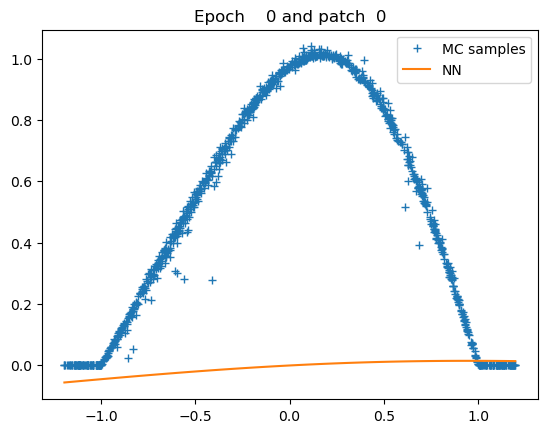

Patch  0: epoch  500 with loss 5.01E-04


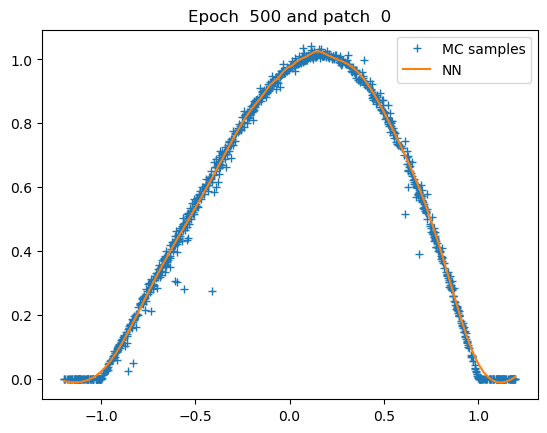

Patch  0: epoch 1000 with loss 7.27E-04


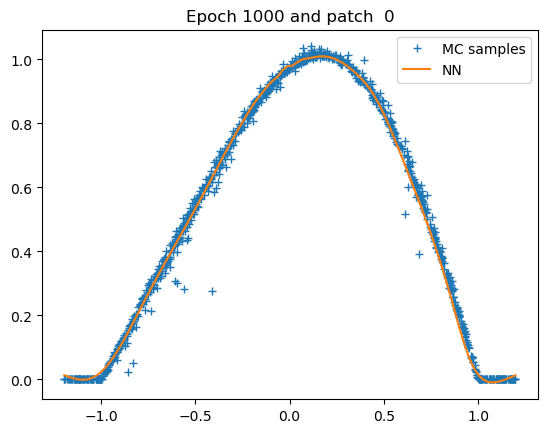

Patch  0: epoch 1500 with loss 4.71E-04


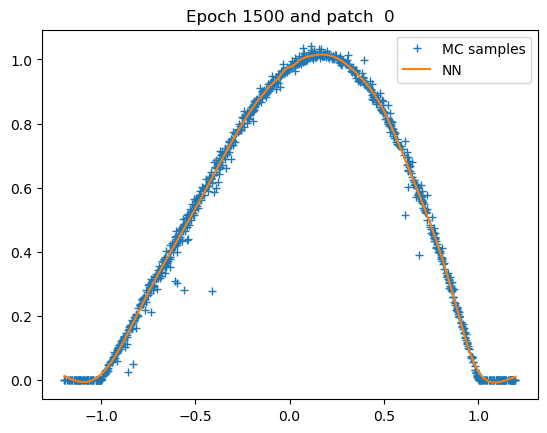

Patch  0: epoch 2000 with loss 4.69E-04


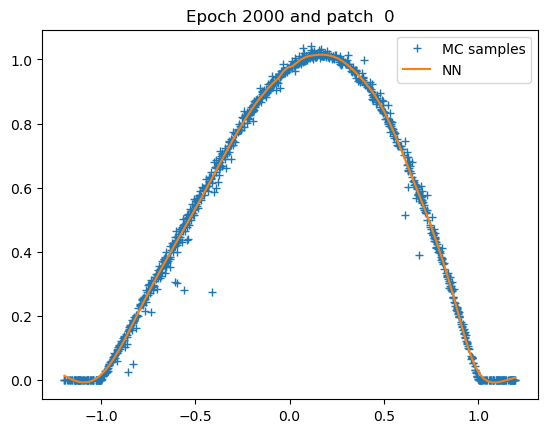

Patch  0: epoch 2500 with loss 4.69E-04


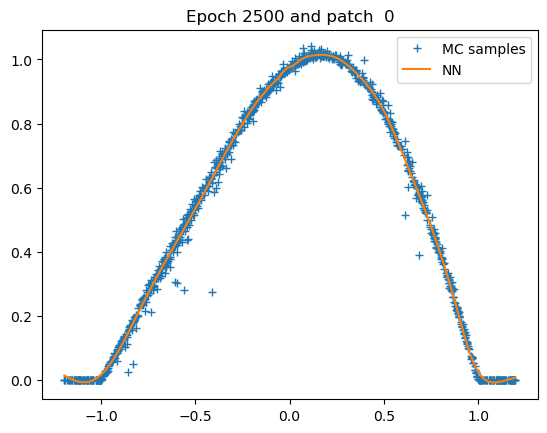

Patch  0: epoch 3000 with loss 4.69E-04


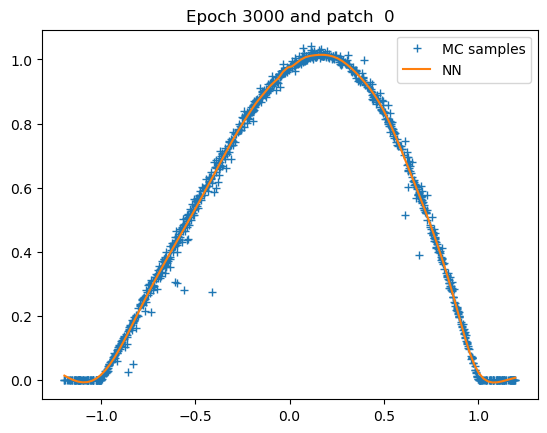

Patch  0: epoch 3500 with loss 4.69E-04


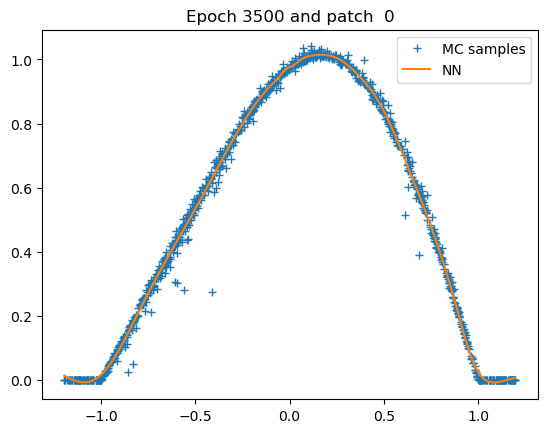

Patch  0: epoch 4000 with loss 4.68E-04


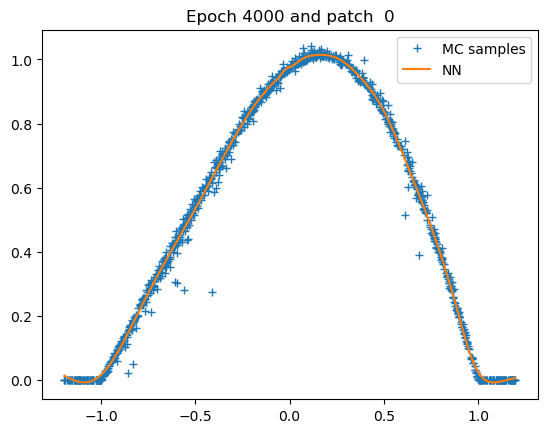

Patch  0: epoch 4500 with loss 4.68E-04


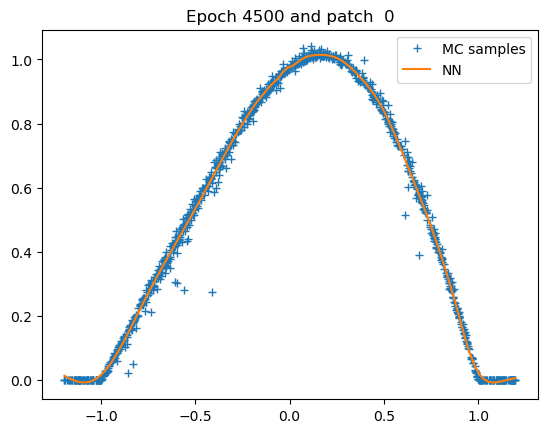

Patch  0: epoch 4999 with loss 4.67E-04


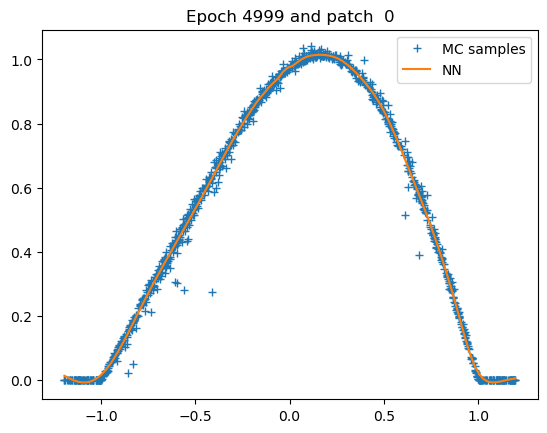

Patch 0: training of u with 5000 epochs take 31.955248594284058 seconds.
/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:74: RuntimeWarning: divide by zero encountered in divide
  branch_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())
Logs are saved in /home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/logs/tmp


Time taken: 3194 seconds; L1 error: 2.64E-02; L2 error: 1.11E-03; rel error: INF.
fdb runtime: 294 seconds; total runtime: 3488 seconds.
#### Starting deep galerkin method with seed 0 - 1 out of 1 times


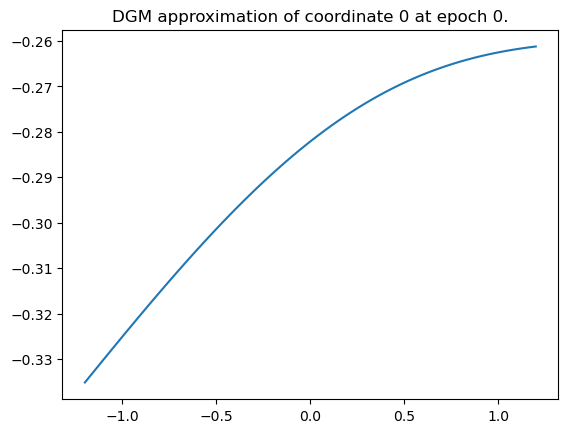

Epoch 0 with loss 1.430119276046753


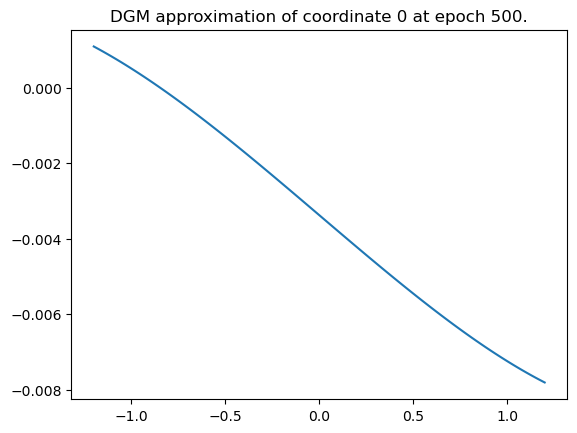

Epoch 500 with loss 0.49700602889060974


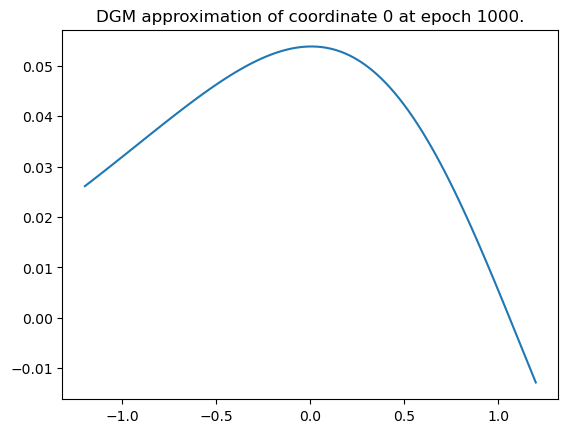

Epoch 1000 with loss 0.4874413311481476


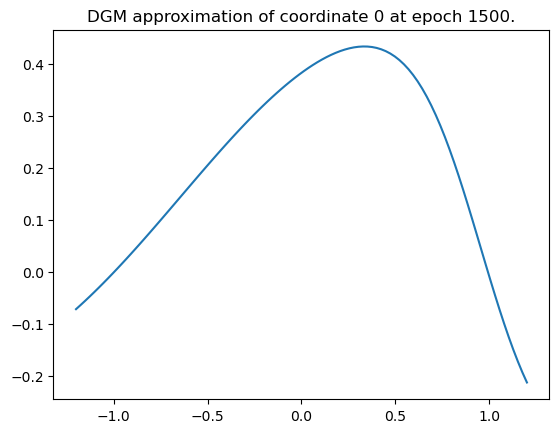

Epoch 1500 with loss 0.34094876050949097


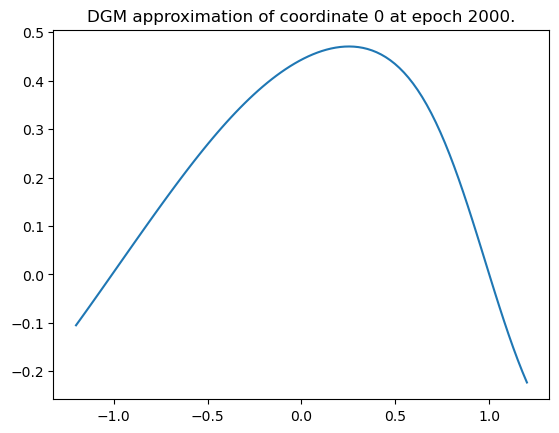

Epoch 2000 with loss 0.2948737144470215


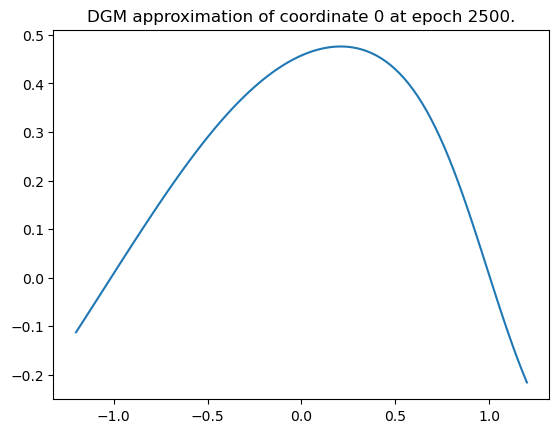

Epoch 2500 with loss 0.28089526295661926


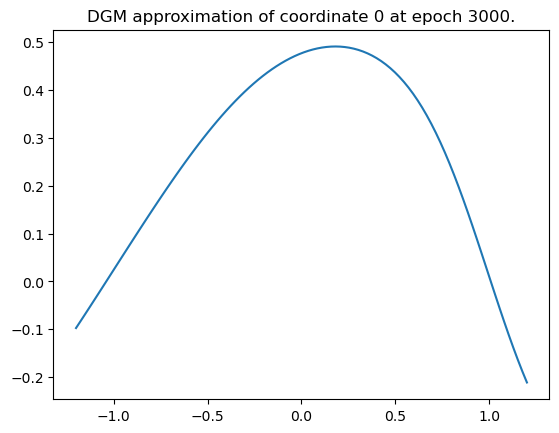

Epoch 3000 with loss 0.28905153274536133


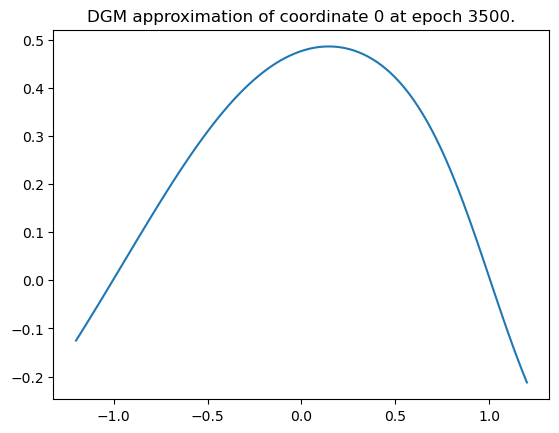

Epoch 3500 with loss 0.26455023884773254


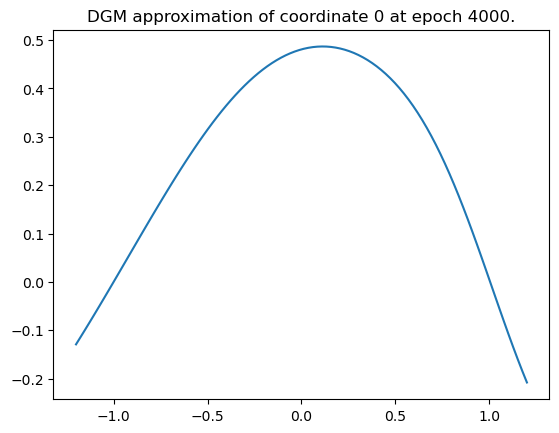

Epoch 4000 with loss 0.2609170377254486


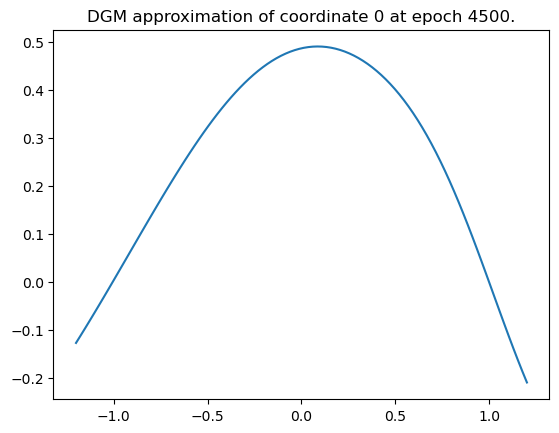

Epoch 4500 with loss 0.25800007581710815


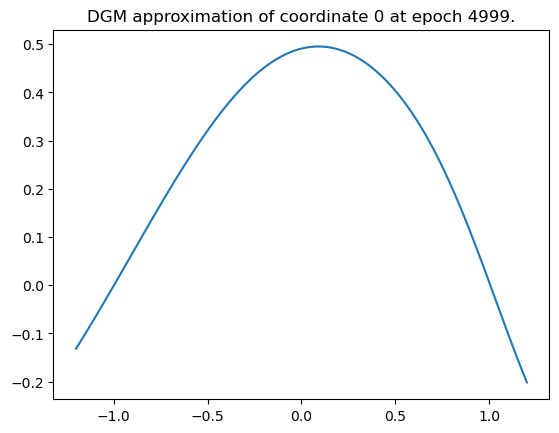

Epoch 4999 with loss 0.2559649646282196
Training of neural network with 5000 epochs take 905.3836123943329 seconds.


Time taken: 906 seconds; L1 error: 2.80E-01; L2 error: 9.96E-02; rel error: INF.
#### Starting deep BSDE method with seed 0 - 1 out of 1 times


/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:101: RuntimeWarning: divide by zero encountered in divide
  dgm_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())


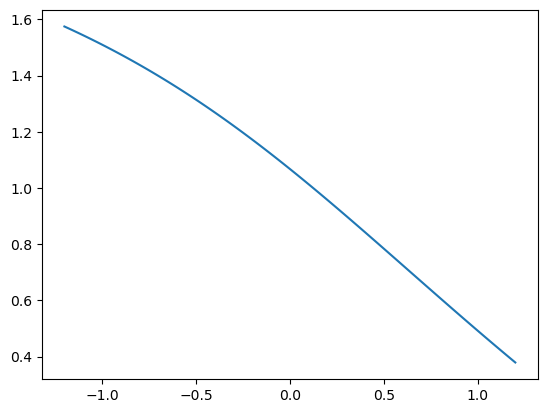

Epoch 0 with loss 1.7570359706878662


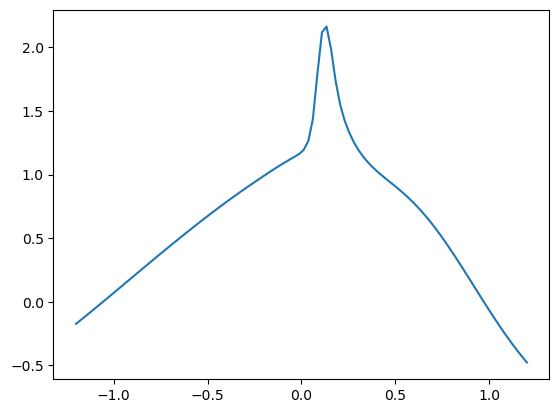

Epoch 500 with loss 0.0030450804624706507


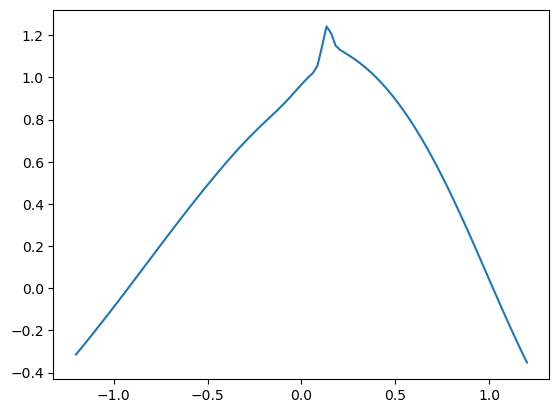

Epoch 1000 with loss 0.002130775945261121


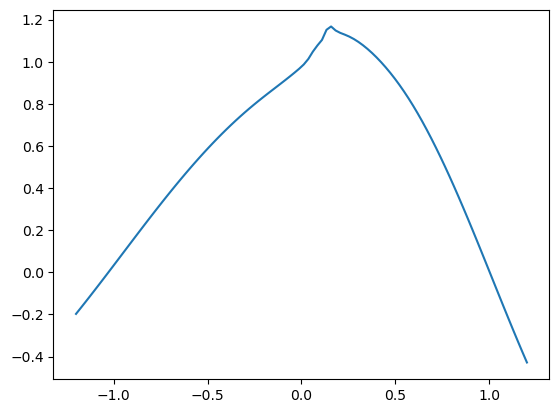

Epoch 1500 with loss 0.0010209525935351849


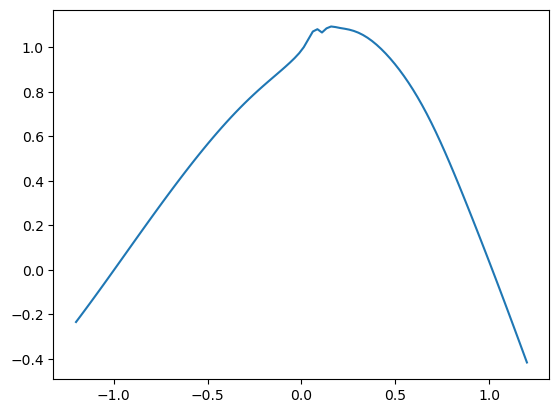

Epoch 2000 with loss 0.0005697107408195734


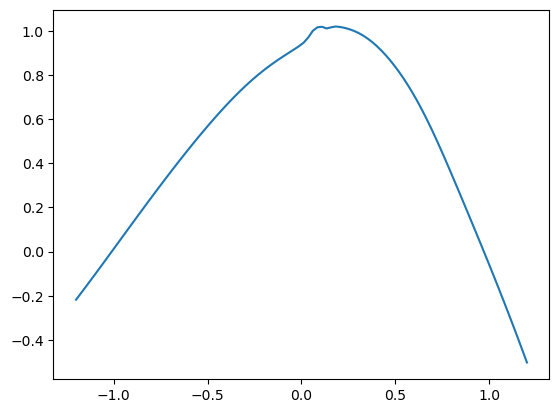

Epoch 2500 with loss 0.0003825159801635891


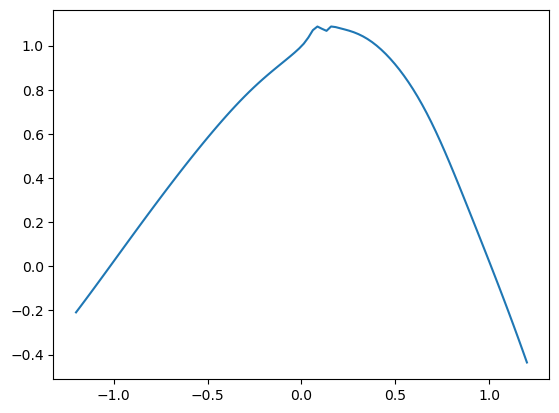

Epoch 3000 with loss 0.0006787637830711901


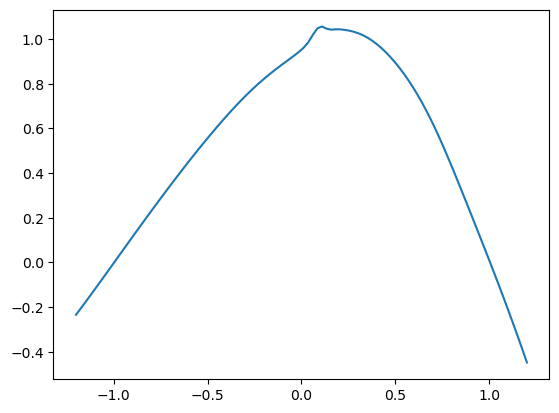

Epoch 3500 with loss 0.0005509019247256219


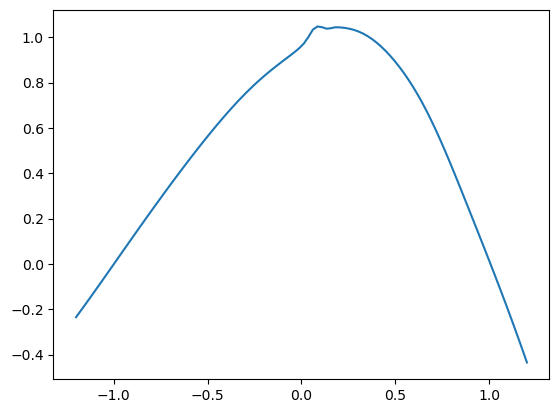

Epoch 4000 with loss 0.0016861852491274476


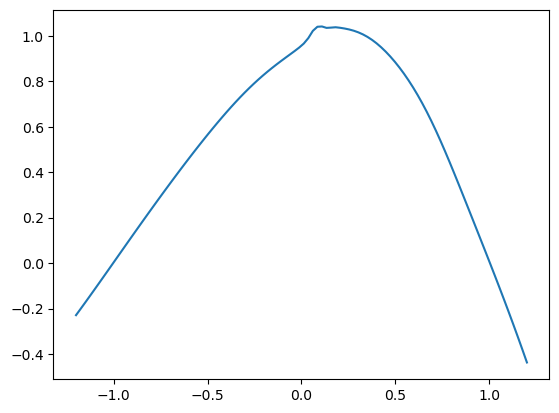

Epoch 4500 with loss 0.0003515642893034965


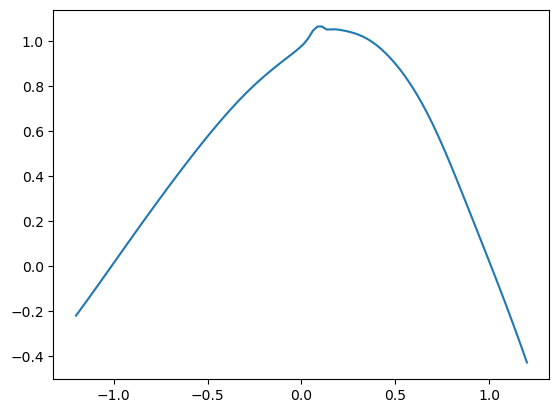

Epoch 4999 with loss 0.00046104355715215206
Training of neural network with 5000 epochs take 216.830411195755 seconds.
Time taken: 217 seconds; L1 error: 5.01E-02; L2 error: 3.53E-03; rel error: INF.




######## Summary for deep branching method
runtime:        3194
fdb runtime:    294
total runtime:  3488
mean L1 error:  2.64E-02
std L1 error:   0.00E+00
mean L2 error:  1.11E-03
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


######## Summary for deep galerkin method
runtime:        906
mean L1 error:  2.80E-01
std L1 error:   0.00E+00
mean L2 error:  9.96E-02
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


######## Summary for deep BSDE method
runtime:        217
mean L1 error:  5.01E-02
std L1 error:   0.00E+00
mean L2 error:  3.53E-03
std L2 error:   0.00E+00
mean rel error: INF
std rel error:  NAN


/home/nprivault/NTU/FYP/23-24/david_tey/deep-learning-pde-solvers-evaluation/notebooks/../utilities/compare_performance.py:129: RuntimeWarning: divide by zero encountered in divide
  bsde_rel_error.append((np.abs(tmp - true) / np.abs(true)).mean())
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)


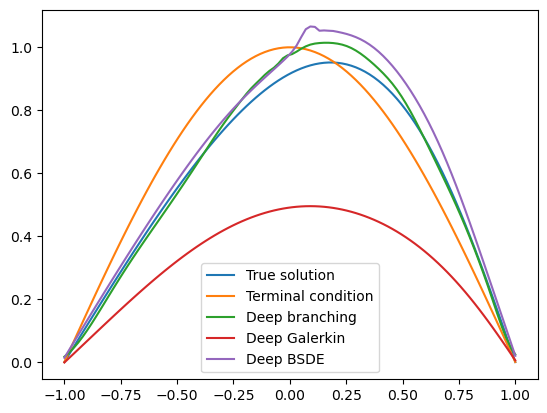

In [15]:
dim = 10
T=0.1/dim
grid_d_dim = np.concatenate((x_mid * np.ones((0, 100)), np.expand_dims(grid, axis=0), x_mid * np.ones((dim - 1, 100))), axis=0)
grid_d_dim_with_t = np.concatenate((t_lo * np.ones((1, 100)), grid_d_dim), axis=0)    
true = exact_example(t_lo, grid_d_dim, T)
terminal = exact_example(T, grid_d_dim, T)
deriv_map = np.concatenate((np.array([[0] * dim]), 1 * np.identity(dim), 2 * np.identity(dim)), axis=0).astype(int)

# Performance comparison
compare_performance(grid, grid_d_dim, grid_d_dim_with_t, t_lo, true, terminal=terminal, seeds=[0],
                    # disable_branch=True,
                    # disable_bsde=True, 
                    # disable_galerkin=True, 
                    verbose=True, debug_mode=True, 
                    conditional_probability_to_survive=partial(conditional_probability_to_survive),
                    is_x_inside=partial(is_x_inside), 
                    y_lo=x_lo, y_hi=x_hi, nu=nu,
                    T=T, device=device, epochs=5000, fname="burgers",
                    branch_nb_states=1000, branch_nb_path_per_state=3000,
                    branch_patches=1, branch_exponential_lambda=-math.log(.95)/T,
                    branch_nb_states_per_batch=1000,
                    second_order=True, bsde_nb_states=1000, bsde_nb_time_intervals=4,
                    dgm_nb_states=10000, f_fun=f_example, dgm_f_fun=dgm_f_example,
                    deriv_map=deriv_map, dgm_deriv_map=deriv_map, phi_fun=phi_example,
                    boundary_fun=boundary_fun, dgm_overtrain_rate=0, outlier_percentile=5,
                    lr_gamma=0.1, branch_lr=1e-2, branch_activation="tanh", neurons=20, layers=8,
                    save_for_best_model=False, save_as_tmp=True)